### Initialization :

Mount Google Drive on colab.

If you've downloaded database manually, you don't need this cell

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Import required modules

In [ ]:
import networkx as nx
from datetime import *
import sqlite3
import matplotlib.pyplot as plt
from collections import defaultdict
import numpy as np
import seaborn as sns
import pandas as pd
from scipy.optimize import curve_fit

### Plot functions :

Plot a graph

In [ ]:
def plot_graph(graph, node_size=60) -> None:
    nx.draw(graph, with_labels=False, node_size=node_size)
    plt.figure(3, figsize=(12, 12))
    plt.show()

Plot degree distribution 

In [ ]:
def plot_degree_histogram(description: dict):
  plt.hist(description['degree_distribution_of_vertices'])
  plt.show()

Plot communities size

In [ ]:
def plot_communities_size_histogram(description: dict):
  plt.hist(description['communities_size'])
  plt.show()

Plot tree hierarchy with given information

In [ ]:
def plot_tree_hierarchy(information: dict):
  trees = []
  for key in information.keys():
    if information[key][1] != float('inf'):
      trees.append(information[key][1])
  plt.plot(trees)
  plt.show()

Plot leaf numbers of given information

In [ ]:
def plot_leaf_numbers(information: dict):
  leaf_numbers = []
  for key in information.keys():
    if information[key][0] != float('inf'):
      leaf_numbers.append(information[key][0])
  plt.plot(leaf_numbers)
  plt.show()

Plot a feature in a specific time line

In [ ]:
def plot_features_year_to_year(year_description: dict, feature_name:str) -> None:
  years = [year for year in year_description.keys()]
  features = [year_description[year][feature_name] for year in years]
  plt.plot(years, features)
  plt.grid()
  plt.xlabel('Years')
  plt.ylabel(feature_name)
  plt.show()
  if feature_name == 'number_of_nodes' or feature_name == 'number_of_edges' or feature_name == 'weights_sum':
      new_years = []
      for i in range(len(years) - 1):
          new_years.append(str(years[i]) + '-'+ str(years[i+1]))
      new_features = np.diff(features)
      plt.plot(new_years, new_features)
      plt.grid()
      plt.xlabel("Years")
      plt.ylabel("Differentiation of " + feature_name)
      plt.show()

Plot ditribution of an array

In [ ]:
def plot_distribution(arr) -> None:
  plt.hist(arr)
  plt.show()

Plot specific feature over time in scatter mode with quadratic polynomial fitted curve

In [ ]:
def plot_features_year_to_year_scatter(year_description: dict, feature_name: str) -> None:
    years = [year for year in year_description.keys()]
    features = [year_description[year][feature_name] for year in years]
    plt.scatter(years, features)
    plt.grid()
    plt.xlabel('Years')
    plt.ylabel(feature_name)
    coef = np.polyfit(years, features, 2)
    print(coef)
    new_x = np.linspace(min(years), max(years), num=np.size(years) * 100)
    new_line = np.polyval(coef, new_x)
    plt.scatter(new_x,new_line,c='g', marker='^', s=5)
    plt.xlabel("years")
    plt.ylabel(feature_name)
    plt.show()

Plot features year to year with exponential fitted curve

In [ ]:
def plot_features_year_to_year_expo(year_description: dict, feature_name: str) -> None:
    years = [year for year in year_description.keys()]
    features = [year_description[year][feature_name] for year in years]
    plt.scatter(years, features)
    plt.grid()
    plt.xlabel('Years')
    plt.ylabel(feature_name)
    popt, pcov = curve_fit(lambda t, a, b, c: a * np.exp(b * t) + c, years, features)
    a = popt[0]
    b = popt[1]
    c = popt[2]
    print('a =', a)
    print('b =', b)
    print('c =', c)
    new_x = np.linspace(min(years), max(years), num=np.size(years) * 100)
    new_fun = a * np.exp(b * new_x) + c
    plt.plot(new_x, new_fun, 'k', label='Fitted curve')
    plt.legend()
    plt.xlabel('years')
    plt.ylabel(feature_name)
    plt.show()

Plot a specific feature in years for comparison

In [ ]:
def plot_features_year_to_year_scatter_comparison(year_description1: dict, year_description2:dict, feature_name: str) -> None:
    years1 = [year for year in year_description1.keys()]
    features1 = [year_description1[year][feature_name] for year in years1]
    years2 = [year for year in year_description2.keys()]
    features2 = [year_description2[year][feature_name] for year in years2]
    plt.scatter(years1, features1, c='b')
    plt.scatter(years2, features2, c='r')
    coef1 = np.polyfit(years1, features1, 2)
    coef2 = np.polyfit(years2, features2, 2)
    print("First group coefficients:",coef1)
    print("Second group coefficients:", coef2)
    new_x1 = np.linspace(min(years1), max(years1), num=np.size(years1) * 100)
    new_line1 = np.polyval(coef1, new_x1)
    new_x2 = np.linspace(min(years2), max(years2), num=np.size(years2) * 100)
    new_line2 = np.polyval(coef2, new_x2)
    plt.scatter(new_x1,new_line1,c='darkblue', marker='^', s=5)
    plt.scatter(new_x2, new_line2, c="darkred", marker='^', s=5)
    plt.xlabel("years")
    plt.ylabel(feature_name)
    plt.legend(['First group actual data','Second group actual data', 'First group fitted curve', 'Second group fitted curve'])
    plt.show()

Plot 4D figure for questions

In [ ]:
def plot_4D_Questions(data_frame: pd.DataFrame) -> None:
    sns.set_theme(style="white")
    cmap = sns.color_palette("ch:s=.25,rot=-.25", as_cmap=True)
    rel_plot = sns.relplot(x="Days", y="Duration", size="Comments number", hue="Question Visit",
                sizes=(40, 400), alpha=.8, palette=cmap,
                height=10, data=data_frame)
    plt.grid()
    plt.show()

Plot 4D figure for users

In [ ]:
def plot_4D_Users(data_frame: pd.DataFrame) -> None:
    sns.set_theme(style="white")
    cmap = sns.color_palette("ch:s=.25,rot=-.25", as_cmap=True)
    rel_plot = sns.relplot(x="First Activity(Day)", y="Last - First activity(Day)", size="Post counts",
                sizes=(40, 400), alpha=.8, palette=cmap,
                height=10, data=data_frame)
    plt.grid()
    plt.show()

In [ ]:
def plot_degree_distribution(description: dict) -> None:
    summation = sum(description['degree_distribution_of_vertices'])
    arr = [description['degree_distribution_of_vertices'][i]/summation for i in range(len(description['degree_distribution_of_vertices']))]
    plt.hist(arr)
    plt.show()

In [ ]:
def plot_communities_distribution(description: dict) -> None:
    summation = sum(description['communities_size'])
    arr = [description['communities_size'][i] / summation for i in range(len(description['communities_size']))]
    plt.hist(arr)
    plt.show()

### User, Question, Comment and ResultData classes and functions:

This function convert string format of date in comments and questions to datetime object in python

In [ ]:
def stringToDate_posts(date_str: str):
    try:
      # For majority class of data: yyyy/mm/dd HH:MM
      li = date_str.split()
      date = li[0]
      time = li[1]
      date = date.split('/')
      time = time.split(":")
      year = int(date[0])
      month = int(date[1])
      day = int(date[2])
      if day > 28:
        day -= 3
      hour = int(time[0])
      minute = int(time[1])
      answer = datetime(2018, 6, 1)
      answer = answer.replace(year=year, month=month, day=day, hour=hour, minute=minute)
    except:
      # For some misvalues 
      li = date_str.split()
      day_name = li[0]
      month = li[1]
      day = int(li[2])
      ti = li[3].split(':')
      hour = int(ti[0])
      minute = int(ti[1])
      year = int(li[5])
      answer = datetime(2018, 6, 1)
      answer = answer.replace(year=year, month=1, hour=hour, minute=minute)
    return answer

This function converts string format of date in users' signUpDate to datetime object in python 

In [ ]:
def stringToDate_users(date_str: str):
    li = date_str.split()
    day = int(li[2])
    month = int(li[3].split(":")[1])
    year = int(li[5])
    answer = datetime(2018, 6, 1)
    if day >= 29:
        day -= 5
    answer = answer.replace(year=year, month=month, day=day)
    return answer

This function returns day difference between given time and start time

In [ ]:
def dateTime_to_int(time: datetime, start_time: datetime) -> int:
    # This method get's time and start_time and returns number of days in difference
    year_diff = time.year - start_time.year
    month_diff = time.month - start_time.month
    day_diff = time.day - start_time.day
    answer = year_diff * 365 + month_diff * 30 + day_diff
    return answer

Question class

In [ ]:
class Question:
    def __init__(self, QID: str, QUserID: str, QTitle: str, QBody: str, QDate: str, QVisit: int):
        self.QID = QID
        self.QUserID = QUserID
        self.QBody = QBody
        self.QTitle = QTitle
        self.QDate = stringToDate_posts(QDate)
        self.QVisit = QVisit

    def __repr__(self):
        return "[QID : {0}, QUserID : {1}, QTitle : {2}, QDate : {3}, QVisit : {4}]".format(self.QID, self.QUserID,
                                                                                            self.QTitle, self.QDate,
                                                                                            self.QVisit)

    # def __eq__(self, other):
    # return self.QID == other.QID


User class

In [ ]:
class User:
    def __init__(self, UserID: str, Username: str, Description: str, SignUpDate: str, PostCount: int):
        self.UserID = UserID
        self.Username = Username
        self.Description = Description
        self.SignUpDate = stringToDate_users(SignUpDate)
        self.PostCount = PostCount

    def __repr__(self):
        print(self.UserID)
        return "[UserID : {0}, Username : {1}, Description : {2}, SignUpDate : {3}, PostCount : {4}]".format(
            self.UserID, self.Username, self.Description, self.SignUpDate, self.PostCount)

    # def __eq__(self, other):
    # return self.UserID == other.UserID

Comment class

In [ ]:
class Comment:
    def __init__(self, CID: str, QID: str, CUserID: str, CBody: str, CDate: str, isReply: bool, ParentID: str):
        self.CID = CID
        self.QID = QID
        self.CUserID = CUserID
        self.CBody = CBody
        self.CDate = stringToDate_posts(CDate)
        self.isReply = isReply
        self.ParentID = ParentID

    def __repr__(self):
        return "[CID: {}, QID : {}, CUserID : {}, CBody : {}, CDate : {}, isReply : {}, ParentID : {}]".format(self.CID,
                                                                                                               self.QID,
                                                                                                               self.CUserID,
                                                                                                               self.CBody,
                                                                                                               self.CDate,
                                                                                                               self.isReply,
                                                                                                               self.ParentID)

    # def __eq__(self, other):
    # return self.CID == other.CID

ResultData class which handle ExportData table in database

In [ ]:
class ResultData:
    def __init__(self, QID: str, QUserID: str, QTitle: str, QBody: str, QDate: str, QVisit: int, CID: str, CUserID: str,
                 CBody: str, CDate: str, isReply: bool, ParentID: str):
        self.QID = QID
        self.QUserID = QUserID
        self.QTitle = QTitle
        self.QBody = QBody
        self.QDate = stringToDate_posts(QDate)
        self.QVisit = QVisit
        self.CID = CID
        self.CUserID = CUserID
        self.CBody = CBody
        self.CDate = stringToDate_posts(CDate)
        self.isReply = isReply
        self.ParentID = ParentID

    def __repr__(self):
        return "[QID: {}, QUserID: {}, QTitle: {}, QBody: {}, QDate: {}, QVisit: {}, CID: {}, CUserID: {}, CBody: {}, CDate: {}, isReply: {}, ParentID: {}]".format(
            self.QID, self.QUserID, self.QTitle, self.QBody, self.QDate, self.QVisit, self.CID, self.CUserID,
            self.CBody, self.CDate, self.isReply, self.ParentID)

    # def __eq__(self, other):
    # return self.CID == other.CID


### GraphAnalysis class and functions :

Features names

In [ ]:
features_names = ['number_of_nodes', 'number_of_edges', 'edges', 'weights_sum', 'is_connected', 'number_connected_components', 'connected_components', 'global_efficiency', 'local_efficiency', 'graph_clustering', 'nodes_info', 'degree_distribution_of_vertices', 'communities_size', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality', 'average_shortest_path_length', 'tree_hierarchy', 'small_worldness_omega', 'small_worldness_sigma', 'transitivity', 'diameter']

\begin{align}
\text{Weight manipulation formula: } &W_2 = \frac{1}{W_1}
\end{align}

In [ ]:
def weight_manipulation_function(weight: float)->float:
  return 1 / weight

This function reweight a graph with respect to weight_manipulation_function

In [ ]:
def reweight_graph(graph) -> nx.Graph:
  answer = graph.copy()
  for e in answer.edges(data=True):
    e[2]['weight'] = weight_manipulation_function(e[2]['weight'])
  return answer

This function gets a graph and return maximum degree of that graph

In [ ]:
def graph_max_degree(graph) -> int:
    degrees = []
    for node in graph:
        degrees.append(graph.degree(node))
    return max(degrees)


This method extracts all features from graph and put all of them as (key, value)

In [ ]:
from networkx.algorithms.centrality.betweenness import betweenness_centrality
def graph_description(graph) -> dict:
  answer = {}
  reweighted_graph = reweight_graph(graph)
  answer["number_of_nodes"] = graph.number_of_nodes() # Number of nodes in graph
  answer["number_of_edges"] = graph.number_of_edges() # Number of edges in graph
  edges = []
  weights=[]
  for u,v,a in graph.edges(data=True):
    edges.append([u, v, a])
    weights.append(a["weight"])
  # answer["edges"] = edges # Edges of this graph
  # answer["weights_sum"] = sum(weights) # Summation of weights
  # answer["is_connected"] = nx.is_connected(graph) # Graph connectivity
  # answer["number_connected_components"] = nx.number_connected_components(graph) # Number of connected components in graph
  answer["connected_components"] = list(nx.connected_components(graph)) # List of connected components with their nodes
  answer["global_efficiency"] = nx.global_efficiency(graph) # Global efficiency of the graph
  answer["local_efficiency"] = nx.local_efficiency(graph) # Local efficiency of the graph
  answer["average_clustering"] = nx.average_clustering(graph) # Average clustering of the graph
  # answer["graph_clustering"] = nx.clustering(graph) # Clustering of the graph
  vertices_degrees = []
  nodes_results = {}
  for node in graph.__iter__():
    nodes_results[node] = {'degree': graph.degree(node)}
    vertices_degrees.append(graph.degree(node))
  communities_size = []
  for community in answer["connected_components"]:
    communities_size.append(len(community))
  communities_size.sort()
  vertices_degrees.sort()
  # answer["nodes_info"] = nodes_results # Information about all nodes
  # answer["degree_distribution_of_vertices"] = vertices_degrees # Sorted list of each vertex's degree
  # answer["communities_size"] = communities_size # List of each component size
  # answer["degree_centrality"] = nx.degree_centrality(graph) # Dictionary of nodes and their normalized degree
  # answer["average_degree_centrality"] = np.mean(list(answer['degree_centrality'].values())) # Average degree centrality
  # answer["betweenness_centrality"] = nx.betweenness_centrality(reweighted_graph, weight='weight') # Betweenness centrality of the graph
  # answer["average_betweenness_centrality"] = np.mean(list(answer['betweenness_centrality'].values())) # Average betweenness centrality
  # answer["closeness_centrality"] = nx.closeness_centrality(reweighted_graph, distance='weight') # Closeness centrality of the graph
  # answer["average_closeness_centrality"] = np.mean(list(answer['closeness_centrality'].values())) # Average closeness centrality
  # answer["small_worldness_omega"] = nx.omega(graph) # Omega coefficient of small worldness in the graph
  # answer["small_worldness_sigma"] = nx.sigma(graph) # Sigma coefficient of small worldness in the graph
  # answer["transitivity"] = nx.transitivity(graph) # Transitivity of the graph
  # answer["max_degree"] = graph_max_degree(graph) # Max degree of graph
  # try:
    # answer["average_shortest_path_length"] = nx.average_shortest_path_length(graph) # Average shortest path length of the graph
  # except:
    # answer["average_shortest_path_length"] = None
  # answer["tree_hierarchy"] = tree_hierarchy(graph) # Tree Hierarchy of the graph
  # if answer["is_connected"]:
    # answer["diameter"] = nx.diameter(graph) # Diameter of the graph if it's connected
  # else:
    # answer["diameter"] = float('inf') # Diameter of the graph if it's not connected
  return answer

This function return adjacency matrix for given graph

In [ ]:
def get_adjacency_matrix(graph):
  return nx.adgacency_matrix(graph)

Compute number of leafs in given graph

In [ ]:
def leaf_number(graph: nx.Graph)-> int:
  answer = 0
  for node in graph.nodes():
    if graph.degree(node) == 1:
      answer +=1 
  return answer

Compute $T_H = \frac{L}{2mBC_{max}}$ for given graph

In [ ]:
def tree_hierarchy(graph: nx.Graph) -> float:
  leaf_num = leaf_number(graph)
  reweighted_graph = reweight_graph(graph)
  MST = nx.minimum_spanning_tree(reweighted_graph)
  m = len(MST.nodes()) - 1
  BC = nx.betweenness_centrality(MST)
  BC_max = BC[max(BC, key=BC.get)]
  if BC_max == 0 or m == 0:
    return float('inf')
  answer = leaf_num / (2 * m * BC_max)
  return answer

Return biggest connected component in given graph

In [ ]:
def get_biggest_connected_component(graph: nx.Graph):
  S = [graph.subgraph(c).copy() for c in nx.connected_components(graph)]
  answer_len = 0
  answer = None
  for s in S:
    if len(s) > answer_len:
      answer = s
      answer_len = len(s)
  return answer

GraphAnalysis class which handle all operations from raw data to complicated graphs

In [ ]:
class GraphAnalysis:
    def __init__(self, path: str) -> None: # Constructor
        self.users = [] # Users list
        self.questions = [] # Questions list
        self.comments = [] # Comments list
        self.get_data_from_database(path)

    def get_data_from_database(self, path: str) -> None:
        # This method connects to database with given path and load all users, questions and comments.
        sql_connection = sqlite3.connect(path)
        cursor = sql_connection.cursor()
        for row in cursor.execute('SELECT * FROM Users;'):
            u = User(row[0], row[1], row[2], row[3], row[4])
            self.users.append(u)
        for row in cursor.execute('SELECT * FROM Questions;'):
            q = Question(row[0], row[1], row[2], row[3], row[4], row[5])
            self.questions.append(q)
        for row in cursor.execute('SELECT * FROM Comments;'):
            c = Comment(row[0], row[1], row[2], row[3], row[4], row[5], row[6])
            self.comments.append(c)

    def get_user_by_UserID(self, UserID: str) -> User:
        # This method takes an UserID and returns it's User object
        for u in self.users:
            if u.UserID == UserID:
                return u
        return None

    def get_users_by_UserIDs(self, userIDs: list) -> list:
        # This method takes a list of UserIDs and returns list of User
        answer = []
        for id in userIDs:
          answer.append(self.get_user_by_UserID(id))
        return answer

    def get_questions_of_user(self, userID: str) -> list:
        # This method takes an user id and returns list of user's questions
        answer = []
        for question in self.questions:
            if question.QUserID == userID:
                answer.append(question)
        return answer

    def get_users_first_activity_date(self, userID: str) -> datetime:
        # This method takes an user id and returns date of user's first activity
        user_comments = self.get_comments_of_user(userID)
        user_questions = self.get_questions_of_user(userID)
        user_comments.sort(key=lambda x: x.CDate)
        user_questions.sort(key=lambda x: x.QDate)
        if not user_comments and not user_questions:
            return datetime(1389, 1, 1)
        elif not user_comments:
            if user_questions[0].QDate.year > 2000:
                return user_questions[1].QDate
            return user_questions[0].QDate
        elif not user_questions:
            return user_comments[0].CDate
        elif user_comments[0].CDate < user_questions[0].QDate:
            return user_comments[0].CDate
        else:
            return user_questions[0].QDate

    def get_users_last_activity_date(self, userID: str) -> datetime:
        # This method takes an user id and returns date of user's last activity
        user_comments = self.get_comments_of_user(userID)
        user_questions = self.get_questions_of_user(userID)
        user_comments.sort(key=lambda x: x.CDate, reverse=True)
        user_questions.sort(key=lambda x: x.QDate, reverse=True)
        if not user_comments and not user_questions:
            return datetime(1389, 1, 1)
        elif not user_comments:
            if user_questions[0].QDate.year > 2000:
                return user_questions[1].QDate
            return user_questions[0].QDate
        elif not user_questions:
            return user_comments[0].CDate
        elif user_comments[0].CDate > user_questions[0].QDate:
            return user_comments[0].CDate
        else:
            return user_questions[0].QDate


    def get_comments_of_user(self, UserID: str) -> list:
        # This method takes a UserID and return all comments of that specific user as list
        answer = []
        for comment in self.comments:
          if comment.CUserID == UserID:
            answer.append(comment)
        return answer

    def get_comments_by_QID(self, QID: str) -> list:
        # This method takes a QID(Questions ID) and returns all comments which belongs to the questions
        answer = []
        for c in self.comments:
            if c.QID == QID:
                answer.append(c)
        return answer

    def get_comment_by_CID(self, CID: str, space=None) -> Comment:
        # This method takes a CID(Comment ID) and optional space and return comment with that specific ID in that space.
        if not space:
            space = self.comments
        for c in space:
            if c.CID == CID:
                return c
        return None

    def get_commenters(self, comments_list: list) -> set:
        # This method takes a list of comments and return all users which wrote those commenters as a set.
        answer = set()
        for c in comments_list:
            answer.add(self.get_user_by_UserID(c.CUserID))
        return answer

    def get_question_by_QID(self, QID: str) -> Question:
        # This method takes a QID and returns its question
        answer = None
        for q in self.questions:
          if q.QID == QID:
            return q
        return answer

    def get_comments_min_year(self, comments=None) -> int:
        # This method returns minimum comments release date year
        answer = 2020
        if comments == None:
          comments = self.comments
        for comment in comments:
          if comment.CDate.year < answer:
            answer = comment.CDate.year
        return answer
    
    def get_comments_max_year(self, comments=None) -> int:
        # This method returns maximum comments release date year
        answer = 1000
        if comments == None:
          comments = self.comments
        for comment in self.comments:
          if comment.CDate.year > answer:
            answer = comment.CDate.year
        return answer

    def get_all_questions_graph(self) -> nx.Graph:
        # This method makes a directed graph and put all questions in this graph.
        # Each node will be a User and edges will be comments from commenter into the user who they replied to.
        graph = nx.Graph()
        graph.edges.data("weight", default=1)
        print("Number of questions:", len(self.questions))
        counter = 0
        for question in self.questions:
            counter += 1
            asker = self.get_user_by_UserID(question.QUserID)
            graph.add_node(asker)
            question_comments = self.get_comments_by_QID(question.QID)
            commenters = self.get_commenters(question_comments)
            if asker in commenters:
                commenters.remove(asker)
            if None in commenters:
                commenters.remove(None)
            graph.add_nodes_from(commenters)
            for c in question_comments:
                if not c.isReply:
                    try:
                        if not graph.has_edge(self.get_user_by_UserID(c.CUserID), asker):
                          graph.add_edge(self.get_user_by_UserID(c.CUserID), asker, weight=1)
                        else:
                          graph[self.get_user_by_UserID(c.CUserID)][asker]['weight'] += 1
                    except:
                        pass
                else:
                    try:
                        if not graph.has_edge(self.get_user_by_UserID(c.CUserID), self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)):
                          graph.add_edge(self.get_user_by_UserID(c.CUserID),
                                       self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID), weight=1)
                        else:
                          graph[self.get_user_by_UserID(c.CUserID)][self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)]['weight'] += 1
                    except:
                        pass
            if counter % 50 == 0:
                print('counter: ', counter)
        return graph

    def get_question_graph(self, question : Question) -> nx.Graph:
        # This method takes a question and return its directed graph.
        # Each node will be a User and comments will be edges.
        graph = nx.Graph()
        graph.edges.data("weight", default=1)
        asker = self.get_user_by_UserID(question.QUserID)
        graph.add_node(asker)
        question_comments = self.get_comments_by_QID(question.QID)
        commenters = self.get_commenters(question_comments)
        if asker in commenters:
            commenters.remove(asker)
        if None in commenters:
            commenters.remove(None)
        graph.add_nodes_from(commenters)
        for c in question_comments:
            if not c.isReply:
                try:
                  if not graph.has_edge(self.get_user_by_UserID(c.CUserID), asker):
                    graph.add_edge(self.get_user_by_UserID(c.CUserID), asker, weight=1)

                  else:
                    graph[self.get_user_by_UserID(c.CUserID)][asker]['weight'] += 1

                except:
                  pass
            else:
                try:
                    if not graph.has_edge(self.get_user_by_UserID(c.CUserID), self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)):
                      graph.add_edge(self.get_user_by_UserID(c.CUserID),
                                   self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID), weight=1)
                    else:
                      graph[self.get_user_by_UserID(c.CUserID)][self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)]['weight'] += 1
                except:
                    pass
        return graph

    def get_specific_questions_graph(self, questions_list: list) -> nx.Graph:
        # This method takes a list of questions and return directed graph of those questions.
        # Each node is an User and comments will be edges.
        graph = nx.Graph()
        graph.edges.data("weight", default=1)
        print("Number of questions: ", len(questions_list))
        counter = 0
        for question in questions_list:
            counter += 1
            asker = self.get_user_by_UserID(question.QUserID)
            graph.add_node(asker)
            question_comments = self.get_comments_by_QID(question.QID)
            commenters = self.get_commenters(question_comments)
            if asker in commenters:
                commenters.remove(asker)
            if None in commenters:
                commenters.remove(None)
            graph.add_nodes_from(commenters)
            for c in question_comments:
                if not c.isReply:
                    try:
                        if not graph.has_edge(self.get_user_by_UserID(c.CUserID), asker):
                          graph.add_edge(self.get_user_by_UserID(c.CUserID), asker, weight=1)
                        else:
                          graph[self.get_user_by_UserID(c.CUserID)][asker]['weight'] += 1
                    except:
                        pass
                else:
                    try:
                        if not graph.has_edge(self.get_user_by_UserID(c.CUserID), self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)):
                          graph.add_edge(self.get_user_by_UserID(c.CUserID),
                                       self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID), weight=1)
                        else:
                          graph[self.get_user_by_UserID(c.CUserID)][self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)]['weight'] += 1      
                    except:
                        pass
            if counter % 50 == 0:
                print('counter: ', counter)
        return graph

    def get_questions_by_year(self, year: int, condition='le') -> list:
        # This method takes year and condition and returns a list of questions which satisfy the condition for that year.
        # Condition could be le: lower equal, e: equal, he: higher equal, l: lower and h: higher
        answer = []
        for question in self.questions:
            if condition == 'le':
                if question.QDate.year <= year:
                    answer.append(question)
            elif condition == 'e':
                if question.QDate.year == year:
                    answer.append(question)
            elif condition == 'he':
                if question.QDate.year >= year:
                    answer.append(question)
            elif condition == 'l':
                if question.QDate.year < year:
                    answer.append(question)
            elif condition == 'h':
                if question.QDate.year > year:
                    answer.append(question)
        return answer

    def get_questions_by_interval(self, lower: int, upper: int, condition='closed') -> list:
        # This method takes two integers lower and upper for boundries and a condition and returns a list of questions which in that interval
        # Condition could be closed or open.
        answer = []
        for question in self.questions:
            if condition == 'closed':
                if upper >= question.QDate.year >= lower:
                    answer.append(question)
            elif condition == 'open':
                if upper > question.QDate.year > lower:
                    answer.append(question)
            else:
                assert "Bad condition"
        return answer

    def min_question_year(self) -> int:
        # This method returns minimum year of questions.
        answer = 2030
        for question in self.questions:
            if question.QDate.year < answer:
                answer = question.QDate.year
        return answer

    def max_question_year(self) -> int:
        # This method returns maximum year of questions.
        answer = 0
        for question in self.questions:
            if question.QDate.year > answer:
                answer = question.QDate.year
        return answer

    def get_questions_years_describe(self) -> dict:
        # This method returns a dictionary which describe questions frequency by the year they deployed.
        answer = {}
        min_year = self.min_question_year()
        max_year = self.max_question_year()
        for i in range(min_year, max_year + 1):
            answer[i] = 0
        for question in self.questions:
            answer[question.QDate.year] += 1
        return answer

    def get_question_visit_in_each_year(self) -> dict:
        # This method returns a dictionary which indicates how many people visited questions in that year
        answer = {}
        min_year = self.min_question_year()
        max_year = self.max_question_year()
        for year in range(min_year, max_year + 1):
            counter = 0
            for question in self.get_questions_by_year(year, 'e'):
              counter += question.QVisit
            answer[year] = counter
        return answer

    def split_comments_by_year(self) -> dict:
        # This method returns a dictionary contains each year's comments in an array
        min_year = self.get_comments_min_year()
        max_year = self.get_comments_max_year()
        answer = {}
        for year in range(min_year, max_year + 1):
            comms = self.get_comments_by_year(year, 'e')
            answer[year] = comms
        return answer

    def split_questions_by_year(self) -> dict:
        # This method returns a dictionary contains each year's questions in an array
        min_year = self.min_question_year()
        max_year = self.max_question_year()
        answer = {}
        for year in range(min_year, max_year + 1):
            questions = self.get_questions_by_year(year, 'e')
            answer[year] = questions
        return answer

    def plot_question_user_base(self, question: Question) -> None:
        # This method takes a question and plot a directed graph for it.
        graph = nx.Graph(question=question)
        graph.edges.data("weight", default=1)
        asker = self.get_user_by_UserID(question.QUserID)
        print("Asker: ", asker)
        graph.add_node(asker)
        color_map = ['red']
        question_comments = self.get_comments_by_QID(question.QID)
        commenters = self.get_commenters(question_comments)
        if asker in commenters:
            commenters.remove(asker)
        if None in commenters:
            commenters.remove(None)
        print("Number of commenters:", len(commenters))
        for _ in range(len(commenters)):
            color_map.append('green')
        graph.add_nodes_from(commenters)
        for c in question_comments:
            if not c.isReply:
                try:
                    if not graph.has_edge(self.get_user_by_UserID(c.CUserID), asker):
                      graph.add_edge(self.get_user_by_UserID(c.CUserID), asker, weight=1)
                    else:
                      graph[self.get_user_by_UserID(c.CUserID)][asker]['weight'] += 1
                except:
                    pass
            else:
                try:
                    if not graph.has_edge(self.get_user_by_UserID(c.CUserID), self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)):
                      graph.add_edge(self.get_user_by_UserID(c.CUserID),
                                    self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID), weight=1)
                    else:
                      graph[self.get_user_by_UserID(c.CUserID)][self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)]['weight'] += 1      
                except:
                    pass
        nx.draw(graph, with_labels=False, node_color=color_map, node_size=60)
        print("Number of nodes: ", graph.number_of_nodes())
        plt.show()

    def plot_all_questions(self) -> None:
        # This method plots a directed graph which contains all questions' graph
        plot_graph(self.get_all_questions_graph(), 20)

    def plot_questions(self, questions: list) -> None:
      # This method plots a list of questions
      for question in questions:
        self.plot_question_user_base(question)

    def get_comments_of_question_by_time(self, question: Question, year: int, condition='e') -> list:
      # This method returns comments of given question in a specific year.
      # Condition should be e, le, l, he, h (e=equal, h=higher, l=lower)
      answer = []
      question_comments = self.get_comments_by_QID(question.QID)
      for comment in question_comments:
        if condition == 'e':
          if comment.CDate.year == year:
            answer.append(comment)
        elif condition == 'le':
          if comment.CDate.year <= year:
            answer.append(comment)
        elif condition == 'l':
          if comment.CDate.year < year:
            answer.append(comment)
        elif condition == 'he':
          if comment.CDate.year >= year:
            answer.append(comment)
        elif condition == 'h':
          if comment.CDate.year > year:
            answer.append(comment)
        else:
          assert "Invalid condition"
      return answer
    def get_question_description(self, question: Question) -> dict:
      # This method returns a description about question in dictionary format
      description = {}
      question_comments = self.get_comments_by_QID(question.QID)
      # Number of comments
      description['comments_number'] = len(question_comments)
      if len(question_comments) != 0:
        # Min and Max year for comments
        min_year = 2100
        max_year = 100
        for comment in question_comments:
          if comment.CDate.year > max_year:
            max_year = comment.CDate.year
          if comment.CDate.year < min_year:
            min_year = comment.CDate.year
        description['max_year'] = max_year
        description['min_year'] = min_year

        # Comments distribution over years
        years = [0 for i in range(min_year, max_year + 1)]
        for i in range(min_year, max_year + 1):
          counter = 0
          for comment in question_comments:
            if comment.CDate.year == i:
              counter += 1
          years[i - min_year] = counter
        description["year_distribution"] = years

      return description

    def plot_question_over_time(self, question: Question):
      # This method get's a question and plots it's comments over years.
      # It starts from beginning to the end.
      graph = nx.Graph()
      graph.edges.data("weight", default=1)
      asker = self.get_user_by_UserID(question.QUserID)
      graph.add_node(asker)
      question_description = self.get_question_description(question)
      print(question_description)
      if question_description['comments_number'] == 0:
          assert "Bad Question"
      min_year = question_description['min_year']
      max_year = question_description['max_year']
      figure_counter = 2
      plt.figure(1, figsize=(12, 12))
      nx.draw(graph, with_labels=False, node_size=60)
      plt.show()
      for i in range(min_year, max_year + 1):
        comments_itr = self.get_comments_of_question_by_time(question, i, 'le')
        if comments_itr == None:
          continue  
        print("year: " + str(i))     
        commenters = self.get_commenters(comments_itr)
        if asker in commenters:
          commenters.remove(asker)
        if None in commenters:
          commenters.remove(None)
        for _ in range(len(commenters)):
          graph.add_nodes_from(commenters)
        print("Graph's node counter: " + str(graph.number_of_nodes()))
        for c in comments_itr:
          if not c.isReply:
            try:
                if not graph.has_edge(self.get_user_by_UserID(c.CUserID), asker):
                  graph.add_edge(self.get_user_by_UserID(c.CUserID), asker, weight=1)
                else:
                  graph[self.get_user_by_UserID(c.CUserID)][asker]['weight'] += 1
            except:
                  pass
          else:
              try:
                  if not graph.has_edge(self.get_user_by_UserID(c.CUserID), self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)):
                    graph.add_edge(self.get_user_by_UserID(c.CUserID),
                                    self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID), weight=1)
                  else:
                    graph[self.get_user_by_UserID(c.CUserID)][self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)]['weight'] += 1
              except:
                  pass
        plt.figure(figure_counter, figsize=(12, 12))
        nx.draw(graph, with_labels=False, node_size=60)
        plt.show()
      commenters = self.get_commenters(self.get_comments_by_QID(question.QID))
      s = 0
      for c in commenters:
        print(graph.get_edge_data(asker, c))
        s += graph.get_edge_data(asker, c)['weight']
      print(s)

    def get_comments_by_year(self, year: int, condition='e', comments=None):
      answer = []
      if not comments:
        comments = self.comments
      for comment in comments:
        if condition == 'le':
          if comment.CDate.year <= year:
            answer.append(comment)
        elif condition == 'e':
          if comment.CDate.year == year:
            answer.append(comment)
        elif condition == 'he':
          if comment.CDate.year >= year:
            answer.append(comment)
        elif condition == 'h':
          if comment.CDate.year > year:
            answer.append(comment)
        elif condition == 'l':
          if comment.CDate.year < year:
            answer.append(comment)
        else:
          assert "Invalid Condition"
      return answer


    def get_year_to_year_graph(self) -> dict:
      answer = {}
      comments = self.comments
      users_ids = set()
      for comment in comments:
        users_ids.add(comment.CUserID)
        users_ids.add(self.get_question_by_QID(comment.QID).QUserID)
      users = self.get_users_by_UserIDs(list(users_ids))
      min_year = self.get_comments_min_year()
      max_year = self.get_comments_max_year()
      graph = nx.Graph()
      graph.edges.data('weight', default=1)
      for year in range(min_year, max_year + 1):
          comments = self.get_comments_by_year(year, 'e')
          print("Year: ", year)
          for c in comments:
            question = self.get_question_by_QID(c.QID)
            asker = self.get_user_by_UserID(question.QUserID)
            if not c.isReply:
              try:
                if not graph.has_edge(self.get_user_by_UserID(c.CUserID), asker):
                  graph.add_edge(self.get_user_by_UserID(c.CUserID), asker, weight=1)
                else:
                  graph[self.get_user_by_UserID(c.CUserID)][asker]['weight'] += 1
              except:
                pass
            else:
              try:
                  if not graph.has_edge(self.get_user_by_UserID(c.CUserID), self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)):
                    graph.add_edge(self.get_user_by_UserID(c.CUserID),
                                  self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID), weight=1)
                  else:
                    graph[self.get_user_by_UserID(c.CUserID)][self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)]['weight'] += 1      
              except:
                  pass
          answer[year] = graph.copy()
          print(graph.number_of_nodes())
          print(graph.number_of_edges())
      return answer

    '''
    Problem: When we started to create graphs with simple approach, at the end we have an axillary node.
    Solution: The problem was due to some technical issues, networkx can not compare users with each other and due to this, if we use add_nodes_from method
    # networkx will consider all array elements as an unique node so this will lead us to one axillary node. 
    '''

    def get_BCC_year_per_year(self) -> dict:
        # This method returns Biggest Connected Component graph for each year
        all_questions_graph = self.get_all_questions_graph()
        BCC_graph = get_biggest_connected_component(all_questions_graph)
        print("Number of BCC_graph nodes:", len(BCC_graph.nodes))
        print("Number of BCC_graph edges:", len(BCC_graph.edges))
        graph = nx.Graph()
        graph.add_nodes_from(BCC_graph)
        user_ids = set()
        for node in graph.nodes:
            user_ids.add(node.UserID)
        print("Number of graph nodes:", len(graph.nodes))
        users = self.get_users_by_UserIDs(user_ids)
        comments = []
        for user in users:
            comments += self.get_comments_of_user(user.UserID)
        print("length of comments:", len(comments))
        min_year = 2020
        max_year = 1000
        for comment in comments:
            if comment.CDate.year < min_year:
              min_year = comment.CDate.year
            if comment.CDate.year > max_year:
              max_year = comment.CDate.year
        print(min_year, max_year)
        annual_comments = {}
        for year in range(min_year, max_year + 1):
            year_comments = []
            for comment in comments:
                if comment.CDate.year == year:
                    year_comments.append(comment)
            annual_comments[year] = year_comments
            print("year:", year)
            print("comments length:", len(year_comments))

        graph = nx.Graph()
        graph.edges.data('weight', default=1)
        annual_graph = {}
        for year in annual_comments.keys():
            comms = annual_comments[year]
            print("Year:", year)
            for c in comms:
                question = self.get_question_by_QID(c.QID)
                asker = self.get_user_by_UserID(question.QUserID)
                if not c.isReply:
                  try:
                    if not graph.has_edge(self.get_user_by_UserID(c.CUserID), asker):
                      graph.add_edge(self.get_user_by_UserID(c.CUserID), asker, weight=1)
                    else:
                      graph[self.get_user_by_UserID(c.CUserID)][asker]['weight'] += 1
                  except:
                    pass
                else:
                  try:
                      if not graph.has_edge(self.get_user_by_UserID(c.CUserID), self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)):
                        graph.add_edge(self.get_user_by_UserID(c.CUserID),
                                      self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID), weight=1)
                      else:
                        graph[self.get_user_by_UserID(c.CUserID)][self.get_user_by_UserID(self.get_comment_by_CID(c.ParentID).CUserID)]['weight'] += 1      
                  except:
                      pass
            annual_graph[year] = graph.copy()
            print("number of nodes:", len(graph.nodes))
            print("number of edges:", len(graph.edges))
        return annual_graph

    def get_questions_data_frame(self) -> pd.DataFrame:
        # This method returns a dataframe of each question with four main columns. Days, Duration, Comments number and Visits
        questions = self.questions
        start_time = datetime(1389,1,1)
        days = []
        durations = []
        comment_nums = []
        post_views = []
        for question in questions:
            if question.QDate.year > 2000:
                continue
            QDate = question.QDate
            day_diff = dateTime_to_int(QDate, start_time)
            days.append(day_diff)
            comments = self.get_comments_by_QID(question.QID)
            comments.sort(key=lambda x: x.CDate)
            post_views.append(question.QVisit)
            if len(comments) == 0:
                durations.append(0)
                comment_nums.append(0)
            else:
                durations.append(dateTime_to_int(comments[-1].CDate, question.QDate))
                comment_nums.append(len(comments))
        
        d = {'Days': days, 'Duration': durations, 'Comments number': comment_nums, 'Question Visit': post_views}
        answer  = pd.DataFrame(data=d)
        return answer

    def get_users_data_frame(self) -> pd.DataFrame:
        # This method returns a dataframe of each user with three main columns. First Activity, Lost - First Activity and Post Count
        users = self.users
        start_time = datetime(1389, 1, 1)
        first_activity_dates = []
        diff_activity_dates = []
        comment_nums = []
        for user in users:
            first_act = self.get_users_first_activity_date(user.UserID)
            last_act = self.get_users_last_activity_date(user.UserID)
            first_activity_dates.append(dateTime_to_int(first_act, start_time))
            diff_activity_dates.append(dateTime_to_int(last_act, first_act))
            comment_nums.append(user.PostCount)
        d = {'First Activity(Day)': first_activity_dates, 'Last - First activity(Day)': diff_activity_dates, 'Post counts': comment_nums}
        answer = pd.DataFrame(data=d)
        return answer

### Description of all records graph for group1:

In [ ]:
graphAnalysis = GraphAnalysis("/content/drive/MyDrive/Data_Bases/Group1_Results/PurifiedGroup1/Group1_2_2.db")

#### All questions graph analysis

In [ ]:
all_graph = graphAnalysis.get_all_questions_graph()

Number of questions: 1002
counter:  50
counter:  100
counter:  150
counter:  200
counter:  250
counter:  300
counter:  350
counter:  400
counter:  450
counter:  500
counter:  550
counter:  600
counter:  650
counter:  700
counter:  750
counter:  800
counter:  850
counter:  900
counter:  950
counter:  1000


Diameter of all_graph is infinite

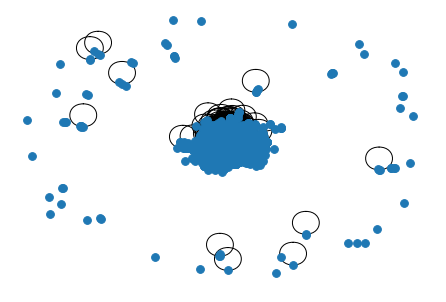

<Figure size 864x864 with 0 Axes>

In [ ]:
plot_graph(all_graph)

In [ ]:
description = graph_description(all_graph)

In [ ]:
import pickle
f = open("all_graph_group1_centralities.pkl", "wb")
pickle.dump(description, f)
f.close()

In [ ]:
import pickle
f = open("all_graph_group1.pkl", "wb")
pickle.dump(description, f)
f.close()

In [ ]:
description['number_of_nodes']

7116

In [ ]:
description['number_of_edges']

14357

In [ ]:
description['edges']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
01de4383-ea7e-45ce-8b25-165c3b857c67
5db5de4e-ed72-46ea-90d1-dfd2932b1660
01de4383-ea7e-45ce-8b25-165c3b857c67
ecb9d6e0-c82f-49d2-b7b7-2dff8205c769
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
9376a70d-5c83-4970-bfe2-69dbcbf7961a
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
f65496cf-662e-4f10-bbdc-c9aa022af470
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
da819c84-5a83-44da-bdb6-a0159a63b049
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
c22f02d4-d46d-4165-ae51-d35ffdd831fc
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
8a3249e4-e8ba-4047-a765-21c9127baa03
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
97b162be-d016-4e07-ad9c-808965806582
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
3f6b4daf-8433-4869-98ff-2b3db37e825a
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
a237007b-2a38-423a-850f-ca7615fbf3a6
c22f02d4-d46d-4165-ae51-d35ffdd831fc
a

[[[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58],
  [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749],
  {'weight': 1}],
 [[UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749],
  [UserID : 5db5de4e-ed72-46ea-90d1-dfd2932b1660, Username : یوما, Description : None, SignUpDate : 1392-09-13 00:00:00, PostCount : 3307],
  {'weight': 2}],
 [[UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749],
  [UserID : ecb9d6e0-c82f-49d2-b7b7-2dff8205c769, Username : afra23, Description : None, SignUpDate : 1397-05-01 00:00:00, PostCount : 4652],
  {'weight': 1}],
 [[UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : 

In [ ]:
description['weights_sum']

65216

In [ ]:
description['is_connected']

False

In [ ]:
description['number_connected_components']

49

In [ ]:
description['connected_components']

9f73a2cd-f529-4fd2-8eca-d6e6d24182cf
8fae43a9-06c9-4790-b300-96c2ac96d52a
ac46635a-16d4-4697-b7c3-888ae8c8457d
f138fce3-d41d-400e-9ef9-0a049608a69a
0307eda7-5a09-473a-98a8-730e9c9ab85b
c7857e7f-5a20-4645-8111-d0945f730774
709f8b79-c657-45dc-8134-825355ade8bd
30f13cc9-9f21-4236-a71a-80d49e5d80a8
ea3a05da-a9e6-41f4-aa49-ce8dc405c4dd
108e2200-a2aa-42db-827d-2b233a1a3012
7aff2c02-1a8e-435a-84bb-6d494f10e008
bcd9ef6a-762d-458d-bd11-2dd8f837bbb2
26dfae3c-8b6b-4c7b-a944-78d7d91bf4c7
82630b9f-4423-4456-8dfe-6259d6bb52bd
140c0e1d-a326-4c5f-8e15-34e4d59c7a17
0c8229d6-a919-4e9b-99b9-ee42bc7029a9
88599e46-d352-4f96-addd-7977d4b643ff
aac4a492-a2ca-42ad-93c8-7d4b8a005326
f4e123f6-5da6-4675-8841-8cd4c48f1ebd
2e45bb03-806b-4d60-9fe8-4c8273931715
114d750d-1bfc-47eb-a350-f5d81e29b904
da968ad5-5a80-4ade-a571-fc4058ec993e
b71716a6-f9c8-4708-803c-ba4a1aae4d80
b20120ff-f262-4a1d-8786-e50761298a76
09c5cb34-c38d-4813-a060-8154e9001507
289381e7-cb9e-4e3b-ab11-76bcf7b0bd16
4494e5c6-7494-4835-8085-8f7533a27629
5

[{[UserID : 9f73a2cd-f529-4fd2-8eca-d6e6d24182cf, Username : mamanesegol, Description : None, SignUpDate : 1398-04-09 00:00:00, PostCount : 286],
  [UserID : 8fae43a9-06c9-4790-b300-96c2ac96d52a, Username : Yasi143, Description : None, SignUpDate : 1392-10-01 00:00:00, PostCount : 767],
  [UserID : ac46635a-16d4-4697-b7c3-888ae8c8457d, Username : شیمپک, Description : None, SignUpDate : 1395-03-22 00:00:00, PostCount : 11368],
  [UserID : f138fce3-d41d-400e-9ef9-0a049608a69a, Username : asali02, Description : None, SignUpDate : 1396-10-21 00:00:00, PostCount : 479],
  [UserID : 0307eda7-5a09-473a-98a8-730e9c9ab85b, Username : Parisa20, Description : None, SignUpDate : 1395-07-17 00:00:00, PostCount : 873],
  [UserID : c7857e7f-5a20-4645-8111-d0945f730774, Username : mamanraha97, Description : None, SignUpDate : 1399-03-14 00:00:00, PostCount : 11119],
  [UserID : 709f8b79-c657-45dc-8134-825355ade8bd, Username : kkzz, Description : None, SignUpDate : 1398-12-08 00:00:00, PostCount : 208]

In [ ]:
description['global_efficiency']

0.25833849644354295

In [ ]:
description['local_efficiency']

0.20199281427980287

In [ ]:
description['graph_clustering']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
c22f02d4-d46d-4165-ae51-d35ffdd831fc
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
8a3249e4-e8ba-4047-a765-21c9127baa03
97b162be-d016-4e07-ad9c-808965806582
9376a70d-5c83-4970-bfe2-69dbcbf7961a
3f6b4daf-8433-4869-98ff-2b3db37e825a
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
fded3b1d-5778-45b8-b6cc-0fbcea4c4388
a237007b-2a38-423a-850f-ca7615fbf3a6
f65496cf-662e-4f10-bbdc-c9aa022af470
da819c84-5a83-44da-bdb6-a0159a63b049
b9da8186-d3fe-446d-adb1-e346bfb583c3
abfd3377-aa66-423d-8882-36fc17187008
68d01161-d4ab-4c73-a23c-409fe1f0ad43
d6be199f-478a-4a16-9c0d-613fb02ea2be
8daa9e9f-df01-4549-901d-6cf7709905ba
aae4d4a8-0ee2-4007-b19a-1e31f612f253
3db6020a-1d1e-4a4c-8a79-a5beba02101f
f2b7a838-8d0f-443d-87e7-83106fcca1ea
7e6f7715-7d82-4f4c-8b80-fd33b37c9023
7611a96b-1975-44c0-aae8-0c597d2f7c87
943bcf7c-5f24-4775-a5ec-eb766fb489a1
31ba2ea6-9aa7-4936-a059-67fd62951a1e
8cf125e6-5491-47e2-8910-8655a3d2a42a
3

{[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58]: 0,
 [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749]: 0,
 [UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : None, SignUpDate : 1397-04-18 00:00:00, PostCount : 524]: 0.06666666666666667,
 [UserID : c22f02d4-d46d-4165-ae51-d35ffdd831fc, Username : عسل_بانو69, Description : None, SignUpDate : 1393-11-28 00:00:00, PostCount : 14280]: 0,
 [UserID : ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea, Username : mahikm, Description : None, SignUpDate : 1396-10-02 00:00:00, PostCount : 5508]: 0.3333333333333333,
 [UserID : 8a3249e4-e8ba-4047-a765-21c9127baa03, Username : سپاس1, Description : None, SignUpDate : 1394-05-12 00:00:00, PostCount : 5942]: 0,
 [UserID : 97b162be-d016-4e07-ad9c-808965806582, Username : سیمین_مینو, Description : Non

In [ ]:
description['nodes_info']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
c22f02d4-d46d-4165-ae51-d35ffdd831fc
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
8a3249e4-e8ba-4047-a765-21c9127baa03
97b162be-d016-4e07-ad9c-808965806582
9376a70d-5c83-4970-bfe2-69dbcbf7961a
3f6b4daf-8433-4869-98ff-2b3db37e825a
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
fded3b1d-5778-45b8-b6cc-0fbcea4c4388
a237007b-2a38-423a-850f-ca7615fbf3a6
f65496cf-662e-4f10-bbdc-c9aa022af470
da819c84-5a83-44da-bdb6-a0159a63b049
b9da8186-d3fe-446d-adb1-e346bfb583c3
abfd3377-aa66-423d-8882-36fc17187008
68d01161-d4ab-4c73-a23c-409fe1f0ad43
d6be199f-478a-4a16-9c0d-613fb02ea2be
8daa9e9f-df01-4549-901d-6cf7709905ba
aae4d4a8-0ee2-4007-b19a-1e31f612f253
3db6020a-1d1e-4a4c-8a79-a5beba02101f
f2b7a838-8d0f-443d-87e7-83106fcca1ea
7e6f7715-7d82-4f4c-8b80-fd33b37c9023
7611a96b-1975-44c0-aae8-0c597d2f7c87
943bcf7c-5f24-4775-a5ec-eb766fb489a1
31ba2ea6-9aa7-4936-a059-67fd62951a1e
8cf125e6-5491-47e2-8910-8655a3d2a42a
3

{[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58]: {'degree': 1},
 [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749]: {'degree': 3},
 [UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : None, SignUpDate : 1397-04-18 00:00:00, PostCount : 524]: {'degree': 10},
 [UserID : c22f02d4-d46d-4165-ae51-d35ffdd831fc, Username : عسل_بانو69, Description : None, SignUpDate : 1393-11-28 00:00:00, PostCount : 14280]: {'degree': 2},
 [UserID : ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea, Username : mahikm, Description : None, SignUpDate : 1396-10-02 00:00:00, PostCount : 5508]: {'degree': 3},
 [UserID : 8a3249e4-e8ba-4047-a765-21c9127baa03, Username : سپاس1, Description : None, SignUpDate : 1394-05-12 00:00:00, PostCount : 5942]: {'degree': 1},
 [UserID : 97b162be-d016-4e07-ad9c-808965806582, Us

In [ ]:
description['degree_distribution_of_vertices']

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [ ]:
description['communities_size']

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 6,
 7035]

In [ ]:
description['degree_centrality']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
c22f02d4-d46d-4165-ae51-d35ffdd831fc
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
8a3249e4-e8ba-4047-a765-21c9127baa03
97b162be-d016-4e07-ad9c-808965806582
9376a70d-5c83-4970-bfe2-69dbcbf7961a
3f6b4daf-8433-4869-98ff-2b3db37e825a
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
fded3b1d-5778-45b8-b6cc-0fbcea4c4388
a237007b-2a38-423a-850f-ca7615fbf3a6
f65496cf-662e-4f10-bbdc-c9aa022af470
da819c84-5a83-44da-bdb6-a0159a63b049
b9da8186-d3fe-446d-adb1-e346bfb583c3
abfd3377-aa66-423d-8882-36fc17187008
68d01161-d4ab-4c73-a23c-409fe1f0ad43
d6be199f-478a-4a16-9c0d-613fb02ea2be
8daa9e9f-df01-4549-901d-6cf7709905ba
aae4d4a8-0ee2-4007-b19a-1e31f612f253
3db6020a-1d1e-4a4c-8a79-a5beba02101f
f2b7a838-8d0f-443d-87e7-83106fcca1ea
7e6f7715-7d82-4f4c-8b80-fd33b37c9023
7611a96b-1975-44c0-aae8-0c597d2f7c87
943bcf7c-5f24-4775-a5ec-eb766fb489a1
31ba2ea6-9aa7-4936-a059-67fd62951a1e
8cf125e6-5491-47e2-8910-8655a3d2a42a
3

{[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58]: 0.000140548137737175,
 [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749]: 0.000421644413211525,
 [UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : None, SignUpDate : 1397-04-18 00:00:00, PostCount : 524]: 0.0014054813773717498,
 [UserID : c22f02d4-d46d-4165-ae51-d35ffdd831fc, Username : عسل_بانو69, Description : None, SignUpDate : 1393-11-28 00:00:00, PostCount : 14280]: 0.00028109627547435,
 [UserID : ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea, Username : mahikm, Description : None, SignUpDate : 1396-10-02 00:00:00, PostCount : 5508]: 0.000421644413211525,
 [UserID : 8a3249e4-e8ba-4047-a765-21c9127baa03, Username : سپاس1, Description : None, SignUpDate : 1394-05-12 00:00:00, PostCount : 5942]: 0.000140548137737175,
 [UserID :

In [ ]:
description['betweenness_centrality']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
c22f02d4-d46d-4165-ae51-d35ffdd831fc
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
8a3249e4-e8ba-4047-a765-21c9127baa03
97b162be-d016-4e07-ad9c-808965806582
9376a70d-5c83-4970-bfe2-69dbcbf7961a
3f6b4daf-8433-4869-98ff-2b3db37e825a
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
fded3b1d-5778-45b8-b6cc-0fbcea4c4388
a237007b-2a38-423a-850f-ca7615fbf3a6
f65496cf-662e-4f10-bbdc-c9aa022af470
da819c84-5a83-44da-bdb6-a0159a63b049
b9da8186-d3fe-446d-adb1-e346bfb583c3
abfd3377-aa66-423d-8882-36fc17187008
68d01161-d4ab-4c73-a23c-409fe1f0ad43
d6be199f-478a-4a16-9c0d-613fb02ea2be
8daa9e9f-df01-4549-901d-6cf7709905ba
aae4d4a8-0ee2-4007-b19a-1e31f612f253
3db6020a-1d1e-4a4c-8a79-a5beba02101f
f2b7a838-8d0f-443d-87e7-83106fcca1ea
7e6f7715-7d82-4f4c-8b80-fd33b37c9023
7611a96b-1975-44c0-aae8-0c597d2f7c87
943bcf7c-5f24-4775-a5ec-eb766fb489a1
31ba2ea6-9aa7-4936-a059-67fd62951a1e
8cf125e6-5491-47e2-8910-8655a3d2a42a
3

{[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58]: 0.0,
 [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749]: 0.0005557519137681659,
 [UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : None, SignUpDate : 1397-04-18 00:00:00, PostCount : 524]: 0.0016897782148805982,
 [UserID : c22f02d4-d46d-4165-ae51-d35ffdd831fc, Username : عسل_بانو69, Description : None, SignUpDate : 1393-11-28 00:00:00, PostCount : 14280]: 0.0,
 [UserID : ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea, Username : mahikm, Description : None, SignUpDate : 1396-10-02 00:00:00, PostCount : 5508]: 0.0,
 [UserID : 8a3249e4-e8ba-4047-a765-21c9127baa03, Username : سپاس1, Description : None, SignUpDate : 1394-05-12 00:00:00, PostCount : 5942]: 0.0,
 [UserID : 97b162be-d016-4e07-ad9c-808965806582, Username : سیمین_مینو, Desc

In [ ]:
description['closeness_centrality']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
c22f02d4-d46d-4165-ae51-d35ffdd831fc
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
8a3249e4-e8ba-4047-a765-21c9127baa03
97b162be-d016-4e07-ad9c-808965806582
9376a70d-5c83-4970-bfe2-69dbcbf7961a
3f6b4daf-8433-4869-98ff-2b3db37e825a
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
fded3b1d-5778-45b8-b6cc-0fbcea4c4388
a237007b-2a38-423a-850f-ca7615fbf3a6
f65496cf-662e-4f10-bbdc-c9aa022af470
da819c84-5a83-44da-bdb6-a0159a63b049
b9da8186-d3fe-446d-adb1-e346bfb583c3
abfd3377-aa66-423d-8882-36fc17187008
68d01161-d4ab-4c73-a23c-409fe1f0ad43
d6be199f-478a-4a16-9c0d-613fb02ea2be
8daa9e9f-df01-4549-901d-6cf7709905ba
aae4d4a8-0ee2-4007-b19a-1e31f612f253
3db6020a-1d1e-4a4c-8a79-a5beba02101f
f2b7a838-8d0f-443d-87e7-83106fcca1ea
7e6f7715-7d82-4f4c-8b80-fd33b37c9023
7611a96b-1975-44c0-aae8-0c597d2f7c87
943bcf7c-5f24-4775-a5ec-eb766fb489a1
31ba2ea6-9aa7-4936-a059-67fd62951a1e
8cf125e6-5491-47e2-8910-8655a3d2a42a
3

{[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58]: 0.3134087525386343,
 [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749]: 0.4588524808756268,
 [UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : None, SignUpDate : 1397-04-18 00:00:00, PostCount : 524]: 0.7483094671708853,
 [UserID : c22f02d4-d46d-4165-ae51-d35ffdd831fc, Username : عسل_بانو69, Description : None, SignUpDate : 1393-11-28 00:00:00, PostCount : 14280]: 0.8051251424429858,
 [UserID : ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea, Username : mahikm, Description : None, SignUpDate : 1396-10-02 00:00:00, PostCount : 5508]: 0.5361042679450828,
 [UserID : 8a3249e4-e8ba-4047-a765-21c9127baa03, Username : سپاس1, Description : None, SignUpDate : 1394-05-12 00:00:00, PostCount : 5942]: 0.42594567906257247,
 [UserID : 97b162be-d

In [ ]:
description['diameter']

inf

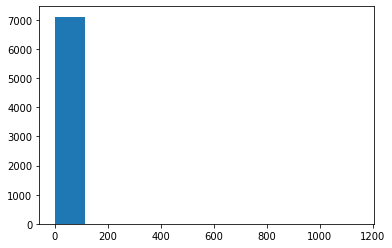

In [ ]:
plot_degree_histogram(description)

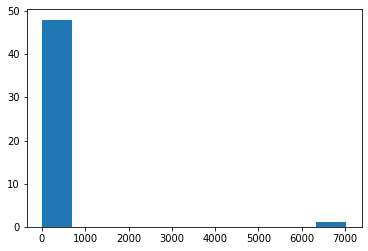

In [ ]:
plot_communities_size_histogram(description)

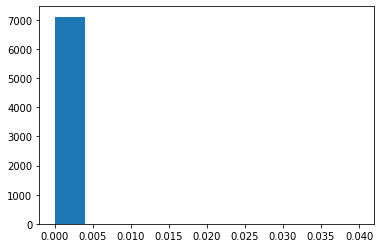

In [ ]:
plot_degree_distribution(description)

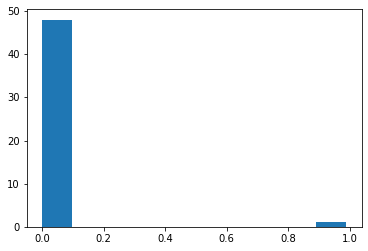

In [ ]:
plot_communities_distribution(description)

In [ ]:
description["average_clustering"]

0.15531949465785766

In [ ]:
description["transitivity"]

0.02410929052003222

In [ ]:
description["small_worldness_sigma"]

In [ ]:
description["small_worldness_omega"]

In [ ]:
print(nx.constraint(all_graph))

Streaming output truncated to the last 5000 lines.
0338c0c3-9eba-452c-8a5e-9b4731495545
c62d87c8-ba73-4fbc-bd30-fce66cf1a144
216a5f38-0570-40d5-8d58-e6d1b42d142f
6921317e-3ae4-4c16-bb78-15b8cb296034
05d66f14-c669-4d3f-ac99-e76e8c4964de
b2a29d27-8149-47b8-b634-bf0ec8782e68
e0c01cfb-1d6d-4419-9da5-4ea4d08c4f4e
61ee4286-fd91-400b-b700-ae7c82195eae
06e2e324-412f-4024-b6de-758ea8882444
d9b1de05-77e8-499c-88f8-552ec83948f9
633ab37a-4d07-4e9d-96bc-1408497e6daf
af105655-e78a-4e82-b6c5-23bfb51954d0
b994b4e6-7a33-4420-9506-3d711e003414
52f28c7d-bd4d-43ce-a5a5-f8487218bea0
2d14f9f6-0425-491e-9ae0-7742c731306b
2b4be9e7-6628-4e29-9e3b-b0365b51a73f
64896d5d-9dd9-4cf8-9174-a142cd029998
f8f0b0e9-d1a9-40d6-a0eb-98fc7fa809ba
e53f6b85-749d-4bf8-ad65-4c1c600adfcb
9891f15e-79a4-46c2-a69a-dd824bff2a4e
344e1aa5-2f74-4574-9768-43284302db38
51ccef15-0834-44c8-821d-9f41b328227c
420315fd-f240-4e85-be2a-1f49124afcd6
6dc5c9d7-ad17-4067-a371-d2f75ed07ff1
c1ca1ccc-9444-4645-af0d-2539cf331cd7
319aa337-b9b1-44d5-a0a1-

In [ ]:
print(nx.effective_size(all_graph))

ZeroDivisionError: ignored

####Year to year graph for group 1

In [ ]:
year_to_year_graph = graphAnalysis.get_year_to_year_graph()

Year:  1389
10
8
Year:  1390
47
46
Year:  1391
120
133
Year:  1392
304
332
Year:  1393
485
537
Year:  1394
657
743
Year:  1395
823
954
Year:  1396
1213
1639
Year:  1397
2628
4925
Year:  1398
3725
7775
Year:  1399
5091
10529
Year:  1400
6925
14009
Year:  1401
7088
14357


Plot of each year graph

Year:  1389


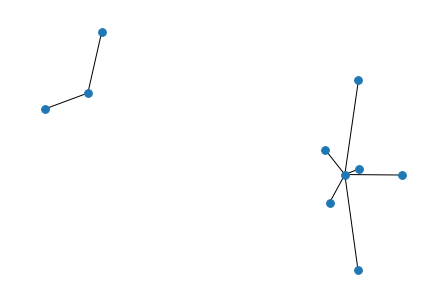

<Figure size 864x864 with 0 Axes>

Year:  1390


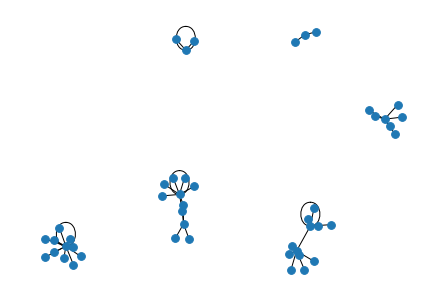

<Figure size 864x864 with 0 Axes>

Year:  1391


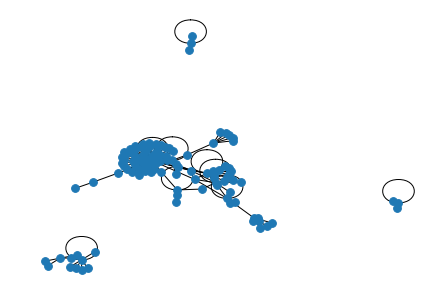

<Figure size 864x864 with 0 Axes>

Year:  1392


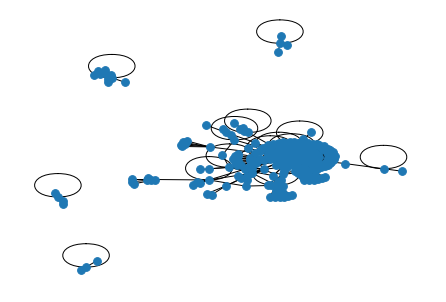

<Figure size 864x864 with 0 Axes>

Year:  1393


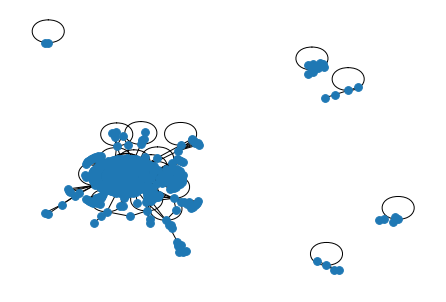

<Figure size 864x864 with 0 Axes>

Year:  1394


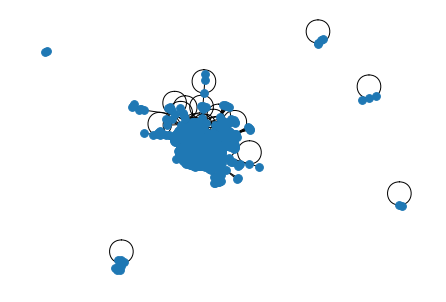

<Figure size 864x864 with 0 Axes>

Year:  1395


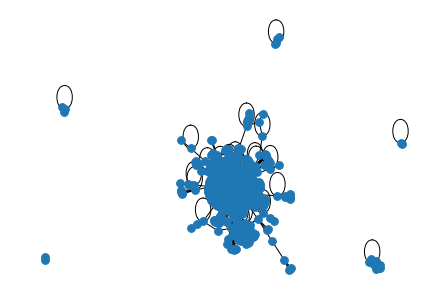

<Figure size 864x864 with 0 Axes>

Year:  1396


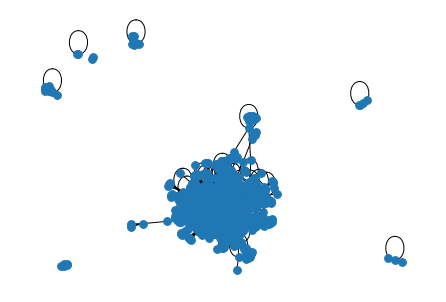

<Figure size 864x864 with 0 Axes>

Year:  1397


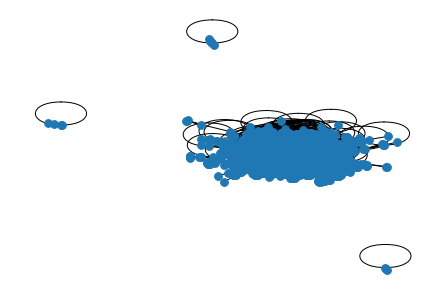

<Figure size 864x864 with 0 Axes>

Year:  1398


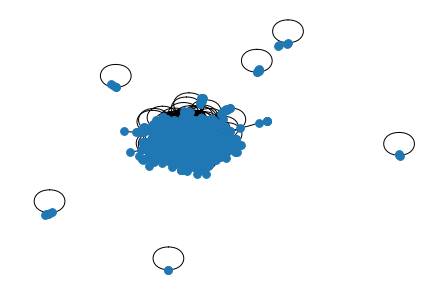

<Figure size 864x864 with 0 Axes>

Year:  1399


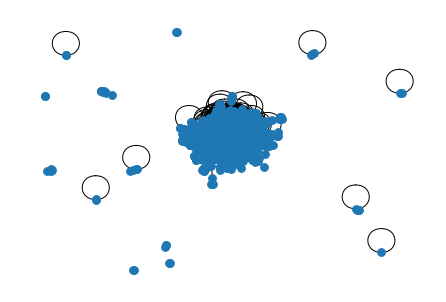

<Figure size 864x864 with 0 Axes>

Year:  1400


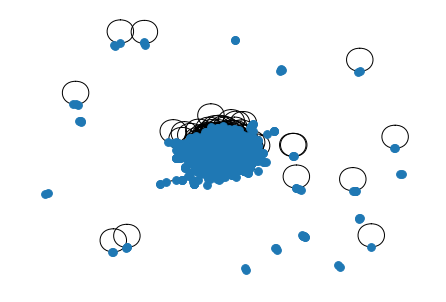

<Figure size 864x864 with 0 Axes>

Year:  1401


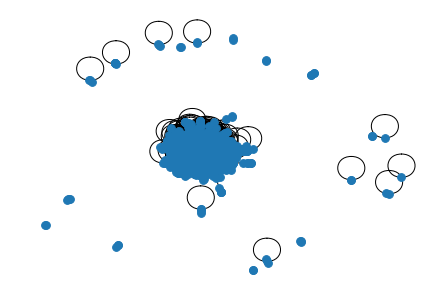

<Figure size 864x864 with 0 Axes>

In [ ]:
for year in year_to_year_graph.keys():
  print("Year: ", year)
  plot_graph(year_to_year_graph[year])

Year to year graph descriptions

In [ ]:
year_to_year_description = {}
for year in year_to_year_graph.keys():
  print("Year:", year)
  year_to_year_description[year] = graph_description(year_to_year_graph[year])

Year: 1389
Year: 1390
Year: 1391
Year: 1392
Year: 1393
Year: 1394
Year: 1395
Year: 1396
Year: 1397
Year: 1398
Year: 1399
Year: 1400
Year: 1401


Print description of each year graph sperately 

In [ ]:
for year in year_to_year_description.keys():
  print('-'*60)
  print("Description of year", year, ':')
  description = year_to_year_description[year]
  for feature in features_names:
    print(feature, ': ', description[feature])

Year: 1389


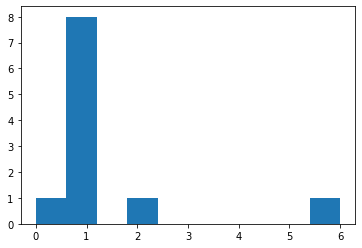

Year: 1390


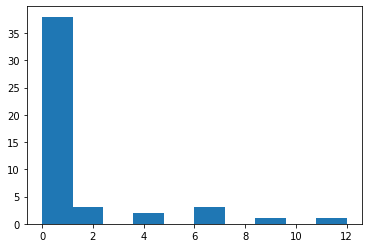

Year: 1391


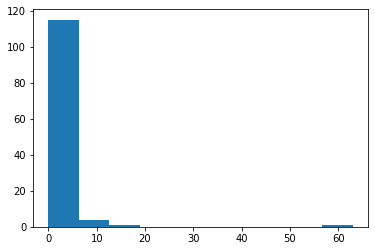

Year: 1392


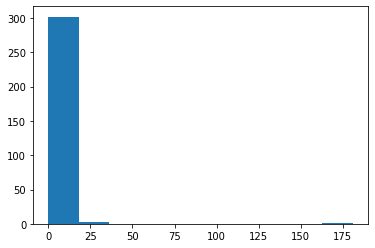

Year: 1393


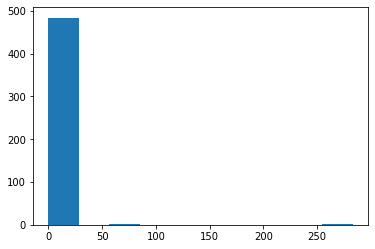

Year: 1394


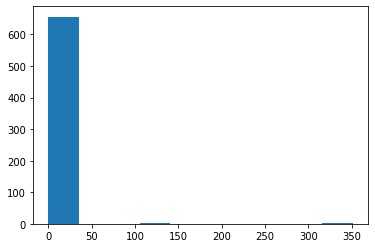

Year: 1395


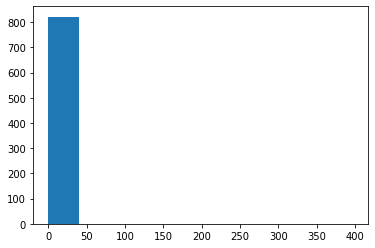

Year: 1396


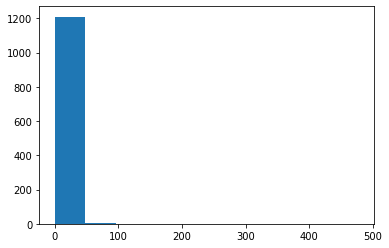

Year: 1397


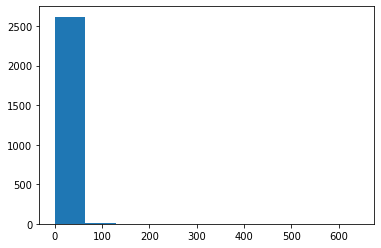

Year: 1398


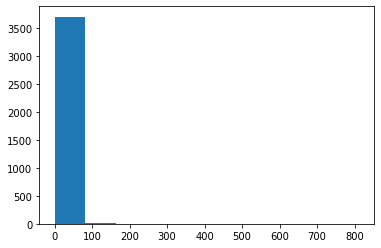

Year: 1399


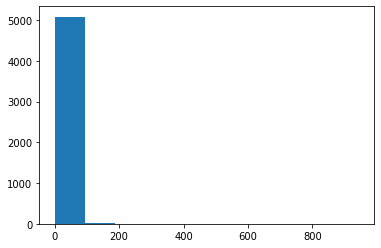

Year: 1400


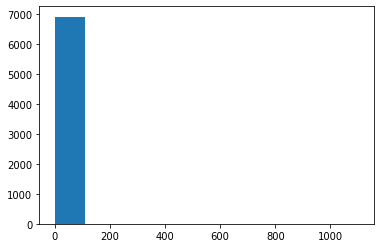

Year: 1401


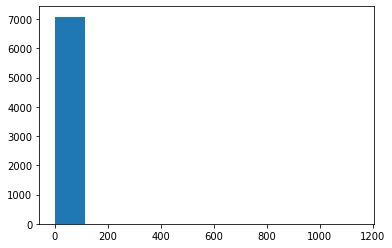

In [ ]:
for year in year_to_year_description.keys():
  print("Year:", year)
  plot_distribution(year_to_year_description[year]['degree_distribution_of_vertices'])

Number of nodes in each year

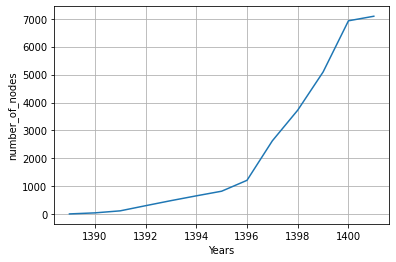

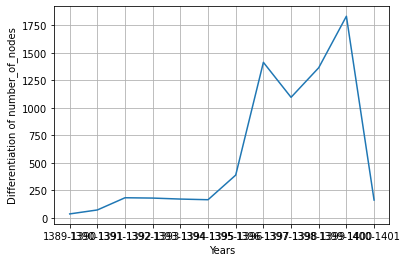

In [ ]:
plot_features_year_to_year(year_to_year_description, "number_of_nodes")

Curve fitted for number of nodes

[ 7.80034965e+01 -2.17015211e+05  1.50940614e+08]


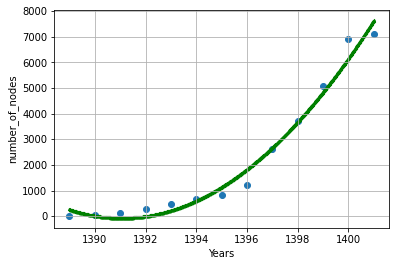

In [ ]:
plot_features_year_to_year_scatter(year_to_year_description, 'number_of_nodes')

Number of edges in each year

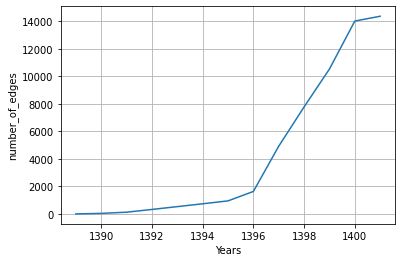

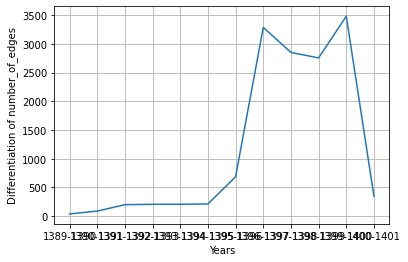

In [ ]:
plot_features_year_to_year(year_to_year_description, "number_of_edges")

Curve fitted for number of edges

[ 1.76064935e+02 -4.89960213e+05  3.40869573e+08]


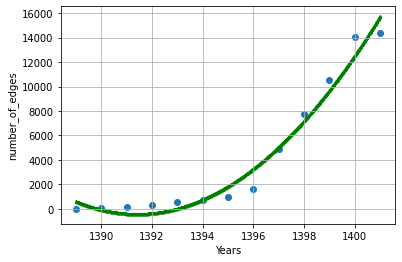

In [ ]:
plot_features_year_to_year_scatter(year_to_year_description, 'number_of_edges')

Weights sum in each year

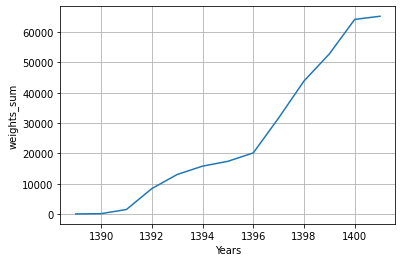

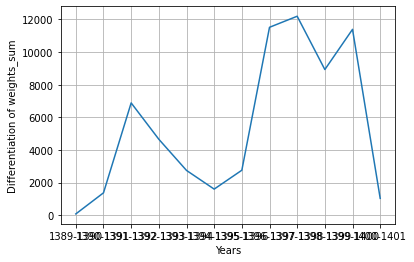

In [ ]:
plot_features_year_to_year(year_to_year_description, "weights_sum")

Curve fitting in weights sum

[ 4.15965534e+02 -1.15469422e+06  8.01338982e+08]


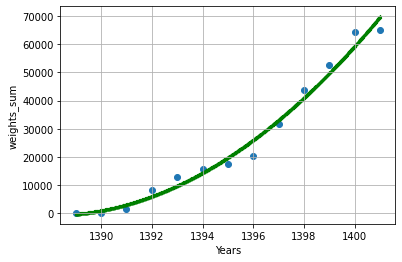

In [ ]:
plot_features_year_to_year_scatter(year_to_year_description, 'weights_sum')

Number of connected components in each year

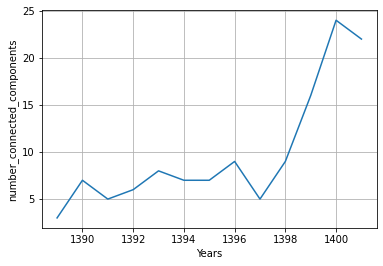

In [ ]:
plot_features_year_to_year(year_to_year_description, "number_connected_components")

In [ ]:
plot_features_year_to_year_scatter(year_to_year_description, "number_connected_components")

Global efficiency in each year

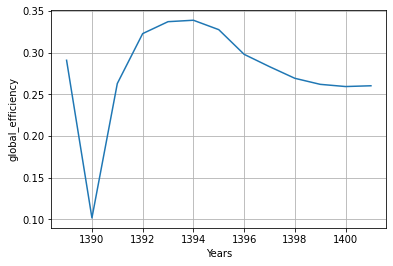

In [ ]:
plot_features_year_to_year(year_to_year_description, "global_efficiency")

Local efficiency in each year

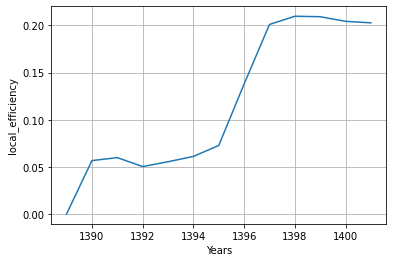

In [ ]:
plot_features_year_to_year(year_to_year_description, "local_efficiency")

Tree hierarchy in each year

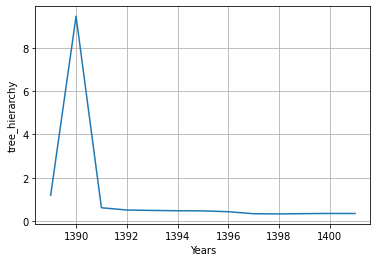

In [ ]:
plot_features_year_to_year(year_to_year_description, "tree_hierarchy")

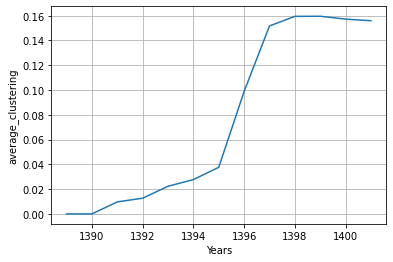

In [ ]:
plot_features_year_to_year(year_to_year_description, "average_clustering")

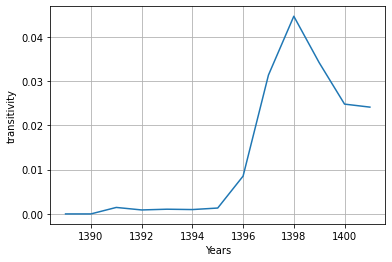

In [ ]:
plot_features_year_to_year(year_to_year_description, "transitivity")

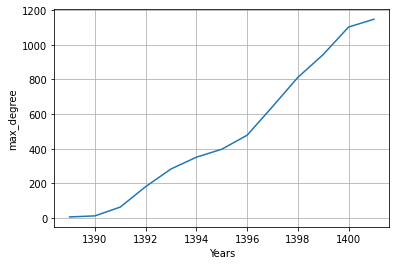

In [ ]:
plot_features_year_to_year(year_to_year_description, "max_degree")

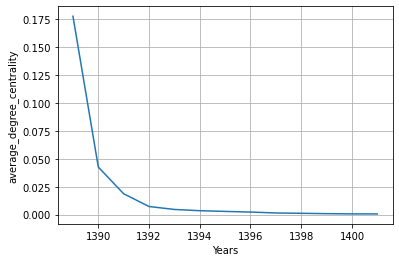

In [ ]:
plot_features_year_to_year(year_to_year_description, "average_degree_centrality")

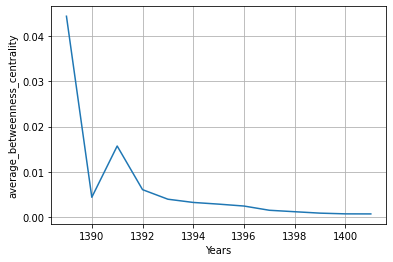

In [ ]:
plot_features_year_to_year(year_to_year_description, "average_betweenness_centrality")

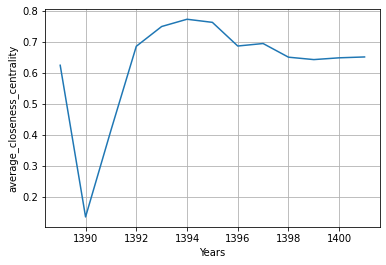

In [ ]:
plot_features_year_to_year(year_to_year_description, "average_closeness_centrality")

In [ ]:
for year in year_to_year_description.keys():
  print("Year: ", year)
  print("Constraints: ", nx.constraint(year_to_year_description[year]))

In [ ]:
for year in year_to_year_description.keys():
  print("Year: ", year)
  print("Effective Size: ", nx.effective_size(year_to_year_description[year]))

####Biggest Connected Component in group 1 description:

In [ ]:
BCC_group1 = get_biggest_connected_component(all_graph)

In [ ]:
len(BCC_group1)

In [ ]:
BCC_group1_description = graph_description(BCC_group1)

In [ ]:
f = open("BCC_group1_centralities.pkl", "wb")
pickle.dump(BCC_group1_description, f)
f.close()

In [ ]:
f = open("BCC_group1.pkl", "wb")
pickle.dump(BCC_group1_description, f)
f.close()

In [ ]:
BCC_group1_description['number_of_nodes']

7035

In [ ]:
BCC_group1_description['number_of_edges']

14314

In [ ]:
BCC_group1_description['edges']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
01de4383-ea7e-45ce-8b25-165c3b857c67
5db5de4e-ed72-46ea-90d1-dfd2932b1660
01de4383-ea7e-45ce-8b25-165c3b857c67
ecb9d6e0-c82f-49d2-b7b7-2dff8205c769
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
9376a70d-5c83-4970-bfe2-69dbcbf7961a
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
f65496cf-662e-4f10-bbdc-c9aa022af470
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
da819c84-5a83-44da-bdb6-a0159a63b049
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
c22f02d4-d46d-4165-ae51-d35ffdd831fc
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
8a3249e4-e8ba-4047-a765-21c9127baa03
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
97b162be-d016-4e07-ad9c-808965806582
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
3f6b4daf-8433-4869-98ff-2b3db37e825a
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
a237007b-2a38-423a-850f-ca7615fbf3a6
c22f02d4-d46d-4165-ae51-d35ffdd831fc
a

[[[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58],
  [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749],
  {'weight': 1}],
 [[UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749],
  [UserID : 5db5de4e-ed72-46ea-90d1-dfd2932b1660, Username : یوما, Description : None, SignUpDate : 1392-09-13 00:00:00, PostCount : 3307],
  {'weight': 2}],
 [[UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749],
  [UserID : ecb9d6e0-c82f-49d2-b7b7-2dff8205c769, Username : afra23, Description : None, SignUpDate : 1397-05-01 00:00:00, PostCount : 4652],
  {'weight': 1}],
 [[UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : 

In [ ]:
BCC_group1_description['weights_sum']

65117

In [ ]:
BCC_group1_description['is_connected']

True

In [ ]:
BCC_group1_description['number_connected_components']

1

In [ ]:
BCC_group1_description['global_efficiency']

0.2643202992718627

In [ ]:
BCC_group1_description['local_efficiency']

0.20333535177660422

In [ ]:
BCC_group1_description['graph_clustering']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
f65496cf-662e-4f10-bbdc-c9aa022af470
c22f02d4-d46d-4165-ae51-d35ffdd831fc
fded3b1d-5778-45b8-b6cc-0fbcea4c4388
97b162be-d016-4e07-ad9c-808965806582
da819c84-5a83-44da-bdb6-a0159a63b049
9376a70d-5c83-4970-bfe2-69dbcbf7961a
8a3249e4-e8ba-4047-a765-21c9127baa03
a237007b-2a38-423a-850f-ca7615fbf3a6
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
3f6b4daf-8433-4869-98ff-2b3db37e825a
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
b9da8186-d3fe-446d-adb1-e346bfb583c3
68d01161-d4ab-4c73-a23c-409fe1f0ad43
abfd3377-aa66-423d-8882-36fc17187008
d6be199f-478a-4a16-9c0d-613fb02ea2be
7e6f7715-7d82-4f4c-8b80-fd33b37c9023
aef7d3ec-0524-4259-a933-44c79e276fbd
105e54d5-4923-44c5-bb3c-ef6d412a8eb6
8daa9e9f-df01-4549-901d-6cf7709905ba
3db6020a-1d1e-4a4c-8a79-a5beba02101f
8cf125e6-5491-47e2-8910-8655a3d2a42a
7611a96b-1975-44c0-aae8-0c597d2f7c87
378ff3a9-c3ea-4cd8-b26f-f3ee1e250b92
f2b7a838-8d0f-443d-87e7-83106fcca1ea
3

{[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58]: 0,
 [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749]: 0,
 [UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : None, SignUpDate : 1397-04-18 00:00:00, PostCount : 524]: 0.06666666666666667,
 [UserID : f65496cf-662e-4f10-bbdc-c9aa022af470, Username : آوا،۰۰, Description : None, SignUpDate : 1398-11-26 00:00:00, PostCount : 2055]: 0,
 [UserID : c22f02d4-d46d-4165-ae51-d35ffdd831fc, Username : عسل_بانو69, Description : None, SignUpDate : 1393-11-28 00:00:00, PostCount : 14280]: 0,
 [UserID : fded3b1d-5778-45b8-b6cc-0fbcea4c4388, Username : اهمممممم, Description : None, SignUpDate : 1399-10-19 00:00:00, PostCount : 5476]: 0,
 [UserID : 97b162be-d016-4e07-ad9c-808965806582, Username : سیمین_مینو, Description : None, SignUpDate 

In [ ]:
BCC_group1_description['nodes_info']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
f65496cf-662e-4f10-bbdc-c9aa022af470
c22f02d4-d46d-4165-ae51-d35ffdd831fc
fded3b1d-5778-45b8-b6cc-0fbcea4c4388
97b162be-d016-4e07-ad9c-808965806582
da819c84-5a83-44da-bdb6-a0159a63b049
9376a70d-5c83-4970-bfe2-69dbcbf7961a
8a3249e4-e8ba-4047-a765-21c9127baa03
a237007b-2a38-423a-850f-ca7615fbf3a6
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
3f6b4daf-8433-4869-98ff-2b3db37e825a
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
b9da8186-d3fe-446d-adb1-e346bfb583c3
68d01161-d4ab-4c73-a23c-409fe1f0ad43
abfd3377-aa66-423d-8882-36fc17187008
d6be199f-478a-4a16-9c0d-613fb02ea2be
7e6f7715-7d82-4f4c-8b80-fd33b37c9023
aef7d3ec-0524-4259-a933-44c79e276fbd
105e54d5-4923-44c5-bb3c-ef6d412a8eb6
8daa9e9f-df01-4549-901d-6cf7709905ba
3db6020a-1d1e-4a4c-8a79-a5beba02101f
8cf125e6-5491-47e2-8910-8655a3d2a42a
7611a96b-1975-44c0-aae8-0c597d2f7c87
378ff3a9-c3ea-4cd8-b26f-f3ee1e250b92
f2b7a838-8d0f-443d-87e7-83106fcca1ea
3

{[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58]: {'degree': 1},
 [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749]: {'degree': 3},
 [UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : None, SignUpDate : 1397-04-18 00:00:00, PostCount : 524]: {'degree': 10},
 [UserID : f65496cf-662e-4f10-bbdc-c9aa022af470, Username : آوا،۰۰, Description : None, SignUpDate : 1398-11-26 00:00:00, PostCount : 2055]: {'degree': 1},
 [UserID : c22f02d4-d46d-4165-ae51-d35ffdd831fc, Username : عسل_بانو69, Description : None, SignUpDate : 1393-11-28 00:00:00, PostCount : 14280]: {'degree': 2},
 [UserID : fded3b1d-5778-45b8-b6cc-0fbcea4c4388, Username : اهمممممم, Description : None, SignUpDate : 1399-10-19 00:00:00, PostCount : 5476]: {'degree': 2},
 [UserID : 97b162be-d016-4e07-ad9c-808965806582,

In [ ]:
BCC_group1_description['degree_distribution_of_vertices']

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [ ]:
BCC_group1_description['communities_size']

[7035]

In [ ]:
BCC_group1_description['degree_centrality']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
f65496cf-662e-4f10-bbdc-c9aa022af470
c22f02d4-d46d-4165-ae51-d35ffdd831fc
fded3b1d-5778-45b8-b6cc-0fbcea4c4388
97b162be-d016-4e07-ad9c-808965806582
da819c84-5a83-44da-bdb6-a0159a63b049
9376a70d-5c83-4970-bfe2-69dbcbf7961a
8a3249e4-e8ba-4047-a765-21c9127baa03
a237007b-2a38-423a-850f-ca7615fbf3a6
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
3f6b4daf-8433-4869-98ff-2b3db37e825a
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
b9da8186-d3fe-446d-adb1-e346bfb583c3
68d01161-d4ab-4c73-a23c-409fe1f0ad43
abfd3377-aa66-423d-8882-36fc17187008
d6be199f-478a-4a16-9c0d-613fb02ea2be
7e6f7715-7d82-4f4c-8b80-fd33b37c9023
aef7d3ec-0524-4259-a933-44c79e276fbd
105e54d5-4923-44c5-bb3c-ef6d412a8eb6
8daa9e9f-df01-4549-901d-6cf7709905ba
3db6020a-1d1e-4a4c-8a79-a5beba02101f
8cf125e6-5491-47e2-8910-8655a3d2a42a
7611a96b-1975-44c0-aae8-0c597d2f7c87
378ff3a9-c3ea-4cd8-b26f-f3ee1e250b92
f2b7a838-8d0f-443d-87e7-83106fcca1ea
3

{[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58]: 0.00014216661927779356,
 [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749]: 0.0004264998578333807,
 [UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : None, SignUpDate : 1397-04-18 00:00:00, PostCount : 524]: 0.0014216661927779356,
 [UserID : f65496cf-662e-4f10-bbdc-c9aa022af470, Username : آوا،۰۰, Description : None, SignUpDate : 1398-11-26 00:00:00, PostCount : 2055]: 0.00014216661927779356,
 [UserID : c22f02d4-d46d-4165-ae51-d35ffdd831fc, Username : عسل_بانو69, Description : None, SignUpDate : 1393-11-28 00:00:00, PostCount : 14280]: 0.0002843332385555871,
 [UserID : fded3b1d-5778-45b8-b6cc-0fbcea4c4388, Username : اهمممممم, Description : None, SignUpDate : 1399-10-19 00:00:00, PostCount : 5476]: 0.0002843332385555871,

In [ ]:
BCC_group1_description['betweenness_centrality']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
f65496cf-662e-4f10-bbdc-c9aa022af470
c22f02d4-d46d-4165-ae51-d35ffdd831fc
fded3b1d-5778-45b8-b6cc-0fbcea4c4388
97b162be-d016-4e07-ad9c-808965806582
da819c84-5a83-44da-bdb6-a0159a63b049
9376a70d-5c83-4970-bfe2-69dbcbf7961a
8a3249e4-e8ba-4047-a765-21c9127baa03
a237007b-2a38-423a-850f-ca7615fbf3a6
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
3f6b4daf-8433-4869-98ff-2b3db37e825a
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
b9da8186-d3fe-446d-adb1-e346bfb583c3
68d01161-d4ab-4c73-a23c-409fe1f0ad43
abfd3377-aa66-423d-8882-36fc17187008
d6be199f-478a-4a16-9c0d-613fb02ea2be
7e6f7715-7d82-4f4c-8b80-fd33b37c9023
aef7d3ec-0524-4259-a933-44c79e276fbd
105e54d5-4923-44c5-bb3c-ef6d412a8eb6
8daa9e9f-df01-4549-901d-6cf7709905ba
3db6020a-1d1e-4a4c-8a79-a5beba02101f
8cf125e6-5491-47e2-8910-8655a3d2a42a
7611a96b-1975-44c0-aae8-0c597d2f7c87
378ff3a9-c3ea-4cd8-b26f-f3ee1e250b92
f2b7a838-8d0f-443d-87e7-83106fcca1ea
3

{[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58]: 0.0,
 [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749]: 0.0005686260486683255,
 [UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : None, SignUpDate : 1397-04-18 00:00:00, PostCount : 524]: 0.0017289223584287905,
 [UserID : f65496cf-662e-4f10-bbdc-c9aa022af470, Username : آوا،۰۰, Description : None, SignUpDate : 1398-11-26 00:00:00, PostCount : 2055]: 0.0,
 [UserID : c22f02d4-d46d-4165-ae51-d35ffdd831fc, Username : عسل_بانو69, Description : None, SignUpDate : 1393-11-28 00:00:00, PostCount : 14280]: 0.0,
 [UserID : fded3b1d-5778-45b8-b6cc-0fbcea4c4388, Username : اهمممممم, Description : None, SignUpDate : 1399-10-19 00:00:00, PostCount : 5476]: 2.1831359138350215e-05,
 [UserID : 97b162be-d016-4e07-ad9c-808965806582, Usern

In [ ]:
BCC_group1_description['closeness_centrality']

8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc
01de4383-ea7e-45ce-8b25-165c3b857c67
4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52
f65496cf-662e-4f10-bbdc-c9aa022af470
c22f02d4-d46d-4165-ae51-d35ffdd831fc
fded3b1d-5778-45b8-b6cc-0fbcea4c4388
97b162be-d016-4e07-ad9c-808965806582
da819c84-5a83-44da-bdb6-a0159a63b049
9376a70d-5c83-4970-bfe2-69dbcbf7961a
8a3249e4-e8ba-4047-a765-21c9127baa03
a237007b-2a38-423a-850f-ca7615fbf3a6
ef64bfa0-64cd-40bb-a1e3-f59da1a8fbea
3f6b4daf-8433-4869-98ff-2b3db37e825a
f87f2a0a-5dc7-4ced-abdc-9c30e96f7c3f
b9da8186-d3fe-446d-adb1-e346bfb583c3
68d01161-d4ab-4c73-a23c-409fe1f0ad43
abfd3377-aa66-423d-8882-36fc17187008
d6be199f-478a-4a16-9c0d-613fb02ea2be
7e6f7715-7d82-4f4c-8b80-fd33b37c9023
aef7d3ec-0524-4259-a933-44c79e276fbd
105e54d5-4923-44c5-bb3c-ef6d412a8eb6
8daa9e9f-df01-4549-901d-6cf7709905ba
3db6020a-1d1e-4a4c-8a79-a5beba02101f
8cf125e6-5491-47e2-8910-8655a3d2a42a
7611a96b-1975-44c0-aae8-0c597d2f7c87
378ff3a9-c3ea-4cd8-b26f-f3ee1e250b92
f2b7a838-8d0f-443d-87e7-83106fcca1ea
3

{[UserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, Username : rbee, Description : None, SignUpDate : 1398-04-03 00:00:00, PostCount : 58]: 0.3170178098254739,
 [UserID : 01de4383-ea7e-45ce-8b25-165c3b857c67, Username : azitanini, Description : None, SignUpDate : 1397-12-22 00:00:00, PostCount : 749]: 0.4641363948578454,
 [UserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, Username : nargeskhatoon1369, Description : None, SignUpDate : 1397-04-18 00:00:00, PostCount : 524]: 0.7569266219677068,
 [UserID : f65496cf-662e-4f10-bbdc-c9aa022af470, Username : آوا،۰۰, Description : None, SignUpDate : 1398-11-26 00:00:00, PostCount : 2055]: 0.4308506548948256,
 [UserID : c22f02d4-d46d-4165-ae51-d35ffdd831fc, Username : عسل_بانو69, Description : None, SignUpDate : 1393-11-28 00:00:00, PostCount : 14280]: 0.8143965579303162,
 [UserID : fded3b1d-5778-45b8-b6cc-0fbcea4c4388, Username : اهمممممم, Description : None, SignUpDate : 1399-10-19 00:00:00, PostCount : 5476]: 0.7203870753216114,
 [UserID : 97b162be

In [ ]:
BCC_group1_description['average_shortest_path_length']

4.095366580720024

In [ ]:
BCC_group1_description['tree_hierarchy']

0.353758485371618

In [ ]:
BCC_group1_description['diameter']

11

In [ ]:
BCC_group1_description['average_clustering']

0.15710782146202062

In [ ]:
BCC_group1_description['transitivity']

0.024109647125238894

In [ ]:
BCC_group1_description['small_worldness_sigma']

In [ ]:
BCC_group1_description['small_worldness_omega']

In [ ]:
print(nx.contraint(BCC_group1))

In [ ]:
print(nx.effective_size(BCC_group1))

####Biggest Connected Component year to year 

Getting BCC of group 1 year per year

In [ ]:
YTY_BCC = graphAnalysis.get_BCC_year_per_year()

Number of questions: 1002
counter:  50
counter:  100
counter:  150
counter:  200
counter:  250
counter:  300
counter:  350
counter:  400
counter:  450
counter:  500
counter:  550
counter:  600
counter:  650
counter:  700
counter:  750
counter:  800
counter:  850
counter:  900
counter:  950
counter:  1000
Number of BCC_graph nodes: 7035
Number of BCC_graph edges: 14314
Number of graph nodes: 7035
length of comments: 66965
1389 1401
year: 1389
comments length: 35
year: 1390
comments length: 83
year: 1391
comments length: 1370
year: 1392
comments length: 6884
year: 1393
comments length: 4657
year: 1394
comments length: 2717
year: 1395
comments length: 1603
year: 1396
comments length: 2803
year: 1397
comments length: 11959
year: 1398
comments length: 12875
year: 1399
comments length: 9198
year: 1400
comments length: 11714
year: 1401
comments length: 1067
Year: 1389
number of nodes: 10
number of edges: 8
Year: 1390
number of nodes: 47
number of edges: 46
Year: 1391
number of nodes: 117
numb

Plot graph each year

Year: 1389


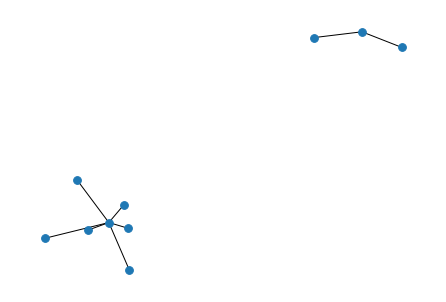

<Figure size 864x864 with 0 Axes>

Year: 1390


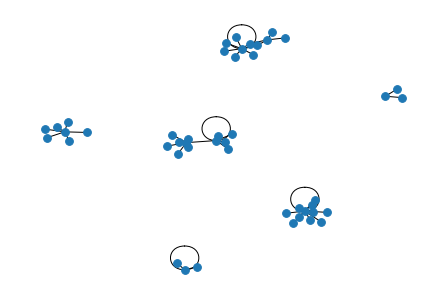

<Figure size 864x864 with 0 Axes>

Year: 1391


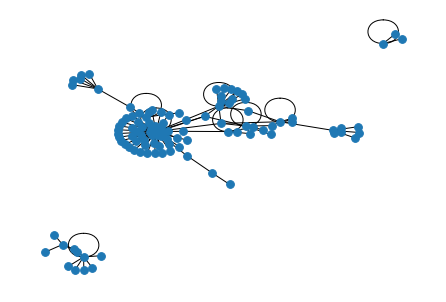

<Figure size 864x864 with 0 Axes>

Year: 1392


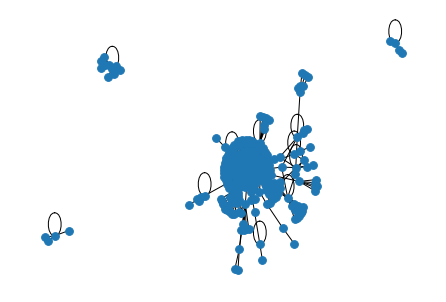

<Figure size 864x864 with 0 Axes>

Year: 1393


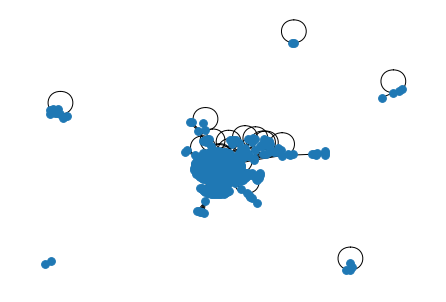

<Figure size 864x864 with 0 Axes>

Year: 1394


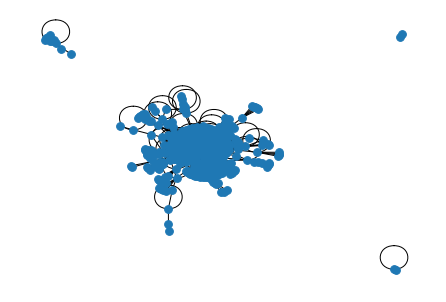

<Figure size 864x864 with 0 Axes>

Year: 1395


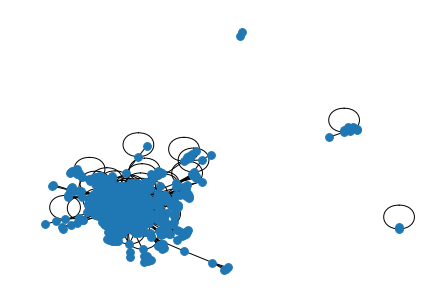

<Figure size 864x864 with 0 Axes>

Year: 1396


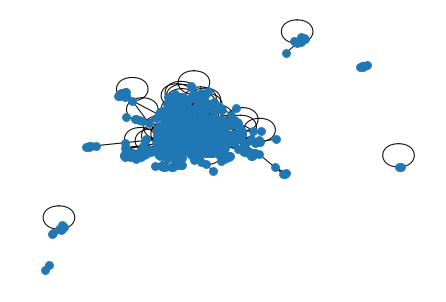

<Figure size 864x864 with 0 Axes>

Year: 1397


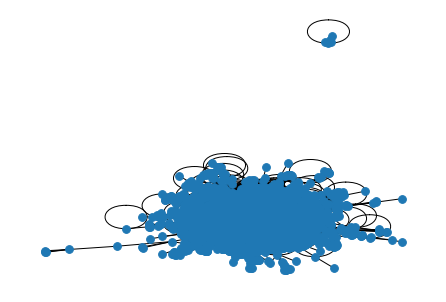

<Figure size 864x864 with 0 Axes>

Year: 1398


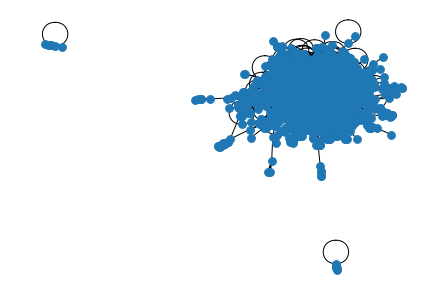

<Figure size 864x864 with 0 Axes>

Year: 1399


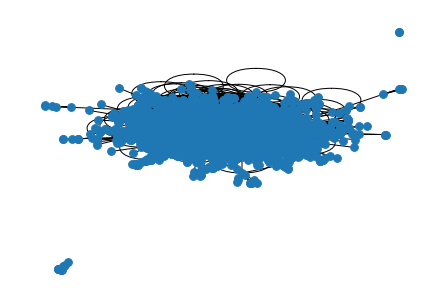

<Figure size 864x864 with 0 Axes>

Year: 1400


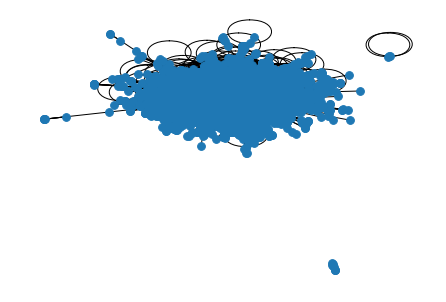

<Figure size 864x864 with 0 Axes>

Year: 1401


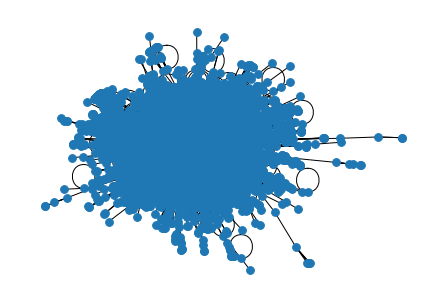

<Figure size 864x864 with 0 Axes>

In [ ]:
for year in YTY_BCC.keys():
    print("Year:", year)
    plot_graph(YTY_BCC[year])

Get year to year description

In [ ]:
YTY_description = {}
for year in YTY_BCC.keys():
    des = graph_description(YTY_BCC[year])
    YTY_description[year] = des

Plot degree distribution of vertices

Year: 1389


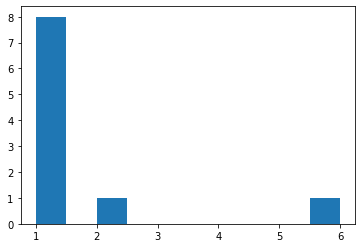

Year: 1390


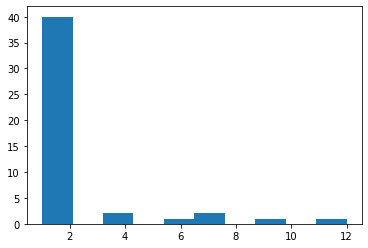

Year: 1391


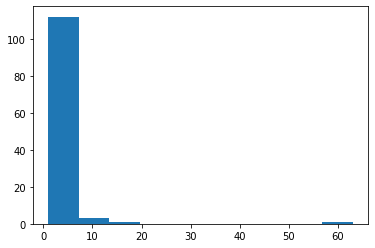

Year: 1392


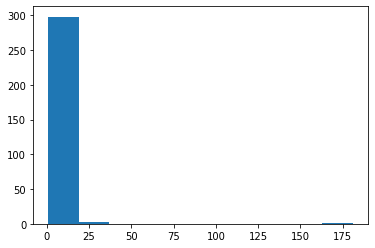

Year: 1393


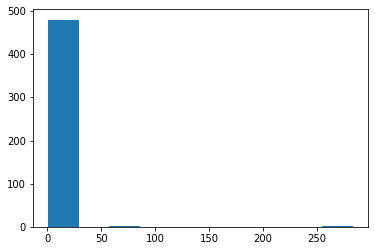

Year: 1394


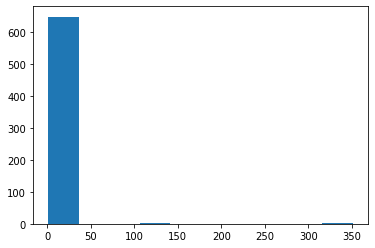

Year: 1395


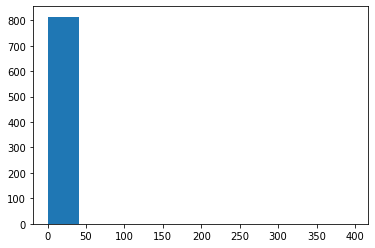

Year: 1396


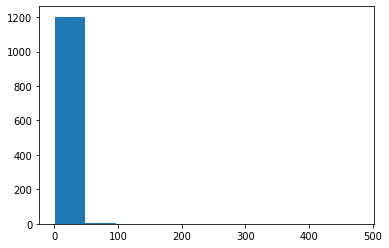

Year: 1397


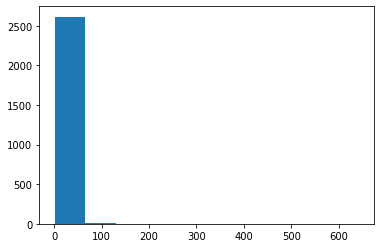

Year: 1398


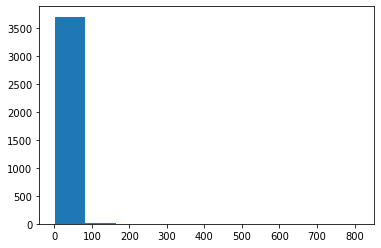

Year: 1399


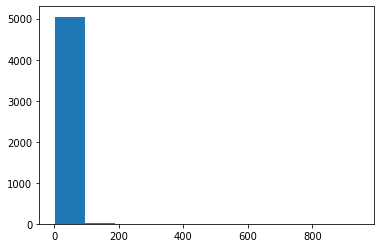

Year: 1400


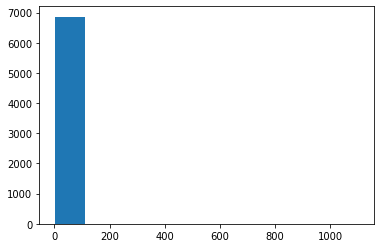

Year: 1401


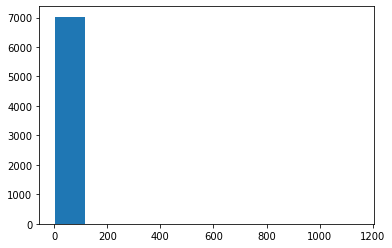

In [ ]:
for year in YTY_description.keys():
  print("Year:", year)
  plot_distribution(YTY_description[year]['degree_distribution_of_vertices'])

Number of nodes in each year

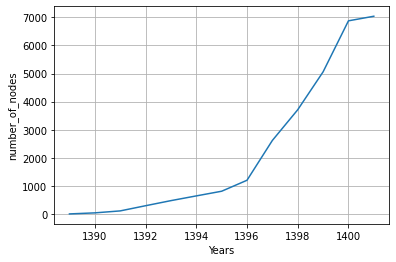

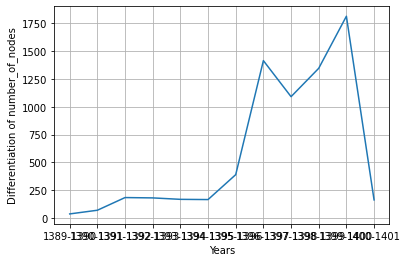

In [ ]:
plot_features_year_to_year(YTY_description, "number_of_nodes")

Curve fitting for number of nodes

[ 7.73236763e+01 -2.15122584e+05  1.49623341e+08]


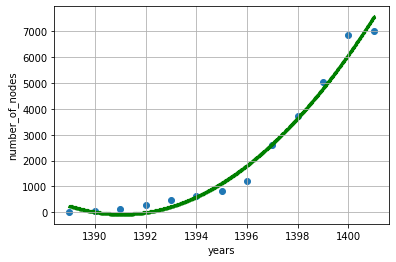

In [ ]:
plot_features_year_to_year_scatter(YTY_description, 'number_of_nodes')

Number of edges in each year

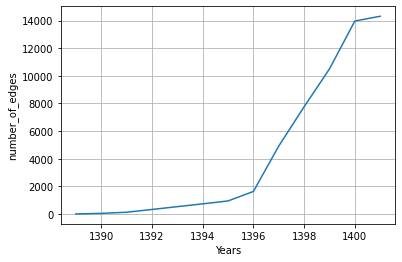

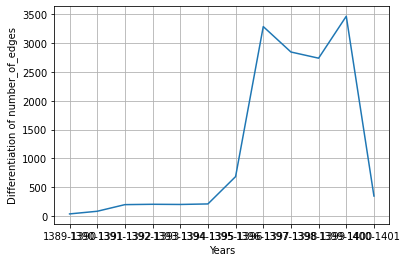

In [ ]:
plot_features_year_to_year(YTY_description, "number_of_edges")

Curve fitting of number of edges

[ 1.75552448e+02 -4.88533713e+05  3.39876915e+08]


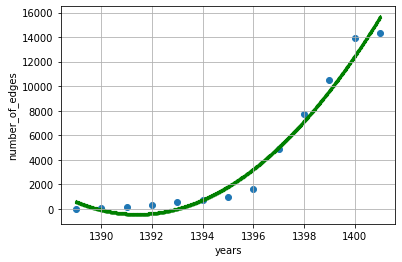

In [ ]:
plot_features_year_to_year_scatter(YTY_description, 'number_of_edges')

Weights summation in each year

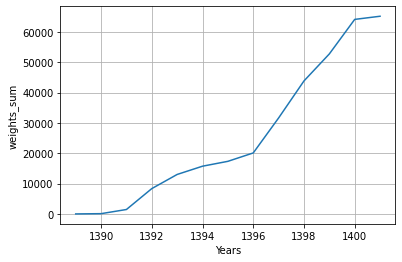

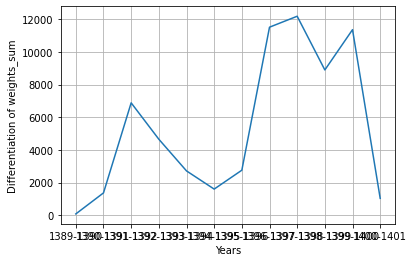

In [ ]:
plot_features_year_to_year(YTY_description, "weights_sum")

Curve fitting on weights sum

[ 4.15299700e+02 -1.15284499e+06  8.00055006e+08]


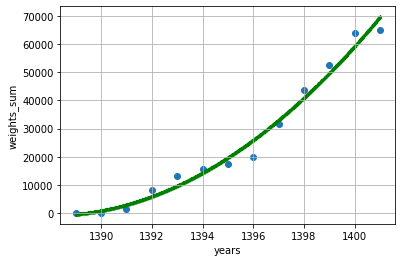

In [ ]:
plot_features_year_to_year_scatter(YTY_description, 'weights_sum')

Number of connected components in each year

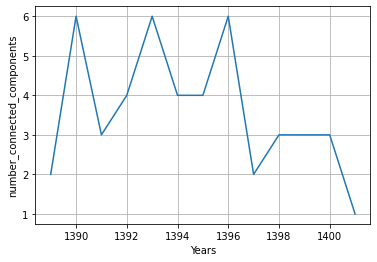

In [ ]:
plot_features_year_to_year(YTY_description, "number_connected_components")

In [ ]:
plot_features_year_to_year_scatter(YTY_description, "number_connected_components")

Global efficiency in each year

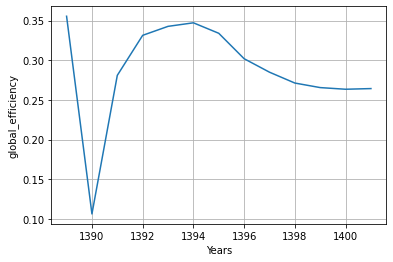

In [ ]:
plot_features_year_to_year(YTY_description, "global_efficiency")

Local efficiency in each year

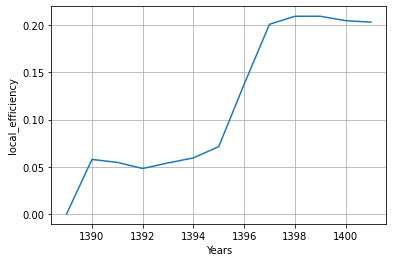

In [ ]:
plot_features_year_to_year(YTY_description, "local_efficiency")

Tree hierarchy in each year

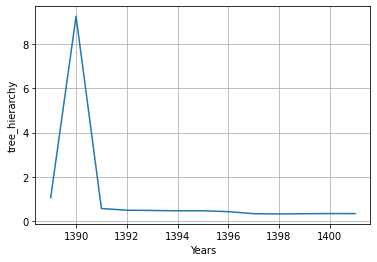

In [ ]:
plot_features_year_to_year(YTY_description, "tree_hierarchy")

Average Clustering plot

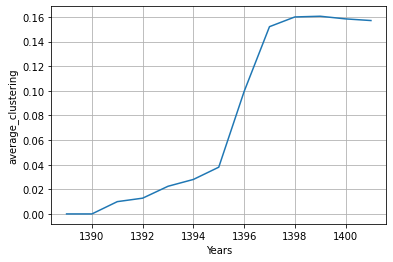

In [ ]:
plot_features_year_to_year(YTY_description, "average_clustering")

Transitivity plot

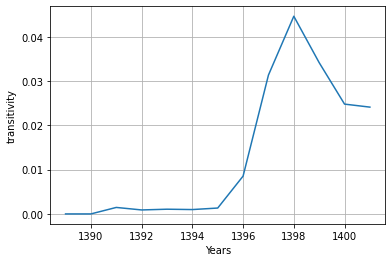

In [ ]:
plot_features_year_to_year(YTY_description, "transitivity")

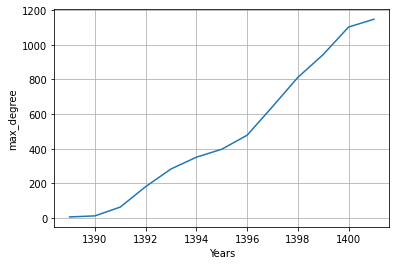

In [ ]:
plot_features_year_to_year(YTY_description, "max_degree")

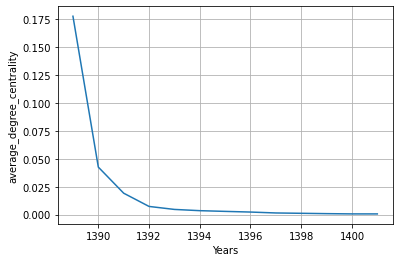

In [ ]:
plot_features_year_to_year(YTY_description, "average_degree_centrality")

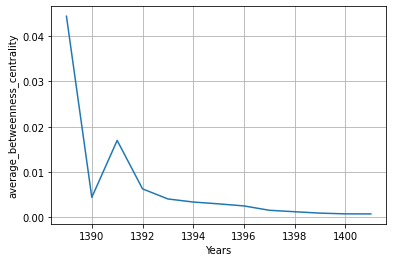

In [ ]:
plot_features_year_to_year(YTY_description, "average_betweenness_centrality")

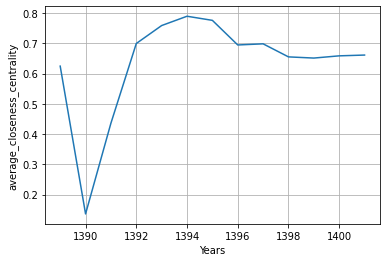

In [ ]:
plot_features_year_to_year(YTY_description, "average_closeness_centrality")

#### 4D plots for group 1

Questions

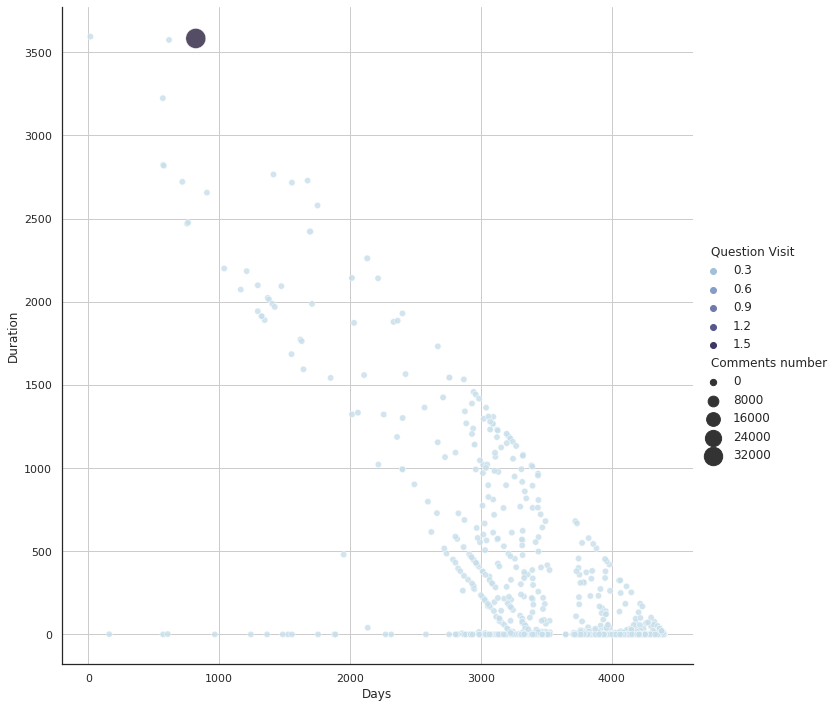

In [ ]:
plot_4D_Questions(graphAnalysis.get_questions_data_frame())

Users

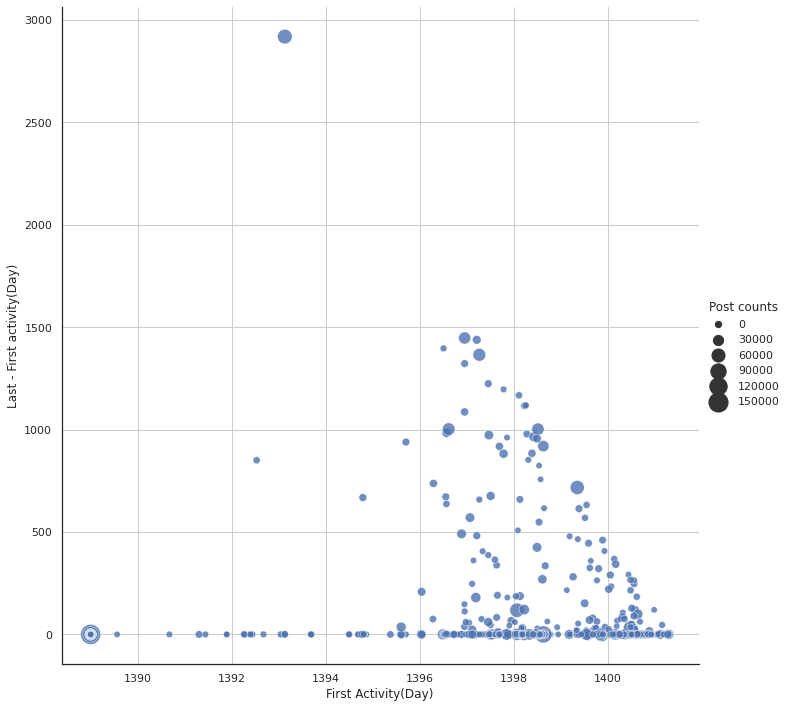

In [ ]:
plot_4D_Users(graphAnalysis.get_users_data_frame())

### Description of all records graph for group 2 :

In [ ]:
graphAnalysis2 = GraphAnalysis("/content/drive/MyDrive/Data_Bases/Group2_Results/Group2_2.db")

#### All questions graph analysis

In [ ]:
all_graph_group2 = graphAnalysis2.get_all_questions_graph()

Number of questions: 408
counter:  50
counter:  100
counter:  150
counter:  200
counter:  250
counter:  300
counter:  350
counter:  400


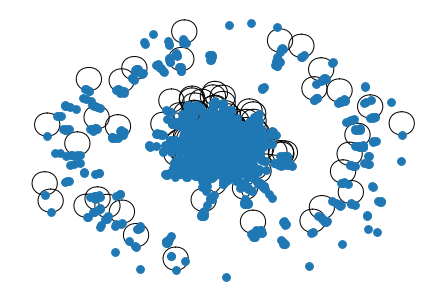

<Figure size 864x864 with 0 Axes>

In [ ]:
plot_graph(all_graph_group2)

In [ ]:
description2 = graph_description(all_graph_group2)

In [ ]:
import pickle
f = open("all_graph_group2_centralities.pkl", "wb")
pickle.dump(description2, f)
f.close()

In [ ]:
f = open("all_graph_group2.pkl", "wb")
pickle.dump(description2, f)
f.close()

In [ ]:
description2['number_of_nodes']

2002

In [ ]:
description2['number_of_edges']

2474

In [ ]:
description2['edges']

e7b922f8-759e-4f67-9828-61ef8264f63b
a371a30b-a96c-4a30-a4eb-38316cba3bbb
e7b922f8-759e-4f67-9828-61ef8264f63b
e7b922f8-759e-4f67-9828-61ef8264f63b
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
dcc1194d-59d2-4609-9a1f-c61f018b2b97
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
2a6e6e42-1e56-469b-8973-135426bf95ce
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
dcc1194d-59d2-4609-9a1f-c61f018b2b97
2dad9799-8883-4eec-95e8-884fe83a6ea7
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
a95b1de9-16dc-4071-8b85-1578389134e1
4343117a-2dd4-4742-9f8a-2302f012869e
a95b1de9-16dc-4071-8b85-1578389134e1
404cf46a-1800-4b07-a378-08e61799fe5e
a95b1de9-16dc-4071-8b85-1578389134e1
20ca9153-a1c3-4f7b-8a15-a69af09224cc
a95b1de9-16dc-4071-8b85-1578389134e1
cd21dbc4-4550-446b-8f4e-7585383546c3
a95b1de9-16dc-4071-8b85-1578389134e1
c

[[[UserID : e7b922f8-759e-4f67-9828-61ef8264f63b, Username : کوردیااا۹۸, Description : None, SignUpDate : 1398-04-06 00:00:00, PostCount : 124],
  [UserID : a371a30b-a96c-4a30-a4eb-38316cba3bbb, Username : آریاتس96, Description : None, SignUpDate : 1396-07-06 00:00:00, PostCount : 2683],
  {'weight': 4}],
 [[UserID : e7b922f8-759e-4f67-9828-61ef8264f63b, Username : کوردیااا۹۸, Description : None, SignUpDate : 1398-04-06 00:00:00, PostCount : 124],
  [UserID : e7b922f8-759e-4f67-9828-61ef8264f63b, Username : کوردیااا۹۸, Description : None, SignUpDate : 1398-04-06 00:00:00, PostCount : 124],
  {'weight': 2}],
 [[UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861],
  [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755],
  {'weight': 2}],
 [[UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : Non

In [ ]:
description2['weights_sum']

6371

In [ ]:
description2['is_connected']

False

In [ ]:
description2['number_connected_components']

88

In [ ]:
description2['connected_components']

e7b922f8-759e-4f67-9828-61ef8264f63b
a371a30b-a96c-4a30-a4eb-38316cba3bbb
a371a30b-a96c-4a30-a4eb-38316cba3bbb
e7b922f8-759e-4f67-9828-61ef8264f63b
5b5245a4-d776-4983-8cf7-9096bb655801
4e522820-f34f-4e1c-9c50-1b4f112f9ef6
0d75a4cf-5d3b-4825-a431-215d51400c00
b915e455-18d6-4fac-83df-91f284fa7e0b
9687a1ad-e1d7-4fd1-b05d-84ce9a2d080a
4c0783b9-16fd-4107-a74b-63debac55c61
95fa198d-a60e-497c-bb7d-ac96909d4714
1596a57f-21c5-4be4-973b-dc1a0823602f
11870249-bb19-419d-b37a-cf403ac19f50
fd2963e7-1c51-45e6-b3a2-96ffecc9c6c8
11a16fef-5283-43fb-a88d-157ef13521c7
e89ec4ad-2663-434d-981c-489d8209e107
de5032ee-6999-4d1b-81c0-32890f19ccf4
91859e9a-b369-4408-bd64-221b8bbe6955
191ef8fb-8e37-452c-9aa4-31e0ca3e91b4
8cf8747a-fee6-4072-8f2f-63d6c82f2223
9b1ce68c-9a99-4770-a891-c78e593deaf2
5988bd13-6002-4f33-9894-e4ffab46fa6f
041d7222-9b4f-4407-a9c0-156af5d09db6
f0de132c-bad8-40a7-89a6-0149c63b7f14
7da42b98-6df4-4a67-92a1-26efcaa988aa
775b368b-79ef-4756-bfca-a00a3a94e4e7
0688a677-b85b-4dad-bd3b-b6b5dac7ff09
9

[{[UserID : a371a30b-a96c-4a30-a4eb-38316cba3bbb, Username : آریاتس96, Description : None, SignUpDate : 1396-07-06 00:00:00, PostCount : 2683],
  [UserID : e7b922f8-759e-4f67-9828-61ef8264f63b, Username : کوردیااا۹۸, Description : None, SignUpDate : 1398-04-06 00:00:00, PostCount : 124]},
 {[UserID : 5b5245a4-d776-4983-8cf7-9096bb655801, Username : دهه_شصتی, Description : None, SignUpDate : 1397-06-05 00:00:00, PostCount : 3730],
  [UserID : 4e522820-f34f-4e1c-9c50-1b4f112f9ef6, Username : minaaaaa1, Description : None, SignUpDate : 1392-02-18 00:00:00, PostCount : 10186],
  [UserID : 0d75a4cf-5d3b-4825-a431-215d51400c00, Username : نیلوفربانووو, Description : None, SignUpDate : 1396-07-20 00:00:00, PostCount : 1775],
  [UserID : b915e455-18d6-4fac-83df-91f284fa7e0b, Username : maiimaii, Description : None, SignUpDate : 1396-11-25 00:00:00, PostCount : 581],
  [UserID : 9687a1ad-e1d7-4fd1-b05d-84ce9a2d080a, Username : دخترفروردین, Description : None, SignUpDate : 1395-06-01 00:00:00, P

In [ ]:
description2['global_efficiency']

0.10361285043976762

In [ ]:
description2['local_efficiency']

0.14357306767603142

In [ ]:
description2['graph_clustering']

e7b922f8-759e-4f67-9828-61ef8264f63b
a371a30b-a96c-4a30-a4eb-38316cba3bbb
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
2a6e6e42-1e56-469b-8973-135426bf95ce
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
dcc1194d-59d2-4609-9a1f-c61f018b2b97
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
404cf46a-1800-4b07-a378-08e61799fe5e
4343117a-2dd4-4742-9f8a-2302f012869e
3ecc9146-46da-4af2-9111-514fc2cd93de
f8887cde-ac77-443a-848d-ba7f884139b9
4b46f279-5b5b-4ff9-bc9c-618456e66d7d
22e90d0e-80d9-4e78-9e81-8727c8f5d50c
20ca9153-a1c3-4f7b-8a15-a69af09224cc
cd21dbc4-4550-446b-8f4e-7585383546c3
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
e677b7c8-5600-42d7-9d34-39a4c1cf77d5
9064a98c-c14e-456d-8c22-3d0764e173cd
22db5f02-5954-4cb1-b85c-8cd76be0609e
3b7a58a3-e036-416e-b773-6cf3dc1ac672
29eb06d0-064e-4ffc-8498-bf35d7ab1cb8
c93a8f00-15aa-4c72-bee4-1b52105e6a76
54522759-4558-485e-a359-a8e7e71122e0
60005d53-707d-4e73-b944-52dd2816eaa5
96e96672-a545-44b9-a03f-aabfc933701e
5

{[UserID : e7b922f8-759e-4f67-9828-61ef8264f63b, Username : کوردیااا۹۸, Description : None, SignUpDate : 1398-04-06 00:00:00, PostCount : 124]: 0,
 [UserID : a371a30b-a96c-4a30-a4eb-38316cba3bbb, Username : آریاتس96, Description : None, SignUpDate : 1396-07-06 00:00:00, PostCount : 2683]: 0,
 [UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861]: 0,
 [UserID : 2a6e6e42-1e56-469b-8973-135426bf95ce, Username : به_کبودی_یاس, Description : None, SignUpDate : 1397-07-24 00:00:00, PostCount : 8501]: 0,
 [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755]: 0,
 [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249]: 0,
 [UserID : 26bd7aef-1266-47ce-bfe2-61b8bbe38c41, Username : zaryyyyssssmm, Description : None, SignUpDate : 1399-12-25 00:0

In [ ]:
description2['nodes_info']

e7b922f8-759e-4f67-9828-61ef8264f63b
a371a30b-a96c-4a30-a4eb-38316cba3bbb
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
2a6e6e42-1e56-469b-8973-135426bf95ce
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
dcc1194d-59d2-4609-9a1f-c61f018b2b97
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
404cf46a-1800-4b07-a378-08e61799fe5e
4343117a-2dd4-4742-9f8a-2302f012869e
3ecc9146-46da-4af2-9111-514fc2cd93de
f8887cde-ac77-443a-848d-ba7f884139b9
4b46f279-5b5b-4ff9-bc9c-618456e66d7d
22e90d0e-80d9-4e78-9e81-8727c8f5d50c
20ca9153-a1c3-4f7b-8a15-a69af09224cc
cd21dbc4-4550-446b-8f4e-7585383546c3
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
e677b7c8-5600-42d7-9d34-39a4c1cf77d5
9064a98c-c14e-456d-8c22-3d0764e173cd
22db5f02-5954-4cb1-b85c-8cd76be0609e
3b7a58a3-e036-416e-b773-6cf3dc1ac672
29eb06d0-064e-4ffc-8498-bf35d7ab1cb8
c93a8f00-15aa-4c72-bee4-1b52105e6a76
54522759-4558-485e-a359-a8e7e71122e0
60005d53-707d-4e73-b944-52dd2816eaa5
96e96672-a545-44b9-a03f-aabfc933701e
5

{[UserID : e7b922f8-759e-4f67-9828-61ef8264f63b, Username : کوردیااا۹۸, Description : None, SignUpDate : 1398-04-06 00:00:00, PostCount : 124]: {'degree': 3},
 [UserID : a371a30b-a96c-4a30-a4eb-38316cba3bbb, Username : آریاتس96, Description : None, SignUpDate : 1396-07-06 00:00:00, PostCount : 2683]: {'degree': 1},
 [UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861]: {'degree': 4},
 [UserID : 2a6e6e42-1e56-469b-8973-135426bf95ce, Username : به_کبودی_یاس, Description : None, SignUpDate : 1397-07-24 00:00:00, PostCount : 8501]: {'degree': 1},
 [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755]: {'degree': 3},
 [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249]: {'degree': 2},
 [UserID : 26bd7aef-1266-47ce-bfe2-61b8bbe38c41, Us

In [ ]:
description2['degree_distribution_of_vertices']

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [ ]:
description2['communities_size']

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 8,
 8,
 9,
 9,
 9,
 10,
 10,
 10,
 10,
 11,
 13,
 14,
 17,
 1643]

In [ ]:
description2['degree_centrality']

e7b922f8-759e-4f67-9828-61ef8264f63b
a371a30b-a96c-4a30-a4eb-38316cba3bbb
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
2a6e6e42-1e56-469b-8973-135426bf95ce
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
dcc1194d-59d2-4609-9a1f-c61f018b2b97
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
404cf46a-1800-4b07-a378-08e61799fe5e
4343117a-2dd4-4742-9f8a-2302f012869e
3ecc9146-46da-4af2-9111-514fc2cd93de
f8887cde-ac77-443a-848d-ba7f884139b9
4b46f279-5b5b-4ff9-bc9c-618456e66d7d
22e90d0e-80d9-4e78-9e81-8727c8f5d50c
20ca9153-a1c3-4f7b-8a15-a69af09224cc
cd21dbc4-4550-446b-8f4e-7585383546c3
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
e677b7c8-5600-42d7-9d34-39a4c1cf77d5
9064a98c-c14e-456d-8c22-3d0764e173cd
22db5f02-5954-4cb1-b85c-8cd76be0609e
3b7a58a3-e036-416e-b773-6cf3dc1ac672
29eb06d0-064e-4ffc-8498-bf35d7ab1cb8
c93a8f00-15aa-4c72-bee4-1b52105e6a76
54522759-4558-485e-a359-a8e7e71122e0
60005d53-707d-4e73-b944-52dd2816eaa5
96e96672-a545-44b9-a03f-aabfc933701e
5

{[UserID : e7b922f8-759e-4f67-9828-61ef8264f63b, Username : کوردیااا۹۸, Description : None, SignUpDate : 1398-04-06 00:00:00, PostCount : 124]: 0.0014992503748125937,
 [UserID : a371a30b-a96c-4a30-a4eb-38316cba3bbb, Username : آریاتس96, Description : None, SignUpDate : 1396-07-06 00:00:00, PostCount : 2683]: 0.0004997501249375312,
 [UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861]: 0.001999000499750125,
 [UserID : 2a6e6e42-1e56-469b-8973-135426bf95ce, Username : به_کبودی_یاس, Description : None, SignUpDate : 1397-07-24 00:00:00, PostCount : 8501]: 0.0004997501249375312,
 [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755]: 0.0014992503748125937,
 [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249]: 0.0009995002498750624,
 [Us

In [ ]:
description2['betweenness_centrality']

e7b922f8-759e-4f67-9828-61ef8264f63b
a371a30b-a96c-4a30-a4eb-38316cba3bbb
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
2a6e6e42-1e56-469b-8973-135426bf95ce
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
dcc1194d-59d2-4609-9a1f-c61f018b2b97
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
404cf46a-1800-4b07-a378-08e61799fe5e
4343117a-2dd4-4742-9f8a-2302f012869e
3ecc9146-46da-4af2-9111-514fc2cd93de
f8887cde-ac77-443a-848d-ba7f884139b9
4b46f279-5b5b-4ff9-bc9c-618456e66d7d
22e90d0e-80d9-4e78-9e81-8727c8f5d50c
20ca9153-a1c3-4f7b-8a15-a69af09224cc
cd21dbc4-4550-446b-8f4e-7585383546c3
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
e677b7c8-5600-42d7-9d34-39a4c1cf77d5
9064a98c-c14e-456d-8c22-3d0764e173cd
22db5f02-5954-4cb1-b85c-8cd76be0609e
3b7a58a3-e036-416e-b773-6cf3dc1ac672
29eb06d0-064e-4ffc-8498-bf35d7ab1cb8
c93a8f00-15aa-4c72-bee4-1b52105e6a76
54522759-4558-485e-a359-a8e7e71122e0
60005d53-707d-4e73-b944-52dd2816eaa5
96e96672-a545-44b9-a03f-aabfc933701e
5

{[UserID : e7b922f8-759e-4f67-9828-61ef8264f63b, Username : کوردیااا۹۸, Description : None, SignUpDate : 1398-04-06 00:00:00, PostCount : 124]: 0.0,
 [UserID : a371a30b-a96c-4a30-a4eb-38316cba3bbb, Username : آریاتس96, Description : None, SignUpDate : 1396-07-06 00:00:00, PostCount : 2683]: 0.0,
 [UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861]: 0.002457271364317841,
 [UserID : 2a6e6e42-1e56-469b-8973-135426bf95ce, Username : به_کبودی_یاس, Description : None, SignUpDate : 1397-07-24 00:00:00, PostCount : 8501]: 0.0,
 [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755]: 0.0016396801599200398,
 [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249]: 0.0032743628185907046,
 [UserID : 26bd7aef-1266-47ce-bfe2-61b8bbe38c41, Username 

In [ ]:
description2['closeness_centrality']

e7b922f8-759e-4f67-9828-61ef8264f63b
a371a30b-a96c-4a30-a4eb-38316cba3bbb
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
2a6e6e42-1e56-469b-8973-135426bf95ce
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
dcc1194d-59d2-4609-9a1f-c61f018b2b97
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
404cf46a-1800-4b07-a378-08e61799fe5e
4343117a-2dd4-4742-9f8a-2302f012869e
3ecc9146-46da-4af2-9111-514fc2cd93de
f8887cde-ac77-443a-848d-ba7f884139b9
4b46f279-5b5b-4ff9-bc9c-618456e66d7d
22e90d0e-80d9-4e78-9e81-8727c8f5d50c
20ca9153-a1c3-4f7b-8a15-a69af09224cc
cd21dbc4-4550-446b-8f4e-7585383546c3
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
e677b7c8-5600-42d7-9d34-39a4c1cf77d5
9064a98c-c14e-456d-8c22-3d0764e173cd
22db5f02-5954-4cb1-b85c-8cd76be0609e
3b7a58a3-e036-416e-b773-6cf3dc1ac672
29eb06d0-064e-4ffc-8498-bf35d7ab1cb8
c93a8f00-15aa-4c72-bee4-1b52105e6a76
54522759-4558-485e-a359-a8e7e71122e0
60005d53-707d-4e73-b944-52dd2816eaa5
96e96672-a545-44b9-a03f-aabfc933701e
5

{[UserID : e7b922f8-759e-4f67-9828-61ef8264f63b, Username : کوردیااا۹۸, Description : None, SignUpDate : 1398-04-06 00:00:00, PostCount : 124]: 0.001999000499750125,
 [UserID : a371a30b-a96c-4a30-a4eb-38316cba3bbb, Username : آریاتس96, Description : None, SignUpDate : 1396-07-06 00:00:00, PostCount : 2683]: 0.001999000499750125,
 [UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861]: 0.16999211801054803,
 [UserID : 2a6e6e42-1e56-469b-8973-135426bf95ce, Username : به_کبودی_یاس, Description : None, SignUpDate : 1397-07-24 00:00:00, PostCount : 8501]: 0.12973564585536956,
 [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755]: 0.154081111465136,
 [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249]: 0.21417013725863004,
 [UserID : 26bd

In [ ]:
description2['diameter']

inf

In [ ]:
description2['average_clustering']

0.08666809068198422

In [ ]:
description2['transitivity']

0.050435227854582695

In [ ]:
description2['small_worldness_omega']

In [ ]:
description2['small_worldness_sigma']

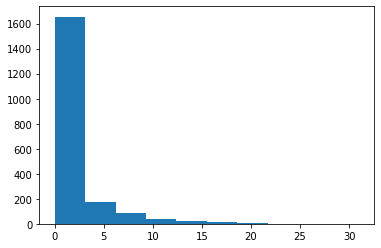

In [ ]:
plot_degree_histogram(description2)

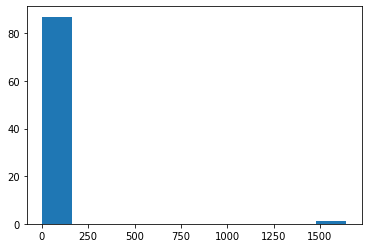

In [ ]:
plot_communities_size_histogram(description2)

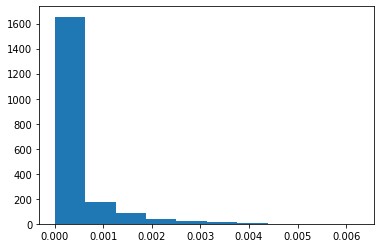

In [ ]:
plot_degree_distribution(description2)

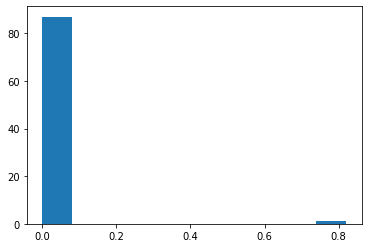

In [ ]:
plot_communities_distribution(description2)

####Year to year description

Getting each year graph

In [ ]:
year_to_year_graph2 = graphAnalysis2.get_year_to_year_graph()

Year:  1389
13
13
Year:  1390
21
20
Year:  1391
49
47
Year:  1392
112
110
Year:  1393
162
159
Year:  1394
200
199
Year:  1395
232
232
Year:  1396
387
405
Year:  1397
704
832
Year:  1398
1111
1388
Year:  1399
1406
1734
Year:  1400
1819
2264
Year:  1401
1987
2474


Plot each year graph

Year:  1389


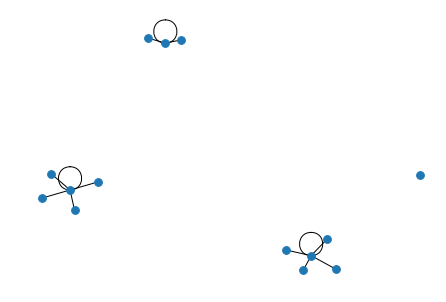

<Figure size 864x864 with 0 Axes>

Year:  1390


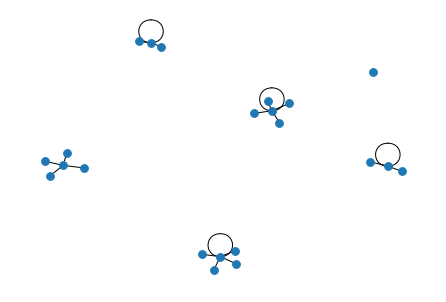

<Figure size 864x864 with 0 Axes>

Year:  1391


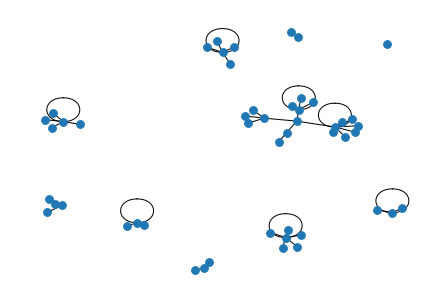

<Figure size 864x864 with 0 Axes>

Year:  1392


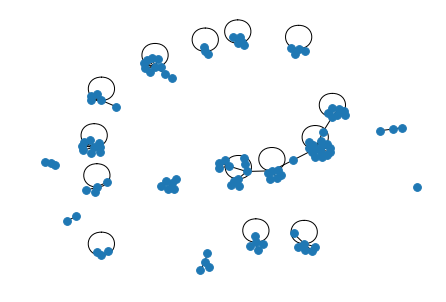

<Figure size 864x864 with 0 Axes>

Year:  1393


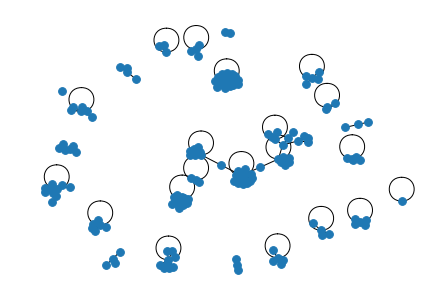

<Figure size 864x864 with 0 Axes>

Year:  1394


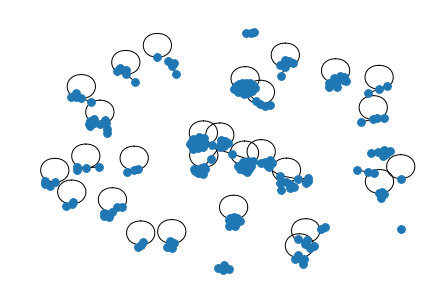

<Figure size 864x864 with 0 Axes>

Year:  1395


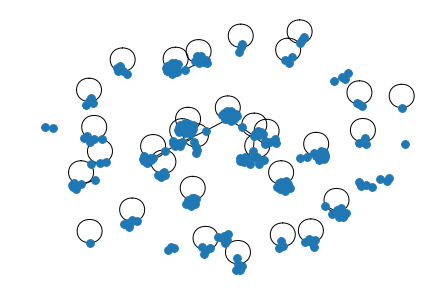

<Figure size 864x864 with 0 Axes>

Year:  1396


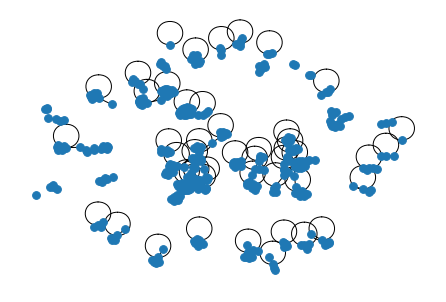

<Figure size 864x864 with 0 Axes>

Year:  1397


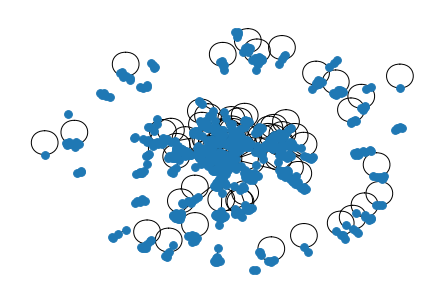

<Figure size 864x864 with 0 Axes>

Year:  1398


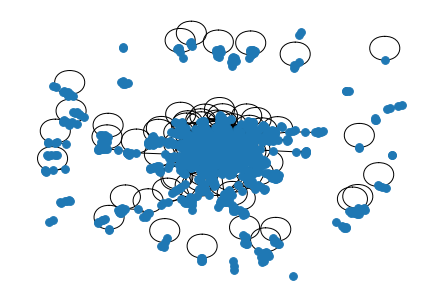

<Figure size 864x864 with 0 Axes>

Year:  1399


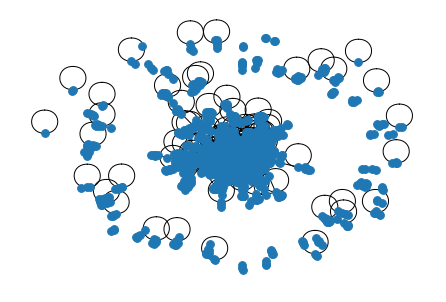

<Figure size 864x864 with 0 Axes>

Year:  1400


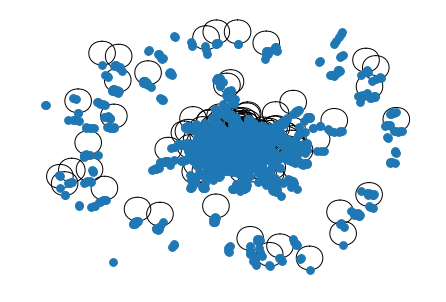

<Figure size 864x864 with 0 Axes>

Year:  1401


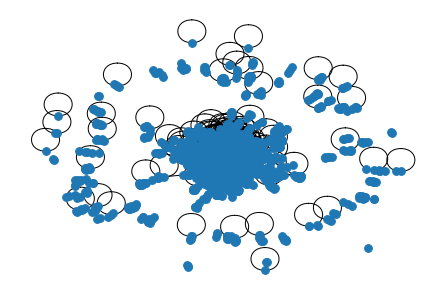

<Figure size 864x864 with 0 Axes>

In [ ]:
for year in year_to_year_graph2.keys():
  print("Year: ", year)
  plot_graph(year_to_year_graph2[year])

Get each year graph's description

In [ ]:
year_to_year_description2 = {}
for year in year_to_year_graph2.keys():
  print("Year: ", year)
  year_to_year_description2[year] = graph_description(year_to_year_graph2[year])

Year:  1389
Year:  1390
Year:  1391
Year:  1392
Year:  1393
Year:  1394
Year:  1395
Year:  1396
Year:  1397
Year:  1398
Year:  1399
Year:  1400
Year:  1401


Print each year's description

In [ ]:
for year in year_to_year_description2.keys():
  print('-'*60)
  print("Description of year", year, ':')
  description = year_to_year_description2[year]
  for feature in features_names:
    print(feature, ': ', description[feature])

Plot degree distribution of vertices

Year: 1389


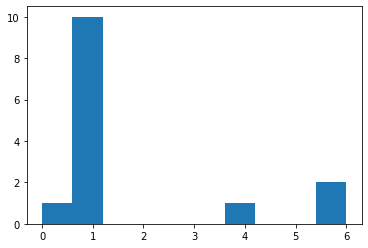

Year: 1390


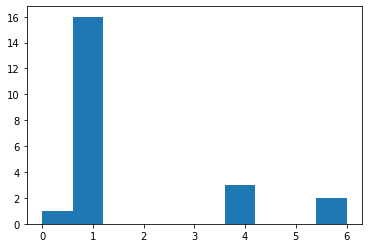

Year: 1391


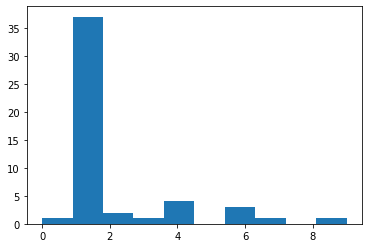

Year: 1392


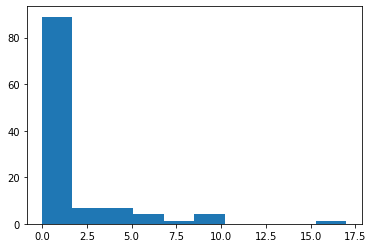

Year: 1393


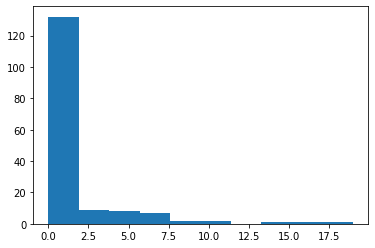

Year: 1394


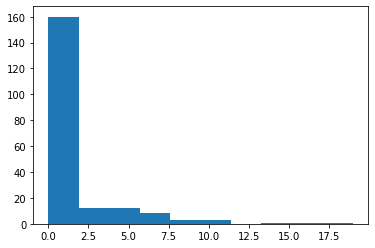

Year: 1395


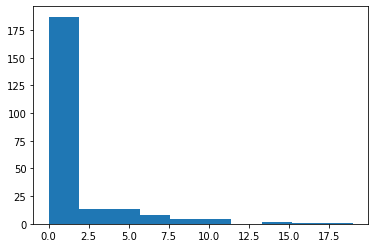

Year: 1396


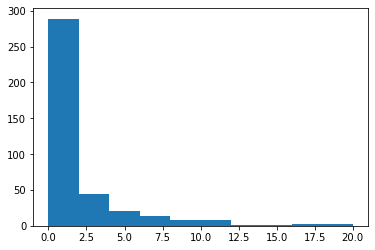

Year: 1397


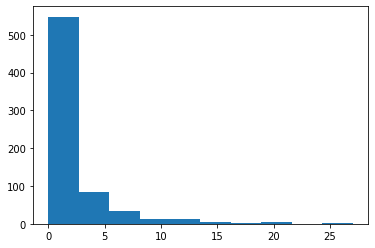

Year: 1398


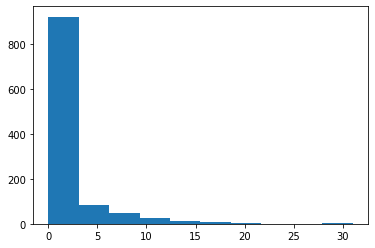

Year: 1399


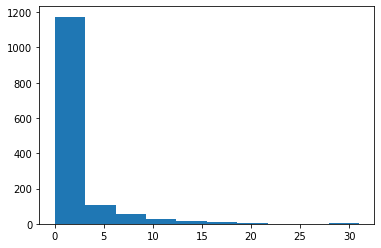

Year: 1400


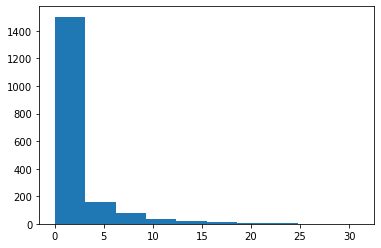

Year: 1401


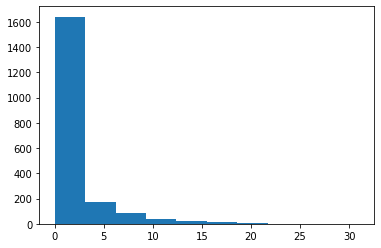

In [ ]:
for year in year_to_year_description2.keys():
  print("Year:", year)
  plot_distribution(year_to_year_description2[year]['degree_distribution_of_vertices'])

Number of nodes in each year

features:  [14, 22, 50, 113, 163, 201, 233, 388, 705, 1112, 1407, 1820, 1988]


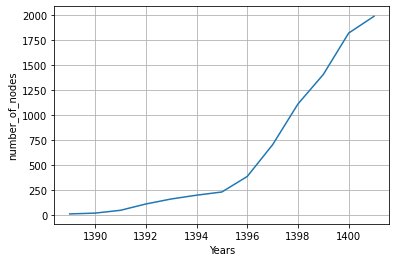

new_features:  [  8  28  63  50  38  32 155 317 407 295 413 168]


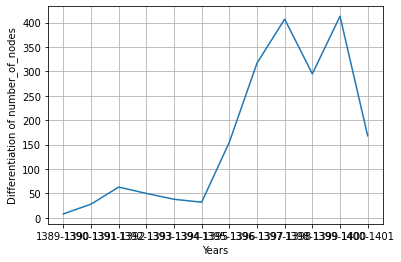

In [ ]:
plot_features_year_to_year(year_to_year_description2, "number_of_nodes")

Curve fitting for number of nodes

[ 2.07272727e+01 -5.76613437e+04  4.01021253e+07]


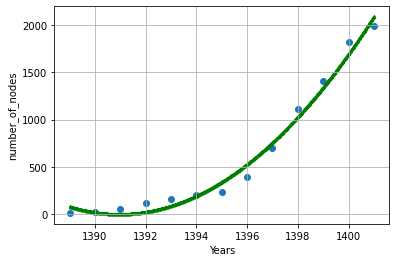

In [ ]:
plot_features_year_to_year_scatter(year_to_year_description2, 'number_of_nodes')

Number of edges in each year

features:  [13, 20, 47, 110, 159, 199, 232, 405, 832, 1388, 1734, 2264, 2474]


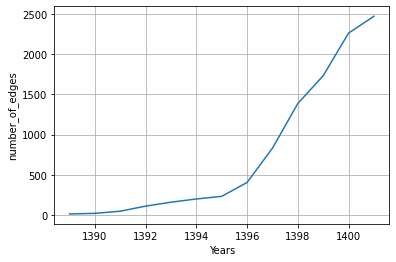

new_features:  [  7  27  63  49  40  33 173 427 556 346 530 210]


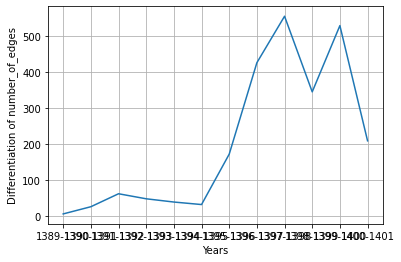

In [ ]:
plot_features_year_to_year(year_to_year_description2, "number_of_edges")

Curve fitting of number of edges

[ 2.74225774e+01 -7.62995405e+04  5.30732136e+07]


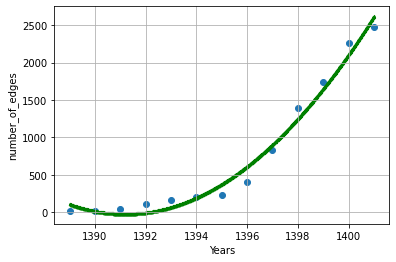

In [ ]:
plot_features_year_to_year_scatter(year_to_year_description2, 'number_of_edges')

Weights summation in each year

features:  [25, 32, 73, 187, 369, 516, 738, 1175, 2327, 3601, 4343, 5782, 6371]


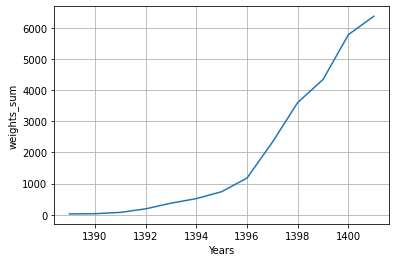

new_features:  [   7   41  114  182  147  222  437 1152 1274  742 1439  589]


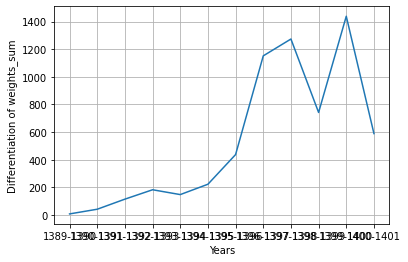

In [ ]:
plot_features_year_to_year(year_to_year_description2, "weights_sum")

Curve fitting on weights sum

[ 6.75739261e+01 -1.87988820e+05  1.30744872e+08]


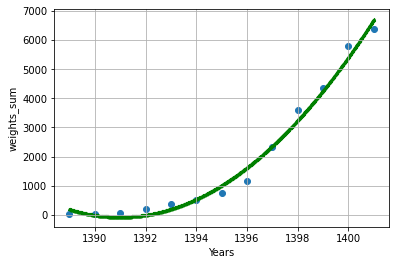

In [ ]:
plot_features_year_to_year_scatter(year_to_year_description2, 'weights_sum')

Number of connected components in each year

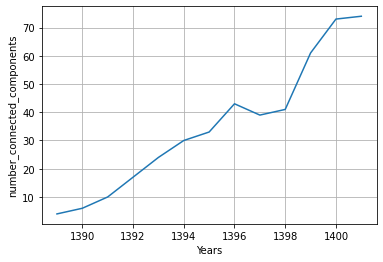

In [ ]:
plot_features_year_to_year(year_to_year_description2, "number_connected_components")

In [ ]:
plot_features_year_to_year_scatter(year_to_year_description2, "number_connected_components")

Global efficiency in each year

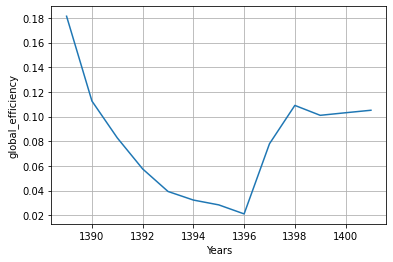

In [ ]:
plot_features_year_to_year(year_to_year_description2, "global_efficiency")

Local efficiency in each year

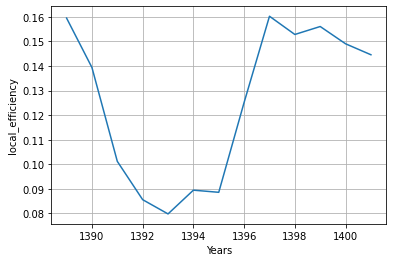

In [ ]:
plot_features_year_to_year(year_to_year_description2, "local_efficiency")

Tree hierarchy in each year

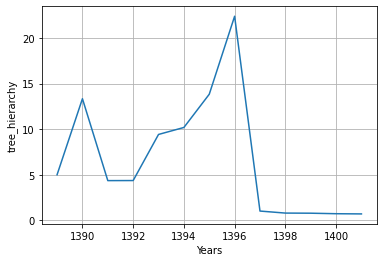

In [ ]:
plot_features_year_to_year(year_to_year_description2, "tree_hierarchy")

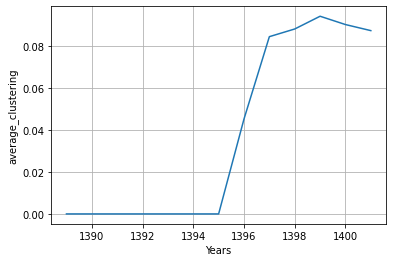

In [ ]:
plot_features_year_to_year(year_to_year_description2, "average_clustering")

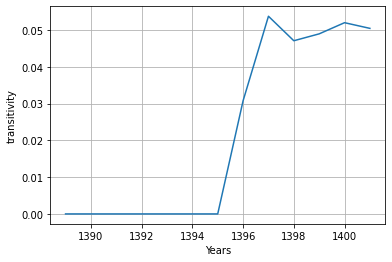

In [ ]:
plot_features_year_to_year(year_to_year_description2, "transitivity")

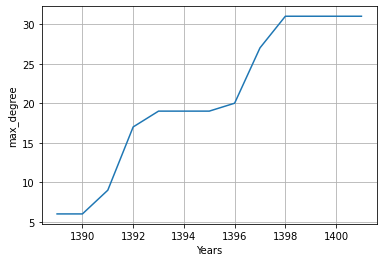

In [ ]:
plot_features_year_to_year(year_to_year_description2, "max_degree")

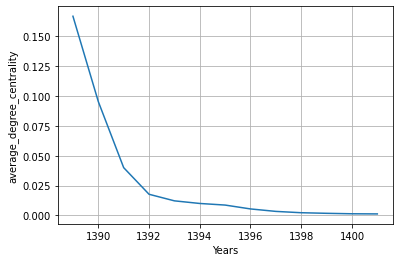

In [ ]:
plot_features_year_to_year(year_to_year_description2, "average_degree_centrality")

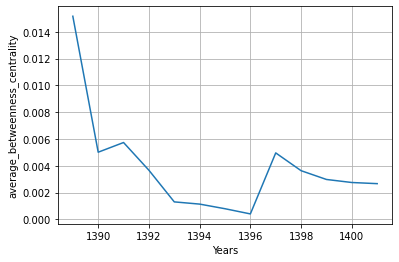

In [ ]:
plot_features_year_to_year(year_to_year_description2, "average_betweenness_centrality")

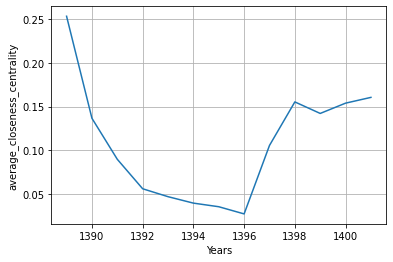

In [ ]:
plot_features_year_to_year(year_to_year_description2, "average_closeness_centrality")

####Biggest Connected Component Description for Group 2:

In [ ]:
BCC_group2 = get_biggest_connected_component(all_graph_group2)

In [ ]:
BCC_group2_description = graph_description(BCC_group2)

In [ ]:
f = open("BCC_group2_centralities.pkl", "wb")
pickle.dump(BCC_group2_description, f)
f.close()

In [ ]:
f = open("BCC_group2.pkl", "wb")
pickle.dump(BCC_group2_description, f)
f.close()

In [ ]:
BCC_group2_description['number_of_nodes']

1643

In [ ]:
BCC_group2_description['number_of_edges']

2165

In [ ]:
BCC_group2_description['edges']

18a4e176-68dd-4da4-8a6c-d4ec07e20d22
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
dcc1194d-59d2-4609-9a1f-c61f018b2b97
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
18a4e176-68dd-4da4-8a6c-d4ec07e20d22
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
dcc1194d-59d2-4609-9a1f-c61f018b2b97
2dad9799-8883-4eec-95e8-884fe83a6ea7
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
2a6e6e42-1e56-469b-8973-135426bf95ce
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
a95b1de9-16dc-4071-8b85-1578389134e1
4343117a-2dd4-4742-9f8a-2302f012869e
a95b1de9-16dc-4071-8b85-1578389134e1
404cf46a-1800-4b07-a378-08e61799fe5e
a95b1de9-16dc-4071-8b85-1578389134e1
20ca9153-a1c3-4f7b-8a15-a69af09224cc
a95b1de9-16dc-4071-8b85-1578389134e1
cd21dbc4-4550-446b-8f4e-7585383546c3
a95b1de9-16dc-4071-8b85-1578389134e1
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
a95b1de9-16dc-4071-8b85-1578389134e1
9064a98c-c14e-456d-8c22-3d0764e173cd
a95b1de9-16dc-4071-8b85-1578389134e1
2

[[[UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861],
  [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755],
  {'weight': 2}],
 [[UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861],
  [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249],
  {'weight': 1}],
 [[UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861],
  [UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861],
  {'weight': 1}],
 [[UserID : 26bd7aef-1266-47ce-bfe2-61b8bbe38c41, Username : zaryyyyssssmm, Description : None, SignU

In [ ]:
BCC_group2_description['weights_sum']

5732

In [ ]:
BCC_group2_description['is_connected']

True

In [ ]:
BCC_group2_description['number_connected_components']

1

In [ ]:
BCC_group2_description['global_efficiency']

0.15337949408546747

In [ ]:
BCC_group2_description['local_efficiency']

0.15585429029076836

In [ ]:
BCC_group2_description['graph_clustering']

18a4e176-68dd-4da4-8a6c-d4ec07e20d22
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
dcc1194d-59d2-4609-9a1f-c61f018b2b97
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
2a6e6e42-1e56-469b-8973-135426bf95ce
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
4343117a-2dd4-4742-9f8a-2302f012869e
404cf46a-1800-4b07-a378-08e61799fe5e
3ecc9146-46da-4af2-9111-514fc2cd93de
f8887cde-ac77-443a-848d-ba7f884139b9
4b46f279-5b5b-4ff9-bc9c-618456e66d7d
22e90d0e-80d9-4e78-9e81-8727c8f5d50c
20ca9153-a1c3-4f7b-8a15-a69af09224cc
cd21dbc4-4550-446b-8f4e-7585383546c3
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
22db5f02-5954-4cb1-b85c-8cd76be0609e
3b7a58a3-e036-416e-b773-6cf3dc1ac672
9064a98c-c14e-456d-8c22-3d0764e173cd
29eb06d0-064e-4ffc-8498-bf35d7ab1cb8
a254b217-44ac-450e-b82e-8d806ab76976
96e96672-a545-44b9-a03f-aabfc933701e
429593a3-7584-4362-815d-c68cbdfd1aee
5d15aada-892a-46ce-bd5d-9ef93d17dca6
60005d53-707d-4e73-b944-52dd2816eaa5
54522759-4558-485e-a359-a8e7e71122e0
c93a8f00-15aa-4c72-bee4-1b52105e6a76
b

{[UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861]: 0,
 [UserID : 26bd7aef-1266-47ce-bfe2-61b8bbe38c41, Username : zaryyyyssssmm, Description : None, SignUpDate : 1399-12-25 00:00:00, PostCount : 421]: 0,
 [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249]: 0,
 [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755]: 0,
 [UserID : 2a6e6e42-1e56-469b-8973-135426bf95ce, Username : به_کبودی_یاس, Description : None, SignUpDate : 1397-07-24 00:00:00, PostCount : 8501]: 0,
 [UserID : a95b1de9-16dc-4071-8b85-1578389134e1, Username : آلبالو_ترش, Description : None, SignUpDate : 1398-10-04 00:00:00, PostCount : 794]: 0.027777777777777776,
 [UserID : 0dde9eef-7325-44d3-b2b5-d219288f59ed, Username : maggi, Description : None, SignUpDate : 

In [ ]:
BCC_group2_description['nodes_info']

18a4e176-68dd-4da4-8a6c-d4ec07e20d22
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
dcc1194d-59d2-4609-9a1f-c61f018b2b97
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
2a6e6e42-1e56-469b-8973-135426bf95ce
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
4343117a-2dd4-4742-9f8a-2302f012869e
404cf46a-1800-4b07-a378-08e61799fe5e
3ecc9146-46da-4af2-9111-514fc2cd93de
f8887cde-ac77-443a-848d-ba7f884139b9
4b46f279-5b5b-4ff9-bc9c-618456e66d7d
22e90d0e-80d9-4e78-9e81-8727c8f5d50c
20ca9153-a1c3-4f7b-8a15-a69af09224cc
cd21dbc4-4550-446b-8f4e-7585383546c3
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
22db5f02-5954-4cb1-b85c-8cd76be0609e
3b7a58a3-e036-416e-b773-6cf3dc1ac672
9064a98c-c14e-456d-8c22-3d0764e173cd
29eb06d0-064e-4ffc-8498-bf35d7ab1cb8
a254b217-44ac-450e-b82e-8d806ab76976
96e96672-a545-44b9-a03f-aabfc933701e
429593a3-7584-4362-815d-c68cbdfd1aee
5d15aada-892a-46ce-bd5d-9ef93d17dca6
60005d53-707d-4e73-b944-52dd2816eaa5
54522759-4558-485e-a359-a8e7e71122e0
c93a8f00-15aa-4c72-bee4-1b52105e6a76
b

{[UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861]: {'degree': 4},
 [UserID : 26bd7aef-1266-47ce-bfe2-61b8bbe38c41, Username : zaryyyyssssmm, Description : None, SignUpDate : 1399-12-25 00:00:00, PostCount : 421]: {'degree': 1},
 [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249]: {'degree': 2},
 [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755]: {'degree': 3},
 [UserID : 2a6e6e42-1e56-469b-8973-135426bf95ce, Username : به_کبودی_یاس, Description : None, SignUpDate : 1397-07-24 00:00:00, PostCount : 8501]: {'degree': 1},
 [UserID : a95b1de9-16dc-4071-8b85-1578389134e1, Username : آلبالو_ترش, Description : None, SignUpDate : 1398-10-04 00:00:00, PostCount : 794]: {'degree': 9},
 [UserID : 0dde9eef-7325-44d3-b2b5-d219288f59ed

In [ ]:
BCC_group2_description['degree_distribution_of_vertices']

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [ ]:
BCC_group2_description['communities_size']

[1643]

In [ ]:
BCC_group2_description['degree_centrality']

18a4e176-68dd-4da4-8a6c-d4ec07e20d22
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
dcc1194d-59d2-4609-9a1f-c61f018b2b97
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
2a6e6e42-1e56-469b-8973-135426bf95ce
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
4343117a-2dd4-4742-9f8a-2302f012869e
404cf46a-1800-4b07-a378-08e61799fe5e
3ecc9146-46da-4af2-9111-514fc2cd93de
f8887cde-ac77-443a-848d-ba7f884139b9
4b46f279-5b5b-4ff9-bc9c-618456e66d7d
22e90d0e-80d9-4e78-9e81-8727c8f5d50c
20ca9153-a1c3-4f7b-8a15-a69af09224cc
cd21dbc4-4550-446b-8f4e-7585383546c3
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
22db5f02-5954-4cb1-b85c-8cd76be0609e
3b7a58a3-e036-416e-b773-6cf3dc1ac672
9064a98c-c14e-456d-8c22-3d0764e173cd
29eb06d0-064e-4ffc-8498-bf35d7ab1cb8
a254b217-44ac-450e-b82e-8d806ab76976
96e96672-a545-44b9-a03f-aabfc933701e
429593a3-7584-4362-815d-c68cbdfd1aee
5d15aada-892a-46ce-bd5d-9ef93d17dca6
60005d53-707d-4e73-b944-52dd2816eaa5
54522759-4558-485e-a359-a8e7e71122e0
c93a8f00-15aa-4c72-bee4-1b52105e6a76
b

{[UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861]: 0.00243605359317905,
 [UserID : 26bd7aef-1266-47ce-bfe2-61b8bbe38c41, Username : zaryyyyssssmm, Description : None, SignUpDate : 1399-12-25 00:00:00, PostCount : 421]: 0.0006090133982947625,
 [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249]: 0.001218026796589525,
 [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755]: 0.0018270401948842874,
 [UserID : 2a6e6e42-1e56-469b-8973-135426bf95ce, Username : به_کبودی_یاس, Description : None, SignUpDate : 1397-07-24 00:00:00, PostCount : 8501]: 0.0006090133982947625,
 [UserID : a95b1de9-16dc-4071-8b85-1578389134e1, Username : آلبالو_ترش, Description : None, SignUpDate : 1398-10-04 00:00:00, PostCount : 794]: 0.005481120584652862,
 [U

In [ ]:
BCC_group2_description['betweenness_centrality']

18a4e176-68dd-4da4-8a6c-d4ec07e20d22
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
dcc1194d-59d2-4609-9a1f-c61f018b2b97
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
2a6e6e42-1e56-469b-8973-135426bf95ce
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
4343117a-2dd4-4742-9f8a-2302f012869e
404cf46a-1800-4b07-a378-08e61799fe5e
3ecc9146-46da-4af2-9111-514fc2cd93de
f8887cde-ac77-443a-848d-ba7f884139b9
4b46f279-5b5b-4ff9-bc9c-618456e66d7d
22e90d0e-80d9-4e78-9e81-8727c8f5d50c
20ca9153-a1c3-4f7b-8a15-a69af09224cc
cd21dbc4-4550-446b-8f4e-7585383546c3
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
22db5f02-5954-4cb1-b85c-8cd76be0609e
3b7a58a3-e036-416e-b773-6cf3dc1ac672
9064a98c-c14e-456d-8c22-3d0764e173cd
29eb06d0-064e-4ffc-8498-bf35d7ab1cb8
a254b217-44ac-450e-b82e-8d806ab76976
96e96672-a545-44b9-a03f-aabfc933701e
429593a3-7584-4362-815d-c68cbdfd1aee
5d15aada-892a-46ce-bd5d-9ef93d17dca6
60005d53-707d-4e73-b944-52dd2816eaa5
54522759-4558-485e-a359-a8e7e71122e0
c93a8f00-15aa-4c72-bee4-1b52105e6a76
b

{[UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861]: 0.0036496269097079184,
 [UserID : 26bd7aef-1266-47ce-bfe2-61b8bbe38c41, Username : zaryyyyssssmm, Description : None, SignUpDate : 1399-12-25 00:00:00, PostCount : 421]: 0.0,
 [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249]: 0.004863200226236787,
 [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755]: 0.002435311346502274,
 [UserID : 2a6e6e42-1e56-469b-8973-135426bf95ce, Username : به_کبودی_یاس, Description : None, SignUpDate : 1397-07-24 00:00:00, PostCount : 8501]: 0.0,
 [UserID : a95b1de9-16dc-4071-8b85-1578389134e1, Username : آلبالو_ترش, Description : None, SignUpDate : 1398-10-04 00:00:00, PostCount : 794]: 0.009722689219089694,
 [UserID : 0dde9eef-7325-44d3-b2b5-d21

In [ ]:
BCC_group2_description['closeness_centrality']

18a4e176-68dd-4da4-8a6c-d4ec07e20d22
26bd7aef-1266-47ce-bfe2-61b8bbe38c41
dcc1194d-59d2-4609-9a1f-c61f018b2b97
bc3e2c6a-f45e-4a73-9c50-6139c55b715d
2a6e6e42-1e56-469b-8973-135426bf95ce
a95b1de9-16dc-4071-8b85-1578389134e1
0dde9eef-7325-44d3-b2b5-d219288f59ed
4343117a-2dd4-4742-9f8a-2302f012869e
404cf46a-1800-4b07-a378-08e61799fe5e
3ecc9146-46da-4af2-9111-514fc2cd93de
f8887cde-ac77-443a-848d-ba7f884139b9
4b46f279-5b5b-4ff9-bc9c-618456e66d7d
22e90d0e-80d9-4e78-9e81-8727c8f5d50c
20ca9153-a1c3-4f7b-8a15-a69af09224cc
cd21dbc4-4550-446b-8f4e-7585383546c3
c95b8cd5-aee1-450b-89da-7c3f05eda5ba
22db5f02-5954-4cb1-b85c-8cd76be0609e
3b7a58a3-e036-416e-b773-6cf3dc1ac672
9064a98c-c14e-456d-8c22-3d0764e173cd
29eb06d0-064e-4ffc-8498-bf35d7ab1cb8
a254b217-44ac-450e-b82e-8d806ab76976
96e96672-a545-44b9-a03f-aabfc933701e
429593a3-7584-4362-815d-c68cbdfd1aee
5d15aada-892a-46ce-bd5d-9ef93d17dca6
60005d53-707d-4e73-b944-52dd2816eaa5
54522759-4558-485e-a359-a8e7e71122e0
c93a8f00-15aa-4c72-bee4-1b52105e6a76
b

{[UserID : 18a4e176-68dd-4da4-8a6c-d4ec07e20d22, Username : adhd, Description : None, SignUpDate : 1399-11-05 00:00:00, PostCount : 861]: 0.20715848242332927,
 [UserID : 26bd7aef-1266-47ce-bfe2-61b8bbe38c41, Username : zaryyyyssssmm, Description : None, SignUpDate : 1399-12-25 00:00:00, PostCount : 421]: 0.15810050387125124,
 [UserID : dcc1194d-59d2-4609-9a1f-c61f018b2b97, Username : 76baran67, Description : None, SignUpDate : 1398-04-14 00:00:00, PostCount : 8249]: 0.2609953986933732,
 [UserID : bc3e2c6a-f45e-4a73-9c50-6139c55b715d, Username : دخترکیخی, Description : None, SignUpDate : 1399-11-20 00:00:00, PostCount : 2755]: 0.18776876007413956,
 [UserID : 2a6e6e42-1e56-469b-8973-135426bf95ce, Username : به_کبودی_یاس, Description : None, SignUpDate : 1397-07-24 00:00:00, PostCount : 8501]: 0.15810050387125124,
 [UserID : a95b1de9-16dc-4071-8b85-1578389134e1, Username : آلبالو_ترش, Description : None, SignUpDate : 1398-10-04 00:00:00, PostCount : 794]: 0.20014068195899787,
 [UserID : 0

In [ ]:
BCC_group2_description['average_shortest_path_length']

7.259760709257819

In [ ]:
BCC_group2_description['tree_hierarchy']

0.45081613684083827

In [ ]:
BCC_group2_description['diameter']

18

In [ ]:
BCC_group2_description['average_clustering']

0.09851698943957915

In [ ]:
BCC_group2_description['transitivity']

0.0520388702206884

In [ ]:
BCC_group2_description['small_worldness_omega']

In [ ]:
BCC_group2_description['small_worldness_sigma']

####Biggest Connected Component year to year 

Getting BCC of group 2 year per year

In [ ]:
YTY_BCC2 = graphAnalysis2.get_BCC_year_per_year()

Number of questions: 408
counter:  50
counter:  100
counter:  150
counter:  200
counter:  250
counter:  300
counter:  350
counter:  400
Number of BCC_graph nodes: 1643
Number of BCC_graph edges: 2165
Number of graph nodes: 1643
length of comments: 5813
1389 1401
year: 1389
comments length: 18
year: 1390
comments length: 7
year: 1391
comments length: 31
year: 1392
comments length: 91
year: 1393
comments length: 145
year: 1394
comments length: 121
year: 1395
comments length: 222
year: 1396
comments length: 403
year: 1397
comments length: 1107
year: 1398
comments length: 1229
year: 1399
comments length: 597
year: 1400
comments length: 1293
year: 1401
comments length: 549
Year: 1389
number of nodes: 8
number of edges: 8
Year: 1390
number of nodes: 16
number of edges: 15
Year: 1391
number of nodes: 36
number of edges: 35
Year: 1392
number of nodes: 80
number of edges: 80
Year: 1393
number of nodes: 115
number of edges: 115
Year: 1394
number of nodes: 142
number of edges: 144
Year: 1395
numb

Plot graph each year

Year: 1389


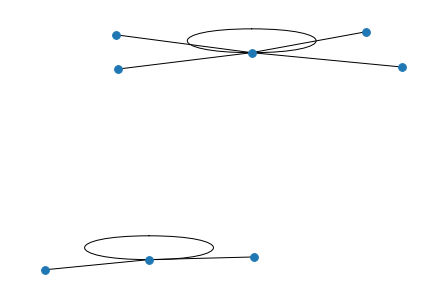

<Figure size 864x864 with 0 Axes>

Year: 1390


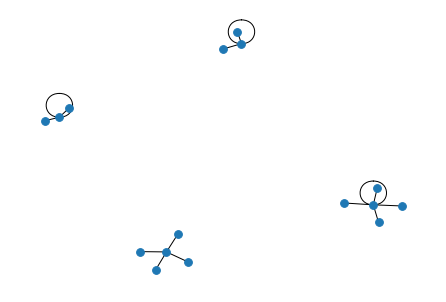

<Figure size 864x864 with 0 Axes>

Year: 1391


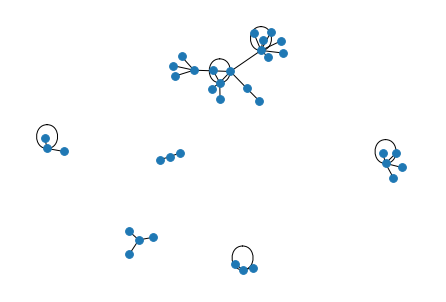

<Figure size 864x864 with 0 Axes>

Year: 1392


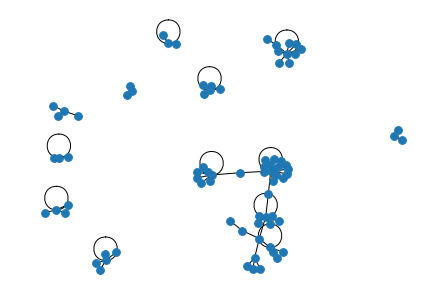

<Figure size 864x864 with 0 Axes>

Year: 1393


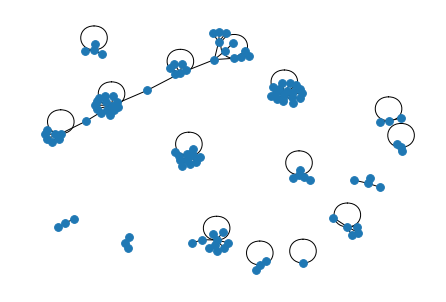

<Figure size 864x864 with 0 Axes>

Year: 1394


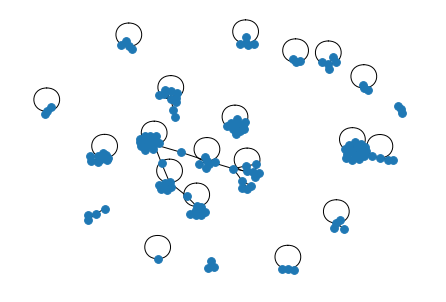

<Figure size 864x864 with 0 Axes>

Year: 1395


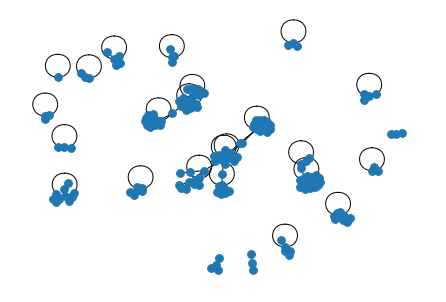

<Figure size 864x864 with 0 Axes>

Year: 1396


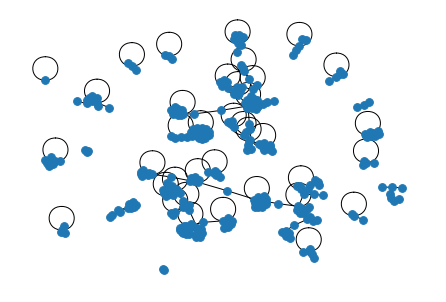

<Figure size 864x864 with 0 Axes>

Year: 1397


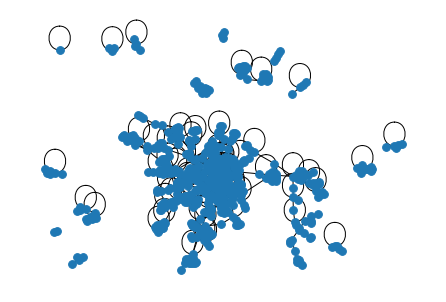

<Figure size 864x864 with 0 Axes>

Year: 1398


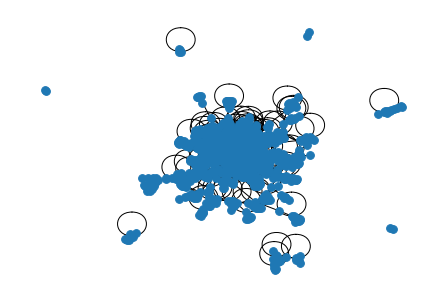

<Figure size 864x864 with 0 Axes>

Year: 1399


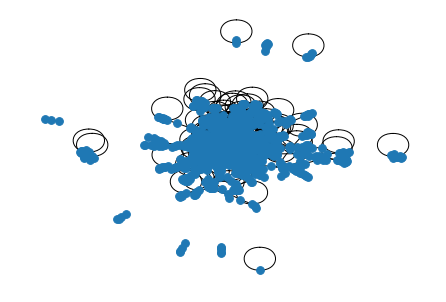

<Figure size 864x864 with 0 Axes>

Year: 1400


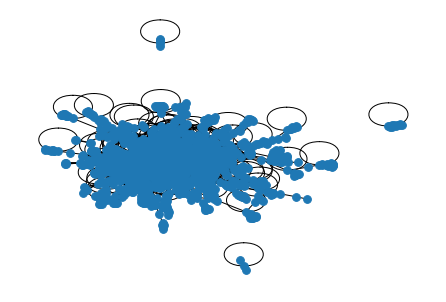

<Figure size 864x864 with 0 Axes>

Year: 1401


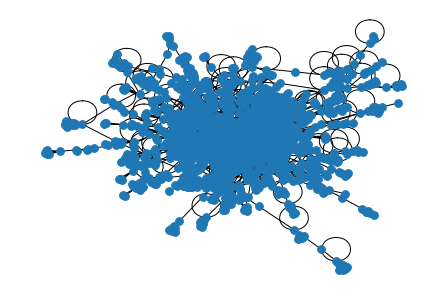

<Figure size 864x864 with 0 Axes>

In [ ]:
for year in YTY_BCC2.keys():
    print("Year:", year)
    plot_graph(YTY_BCC2[year])

Get year to year description

In [ ]:
YTY_description2 = {}
for year in YTY_BCC2.keys():
    des = graph_description(YTY_BCC2[year])
    YTY_description2[year] = des

Plot degree distribution of vertices

Year: 1389


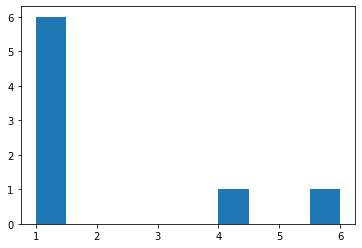

Year: 1390


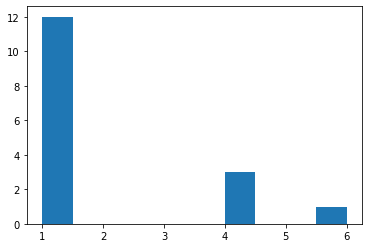

Year: 1391


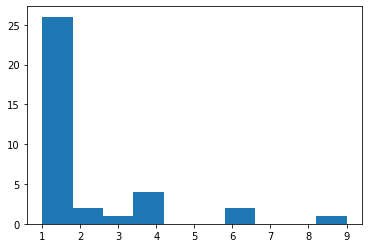

Year: 1392


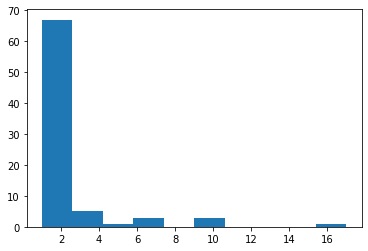

Year: 1393


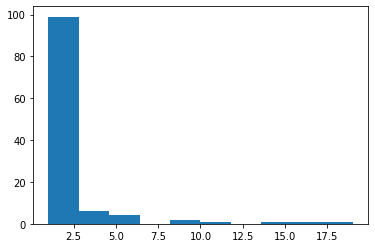

Year: 1394


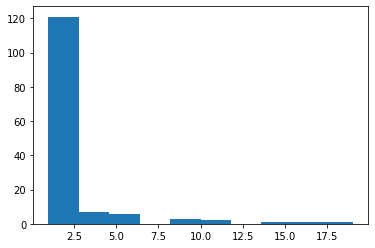

Year: 1395


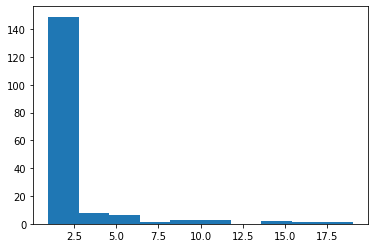

Year: 1396


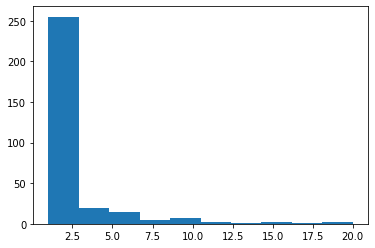

Year: 1397


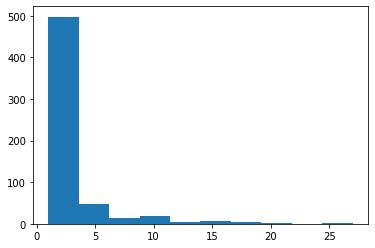

Year: 1398


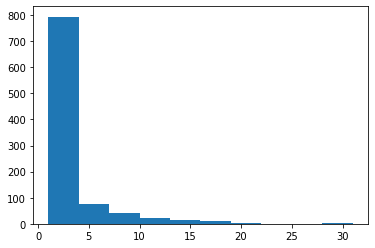

Year: 1399


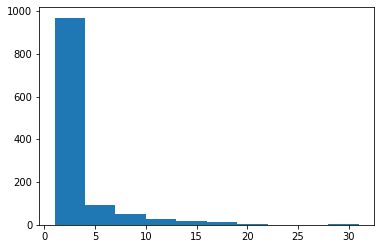

Year: 1400


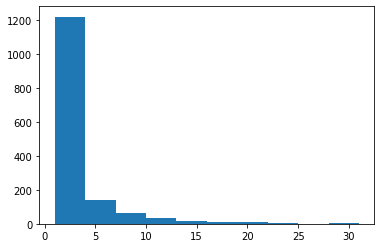

Year: 1401


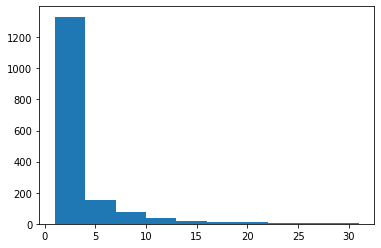

In [ ]:
for year in YTY_description2.keys():
  print("Year:", year)
  plot_distribution(YTY_description2[year]['degree_distribution_of_vertices'])

Number of nodes in each year

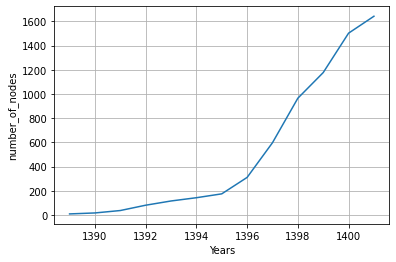

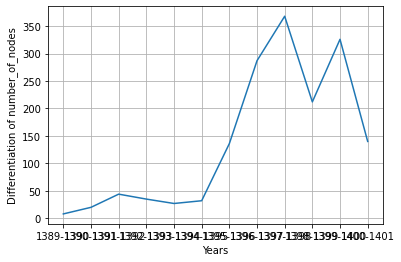

In [ ]:
plot_features_year_to_year(YTY_description2, "number_of_nodes")

Curve fitting for number of nodes

[ 1.73826174e+01 -4.83568651e+04  3.36310960e+07]


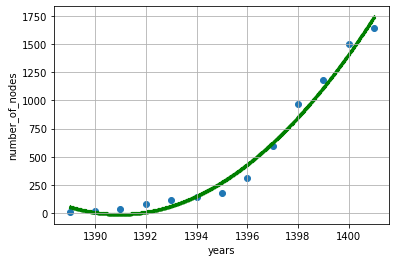

In [ ]:
plot_features_year_to_year_scatter(YTY_description2, 'number_of_nodes')

Number of edges in each year

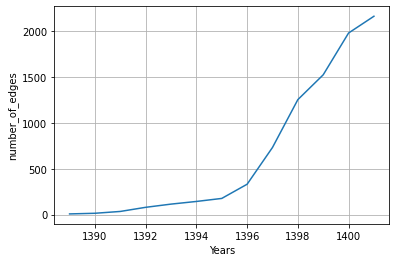

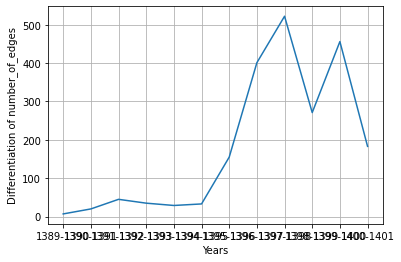

In [ ]:
plot_features_year_to_year(YTY_description2, "number_of_edges")

Curve fitting of number of edges

[ 2.45124875e+01 -6.82047303e+04  4.74440010e+07]


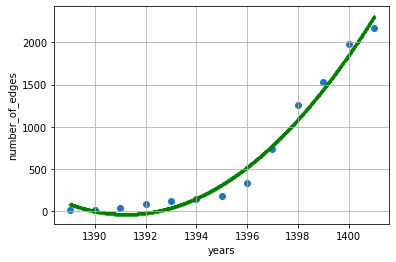

In [ ]:
plot_features_year_to_year_scatter(YTY_description2, 'number_of_edges')

Weights summation in each year

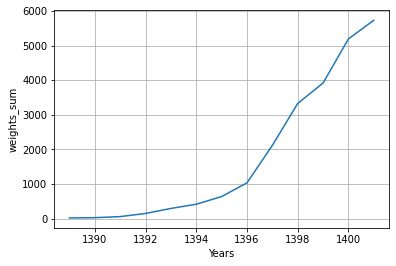

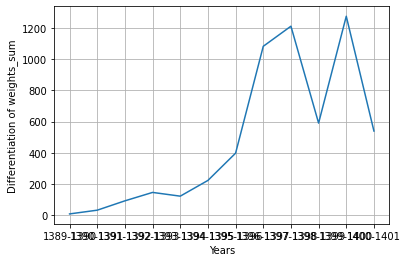

In [ ]:
plot_features_year_to_year(YTY_description2, "weights_sum")

Curve fitting on weights sum

[ 6.13031968e+01 -1.70544859e+05  1.18613428e+08]


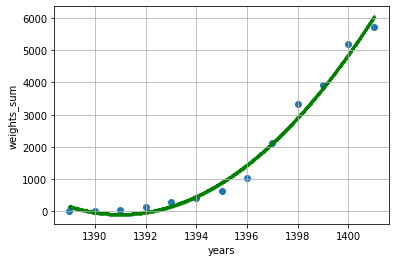

In [ ]:
plot_features_year_to_year_scatter(YTY_description2, 'weights_sum')

Number of connected components in each year

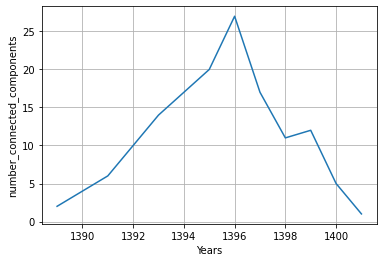

In [ ]:
plot_features_year_to_year(YTY_description2, "number_connected_components")

In [ ]:
plot_features_year_to_year_scatter(YTY_description2, "number_connected_components")

Global efficiency in each year

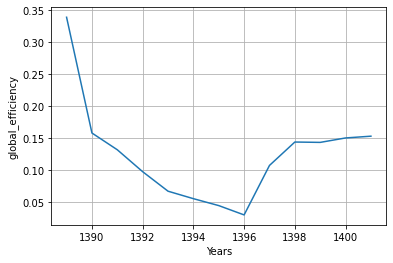

In [ ]:
plot_features_year_to_year(YTY_description2, "global_efficiency")

Local efficiency in each year

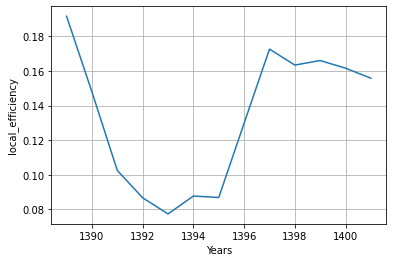

In [ ]:
plot_features_year_to_year(YTY_description2, "local_efficiency")

Tree hierarchy in each year

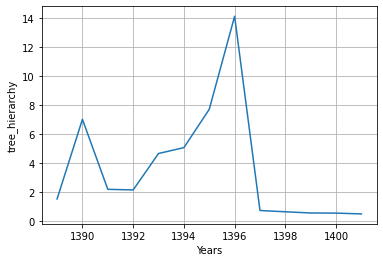

In [ ]:
plot_features_year_to_year(YTY_description2, "tree_hierarchy")

Average Clustering plot

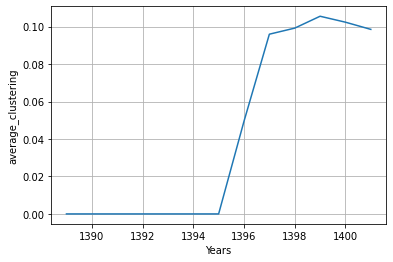

In [ ]:
plot_features_year_to_year(YTY_description2, "average_clustering")

Transitivity plot

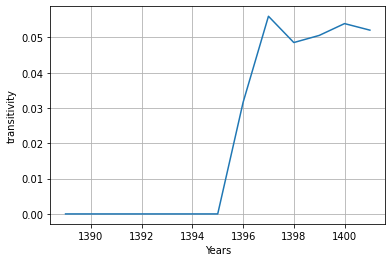

In [ ]:
plot_features_year_to_year(YTY_description2, "transitivity")

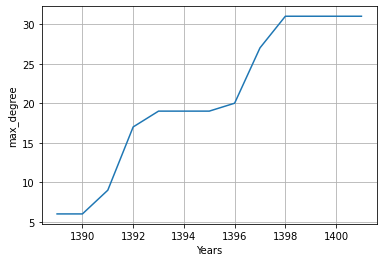

In [ ]:
plot_features_year_to_year(YTY_description2, "max_degree")

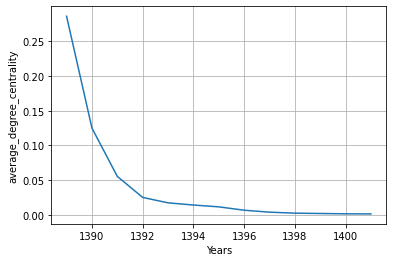

In [ ]:
plot_features_year_to_year(YTY_description2, "average_degree_centrality")

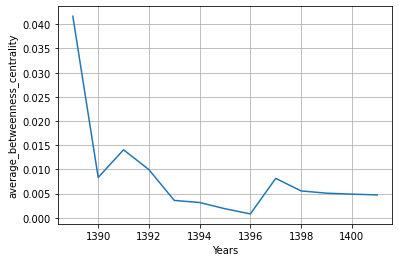

In [ ]:
plot_features_year_to_year(YTY_description2, "average_betweenness_centrality")

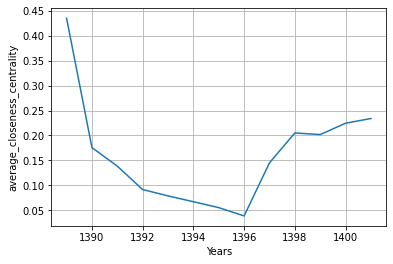

In [ ]:
plot_features_year_to_year(YTY_description2, "average_closeness_centrality")

#### 4D plots for group 1

Questions

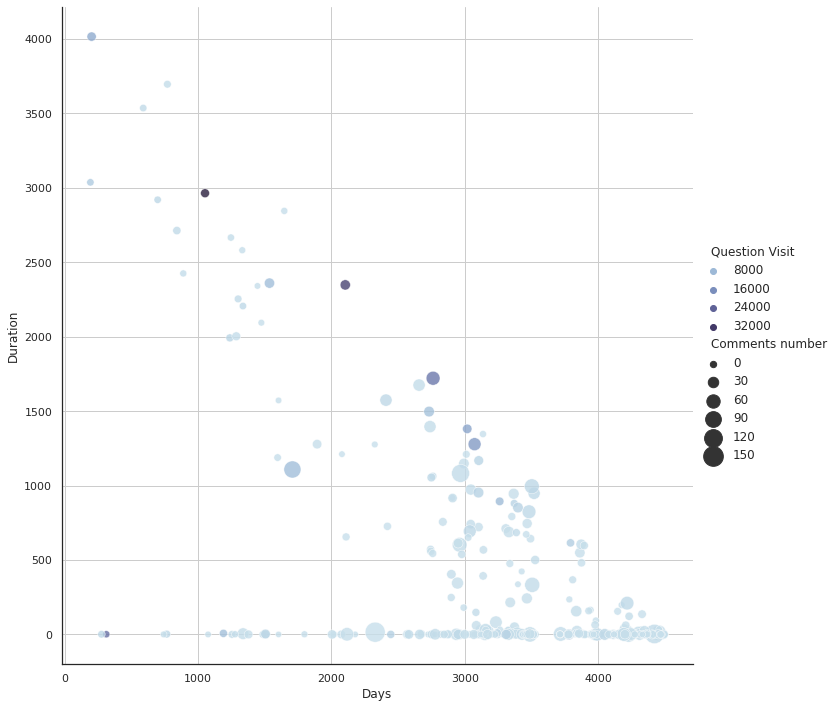

In [ ]:
plot_4D_Questions(graphAnalysis2.get_questions_data_frame())

Users

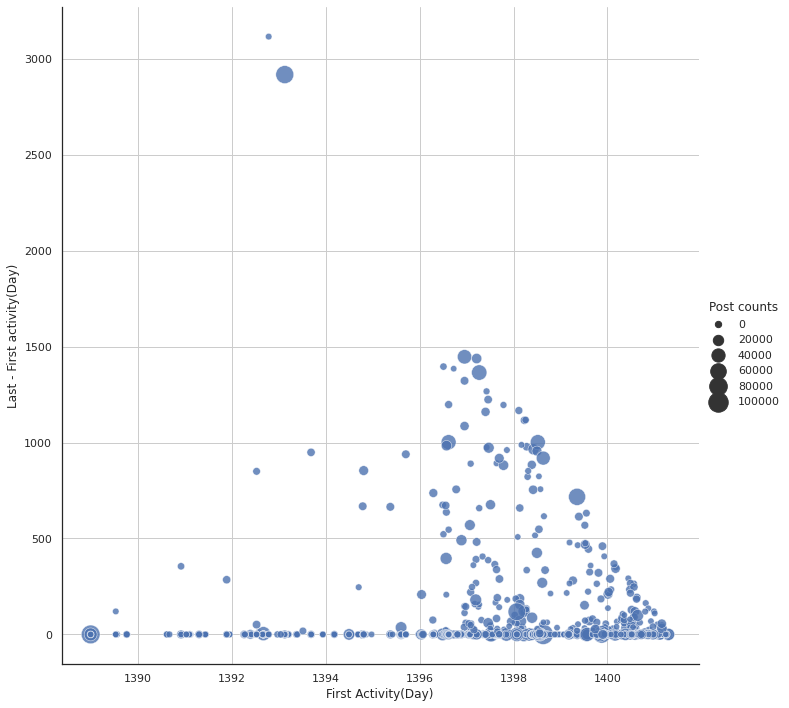

In [ ]:
plot_4D_Users(graphAnalysis2.get_users_data_frame())

### Tree Hierarchy for questions :

This function creates information dictionary for given list of questions

In [ ]:
def get_tree_hierarchy_for_questions(questions: list) -> dict:
  answer = {}
  counter = 0
  for question in questions:
    counter += 1
    try:
      graph = graphAnalysis.get_question_graph(question)
      leaf_num = leaf_number(graph)
      TH = tree_hierarchy(graph)
      answer[question] = (leaf_num, TH)
    except:
      pass
    if counter % 50 == 0:
      print("counter: ", counter)
  return answer

#### Information about group 1:

In [ ]:
questions = graphAnalysis.questions
information = get_tree_hierarchy_for_questions(questions)
information

counter:  50
counter:  100
counter:  150
counter:  200
counter:  250
counter:  300
counter:  350
counter:  400
counter:  450
counter:  500
counter:  550
counter:  600
counter:  650
counter:  700
counter:  750
counter:  800
counter:  850
counter:  900
counter:  950
counter:  1000


{[QID : 3396672, QUserID : 8d8fb2df-17b6-4c1d-b7ed-3f653cce28dc, QTitle : آسپرگر, QDate : 1398-01-01 23:25:00, QVisit : 117]: (2,
  inf),
 [QID : 7495173, QUserID : 4ac7b507-9dfb-4ce1-a709-b3c3b68c7f52, QTitle : ازدواج افراد آسپرگر, QDate : 1400-01-01 23:53:00, QVisit : 1098]: (8,
  0.37037037037037035),
 [QID : 4548682, QUserID : b9da8186-d3fe-446d-adb1-e346bfb583c3, QTitle : سندروم آسپرگر. کسی تجربه داره؟, QDate : 1399-01-01 12:51:00, QVisit : 754]: (2,
  0.5),
 [QID : 6981328, QUserID : d6be199f-478a-4a16-9c0d-613fb02ea2be, QTitle : به نظرتون این آقا سندرم آسپرگر داره؟, QDate : 1400-01-01 01:31:00, QVisit : 724]: (14,
  0.47115384615384615),
 [QID : 4693159, QUserID : 2b20898a-cb74-431c-b30d-6f40195f7792, QTitle : کسی هست بچش آسپرگر باشه؟, QDate : 1399-01-01 17:55:00, QVisit : 376]: (2,
  0.5),
 [QID : 446732, QUserID : 34ddc1c1-8033-46ac-b952-435ad78c6455, QTitle : پسرم آسپرگر تشخیص داده شده, QDate : 1394-01-01 00:35:00, QVisit : 8464]: (13,
  0.5),
 [QID : 5495229, QUserID : 67c6f

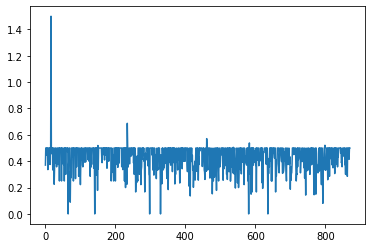

In [ ]:
plot_tree_hierarchy(information)

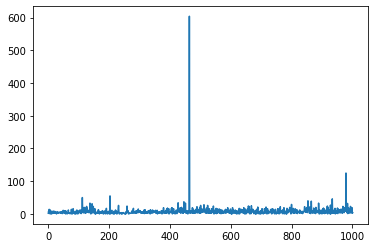

In [ ]:
plot_leaf_numbers(information)

#### For Group 2 :

In [ ]:
questions2 = graphAnalysis2.questions
information2 = get_tree_hierarchy_for_questions(questions2)
information2

counter:  50
counter:  100
counter:  150
counter:  200
counter:  250
counter:  300
counter:  350
counter:  400


{[QID : 1321906, QUserID : 25c2a98f-c55d-4cfc-90b4-c01e87a50c9b, QTitle : امروز تازه شروع کردم به پسرم قرص ریتالین دادم برای بیش فعالی و تمرکزش, QDate : 1396-01-01 08:23:00, QVisit : 536]: (0,
  inf),
 [QID : 1446413, QUserID : 4077fdb4-a552-46fb-adb8-172320087917, QTitle : قرص امگا۳ و بیش فعالی, QDate : 1396-01-01 11:35:00, QVisit : 1431]: (0,
  inf),
 [QID : 1450563, QUserID : 0ce3eed5-b820-4703-ad2c-19d3396680f7, QTitle : کسی اینجا بچش برای درمان بیش فعالی دارو میخوره, QDate : 1396-01-01 18:01:00, QVisit : 158]: (0,
  inf),
 [QID : 1453635, QUserID : 0ce3eed5-b820-4703-ad2c-19d3396680f7, QTitle : داروی بیش فعالی برای بچم شروع کردم, QDate : 1396-01-01 14:46:00, QVisit : 20093]: (0,
  inf),
 [QID : 1660689, QUserID : ba3b9fef-c747-43a1-bf25-a66640702fed, QTitle : بیش فعالی کودک, QDate : 1396-01-01 12:49:00, QVisit : 162]: (0,
  inf),
 [QID : 1678268, QUserID : ba3b9fef-c747-43a1-bf25-a66640702fed, QTitle : بیش فعالی, QDate : 1396-01-01 22:51:00, QVisit : 754]: (0,
  inf),
 [QID : 1705

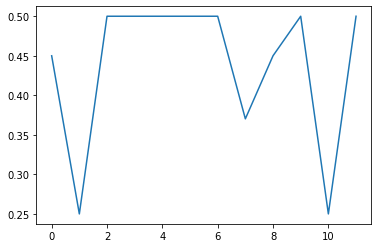

In [ ]:
plot_tree_hierarchy(information2)

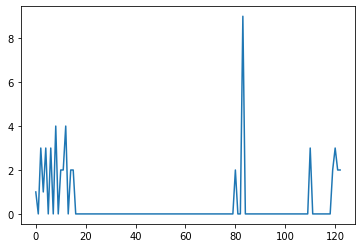

In [ ]:
plot_leaf_numbers(information2)

### Compare two groups:

Compare number of nodes

First group coefficients: [ 7.80034965e+01 -2.17015211e+05  1.50940614e+08]
Second group coefficients: [ 2.07272727e+01 -5.76613437e+04  4.01021253e+07]


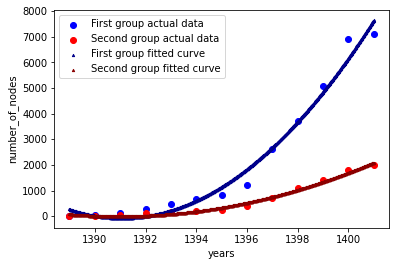

In [ ]:
plot_features_year_to_year_scatter_comparison(year_to_year_description, year_to_year_description2, 'number_of_nodes')

Compare number of edges

First group coefficients: [ 1.76064935e+02 -4.89960213e+05  3.40869573e+08]
Second group coefficients: [ 2.74225774e+01 -7.62995405e+04  5.30732136e+07]


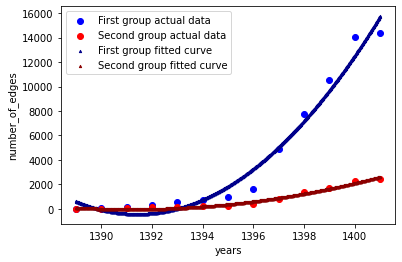

In [ ]:
plot_features_year_to_year_scatter_comparison(year_to_year_description, year_to_year_description2, 'number_of_edges')

Compare weights sum

First group coefficients: [ 4.15965534e+02 -1.15469422e+06  8.01338982e+08]
Second group coefficients: [ 6.75739261e+01 -1.87988820e+05  1.30744872e+08]


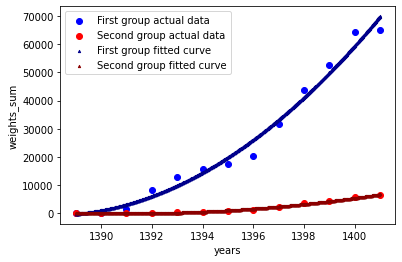

In [ ]:
plot_features_year_to_year_scatter_comparison(year_to_year_description, year_to_year_description2, 'weights_sum')

### Test :


In [ ]:
test = GraphAnalysis("/content/drive/MyDrive/Data_Bases/Group2_Results/Group2_2.db")

In [ ]:
questions_dataframe = test.get_questions_data_frame()

In [ ]:
questions_dataframe

,Days,Duration,Comments number,Question Visit
0,3495,0,5,206
1,3495,0,1,51
2,4029,0,6,106
3,4089,0,8,78
4,4423,0,6,52
...,...,...,...,...
403,1475,2094,2,436
404,3895,597,12,186
405,3928,158,8,102
406,4467,0,7,42


In [ ]:
np.min(questions_dataframe['Comments number'])

0

In [ ]:
np.max(questions_dataframe['Comments number'])

156

In [ ]:
np.min(questions_dataframe['Question Visit'])

13

In [ ]:
np.max(questions_dataframe['Question Visit'])

37887

In [ ]:
hue_colors = {
    'x < 1000' : '#9999ff',
    '1000 <= x < 2000' : '#8080ff',
    '2000 <= x < 3000' : '#6666ff',
    '3000 <= x < 4000' : '#4d4dff',
    '4000 <= x < 5000' : '#3333ff',
    '5000 <= x < 10000' : '#1a1aff',
    '10000 <= x < 15000' : '#0000ff',
    '15000 <= x' : '#0000e6'
}

In [ ]:
def plot_test(data_frame: pd.DataFrame) -> None:
    sns.set_theme(style="white")
    cmap = sns.color_palette("ch:s=.25,rot=-.25", as_cmap=True)
    rel_plot = sns.relplot(x="Days", y="Duration", size="Comments number", hue="Question Visit Group",
                sizes=(20, 400), alpha=.8, palette=hue_colors,
                height=10, data=data_frame, 
                hue_order=['x < 1000', '1000 <= x < 2000', '2000 <= x < 3000', '3000 <= x < 4000', '4000 <= x < 5000', '5000 <= x < 10000', '10000 <= x < 15000', '15000 <= x'])
    plt.grid()
    plt.show()

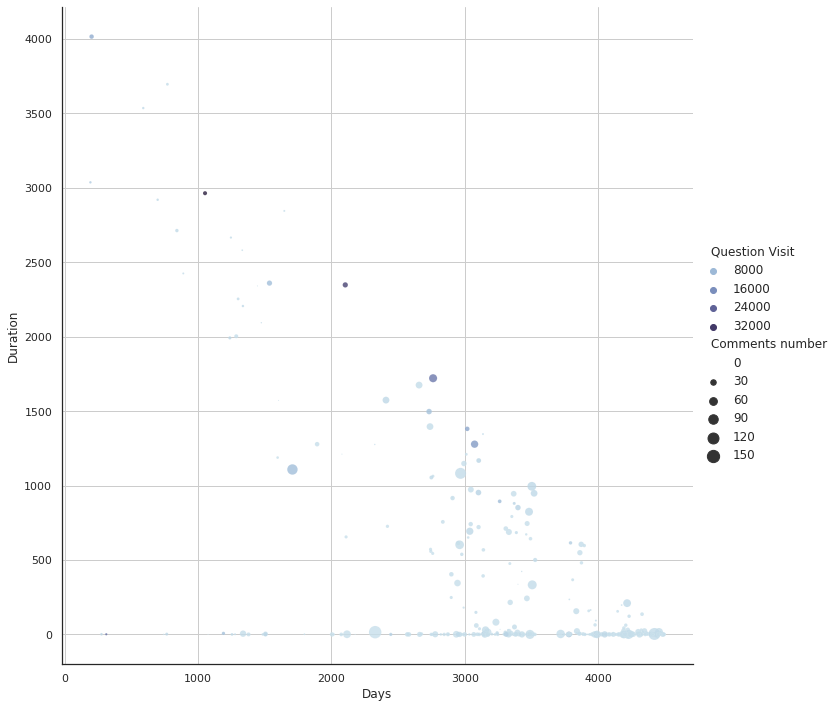

In [ ]:
plot_test(questions_dataframe)

In [ ]:
question_visits = [visit for visit in questions_dataframe['Question Visit']]

(array([394.,   6.,   2.,   2.,   0.,   2.,   0.,   1.,   0.,   1.]),
 array([1.30000e+01, 3.80040e+03, 7.58780e+03, 1.13752e+04, 1.51626e+04,
        1.89500e+04, 2.27374e+04, 2.65248e+04, 3.03122e+04, 3.40996e+04,
        3.78870e+04]),
 <a list of 10 Patch objects>)

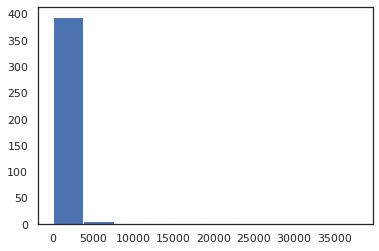

In [ ]:
plt.hist(question_visits)

In [ ]:
q1 = []
q2 = []
q3 = []
q4 = []
for visit in question_visits:
    if visit < 5000:
        q1.append(visit)
    if 5000 <= visit < 10000:
        q2.append(visit)
    if 10000 <= visit < 15000:
        q3.append(visit)
    if 15000 <= visit:
        q4.append(visit)

(array([322.,  34.,  14.,   9.,   7.,   3.,   3.,   1.,   1.,   1.]),
 array([  13. ,  447.3,  881.6, 1315.9, 1750.2, 2184.5, 2618.8, 3053.1,
        3487.4, 3921.7, 4356. ]),
 <a list of 10 Patch objects>)

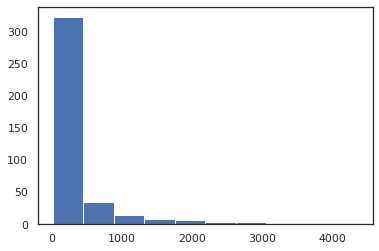

In [ ]:
plt.hist(q1)

(array([1., 0., 2., 1., 0., 0., 0., 0., 1., 1.]),
 array([6252. , 6405.7, 6559.4, 6713.1, 6866.8, 7020.5, 7174.2, 7327.9,
        7481.6, 7635.3, 7789. ]),
 <a list of 10 Patch objects>)

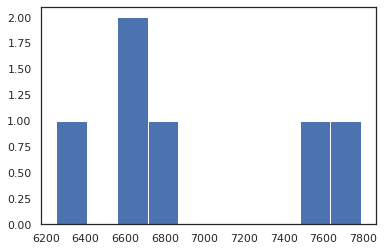

In [ ]:
plt.hist(q2)

(array([1., 0., 0., 0., 1., 0., 0., 0., 0., 1.]),
 array([10730. , 11008.8, 11287.6, 11566.4, 11845.2, 12124. , 12402.8,
        12681.6, 12960.4, 13239.2, 13518. ]),
 <a list of 10 Patch objects>)

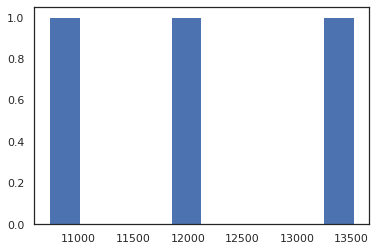

In [ ]:
plt.hist(q3)

(array([2., 0., 0., 0., 0., 1., 0., 0., 0., 1.]),
 array([20093. , 21872.4, 23651.8, 25431.2, 27210.6, 28990. , 30769.4,
        32548.8, 34328.2, 36107.6, 37887. ]),
 <a list of 10 Patch objects>)

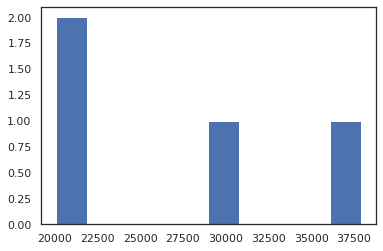

In [ ]:
plt.hist(q4)

In [ ]:
questions = test.questions
start_time = datetime(1389,1,1)
days = []
durations = []
comment_nums = []
post_views = []
post_groups = []
for question in questions:
    if question.QDate.year > 2000:
        continue
    QDate = question.QDate
    day_diff = dateTime_to_int(QDate, start_time)
    days.append(day_diff)
    comments = test.get_comments_by_QID(question.QID)
    comments.sort(key=lambda x: x.CDate)
    post_views.append(question.QVisit)
    if question.QVisit < 1000:
        post_groups.append('x < 1000')
    elif question.QVisit < 2000:
        post_groups.append('1000 <= x < 2000')
    elif question.QVisit < 3000:
        post_groups.append('2000 <= x < 3000')
    elif question.QVisit < 4000:
        post_groups.append("3000 <= x < 4000")
    elif question.QVisit < 5000:
        post_groups.append("4000 <= x < 5000")
    elif question.QVisit < 10000:
        post_groups.append("5000 <= x < 10000")
    elif question.QVisit < 15000:
        post_groups.append("10000 <= x < 15000")
    else:
        post_groups.append("15000 <= x")
    if len(comments) == 0:
        durations.append(0)
        comment_nums.append(0)
    else:
        durations.append(dateTime_to_int(comments[-1].CDate, question.QDate))
        comment_nums.append(len(comments))

d = {'Days': days, 'Duration': durations, 'Comments number': comment_nums, 'Question Visit': post_views, "Question Visit Group": post_groups}
answer  = pd.DataFrame(data=d)

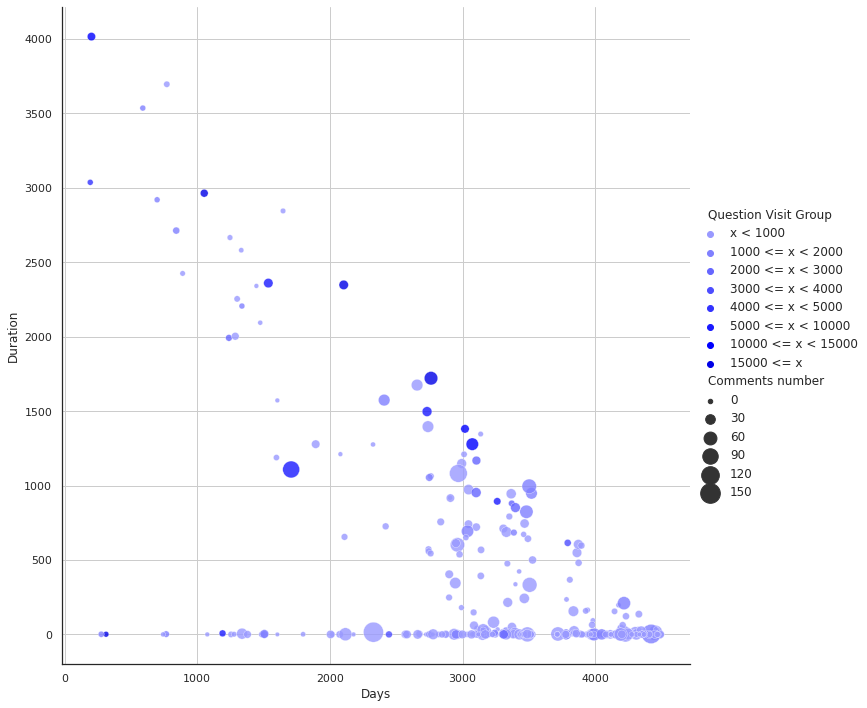

In [ ]:
plot_test(answer)

In [ ]:
test2 = GraphAnalysis("/content/drive/MyDrive/Data_Bases/Group1_Results/PurifiedGroup1/Group1_2_2.db")

In [ ]:
questions_dataframe2 = test2.get_questions_data_frame()

In [ ]:
question_visits = [visit for visit in questions_dataframe2['Question Visit']]

(array([1000.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           1.]),
 array([1.4000000e+01, 1.7363450e+05, 3.4725500e+05, 5.2087550e+05,
        6.9449600e+05, 8.6811650e+05, 1.0417370e+06, 1.2153575e+06,
        1.3889780e+06, 1.5625985e+06, 1.7362190e+06]),
 <a list of 10 Patch objects>)

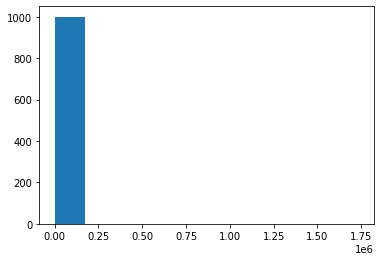

In [ ]:
plt.hist(question_visits)

In [ ]:
q1 = []
q2 = []
q3 = []
q4 = []
for visit in question_visits:
    if visit < 5000:
        q1.append(visit)
    if 5000 <= visit < 10000:
        q2.append(visit)
    if 10000 <= visit < 15000:
        q3.append(visit)
    if 15000 <= visit:
        q4.append(visit)

(array([699., 133.,  58.,  25.,  11.,  17.,  13.,   3.,   2.,   6.]),
 array([  14. ,  508.7, 1003.4, 1498.1, 1992.8, 2487.5, 2982.2, 3476.9,
        3971.6, 4466.3, 4961. ]),
 <a list of 10 Patch objects>)

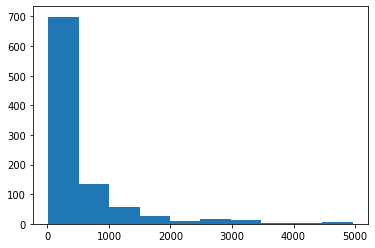

In [ ]:
plt.hist(q1)

(array([4., 4., 1., 1., 2., 1., 1., 1., 0., 3.]),
 array([5320. , 5786.5, 6253. , 6719.5, 7186. , 7652.5, 8119. , 8585.5,
        9052. , 9518.5, 9985. ]),
 <a list of 10 Patch objects>)

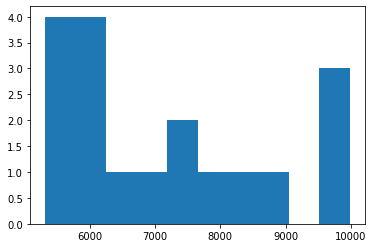

In [ ]:
plt.hist(q2)

(array([1., 1., 1., 0., 0., 0., 0., 0., 0., 1.]),
 array([10353., 10770., 11187., 11604., 12021., 12438., 12855., 13272.,
        13689., 14106., 14523.]),
 <a list of 10 Patch objects>)

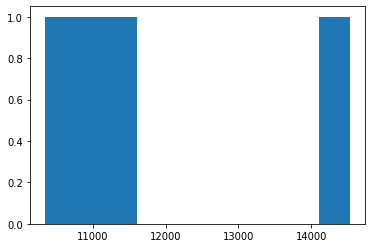

In [ ]:
plt.hist(q3)

(array([11.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([  15014. ,  187134.5,  359255. ,  531375.5,  703496. ,  875616.5,
        1047737. , 1219857.5, 1391978. , 1564098.5, 1736219. ]),
 <a list of 10 Patch objects>)

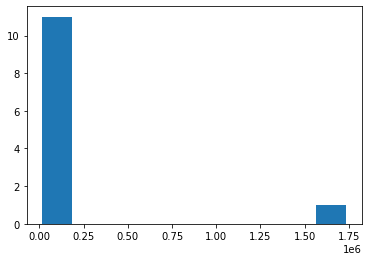

In [ ]:
plt.hist(q4)

In [ ]:
questions = test2.questions
start_time = datetime(1389,1,1)
days = []
durations = []
comment_nums = []
post_views = []
post_groups = []
for question in questions:
    if question.QDate.year > 2000:
        continue
    QDate = question.QDate
    day_diff = dateTime_to_int(QDate, start_time)
    days.append(day_diff)
    comments = test2.get_comments_by_QID(question.QID)
    comments.sort(key=lambda x: x.CDate)
    post_views.append(question.QVisit)
    if question.QVisit < 1000:
        post_groups.append('x < 1000')
    elif question.QVisit < 2000:
        post_groups.append('1000 <= x < 2000')
    elif question.QVisit < 3000:
        post_groups.append('2000 <= x < 3000')
    elif question.QVisit < 4000:
        post_groups.append("3000 <= x < 4000")
    elif question.QVisit < 5000:
        post_groups.append("4000 <= x < 5000")
    elif question.QVisit < 10000:
        post_groups.append("5000 <= x < 10000")
    elif question.QVisit < 15000:
        post_groups.append("10000 <= x < 15000")
    else:
        post_groups.append("15000 <= x")
    if len(comments) == 0:
        durations.append(0)
        comment_nums.append(0)
    else:
        durations.append(dateTime_to_int(comments[-1].CDate, question.QDate))
        comment_nums.append(len(comments))

d = {'Days': days, 'Duration': durations, 'Comments number': comment_nums, 'Question Visit': post_views, "Question Visit Group": post_groups}
answer  = pd.DataFrame(data=d)

In [ ]:
plot_test2(answer)

ValueError: ignored

In [ ]:
def plot_test2(data_frame: pd.DataFrame) -> None:
    sns.set_theme(style="white")
    cmap = sns.color_palette("ch:s=.25,rot=-.25", as_cmap=True)
    rel_plot = sns.relplot(x="Days", y="Duration", size="Comments number", hue="Question Visit Group",
                sizes=[3,6,9,12,15,18], alpha=.8, palette=hue_colors,
                height=10, data=data_frame, 
                hue_order=['x < 1000', '1000 <= x < 2000', '2000 <= x < 3000', '3000 <= x < 4000', '4000 <= x < 5000', '5000 <= x < 10000', '10000 <= x < 15000', '15000 <= x'])
    plt.grid()
    plt.show()

### New plots:

First group coefficients: [ 7.80034965e+01 -2.17015211e+05  1.50940613e+08]
Second group coefficients: [ 2.07272727e+01 -5.76613437e+04  4.01021243e+07]


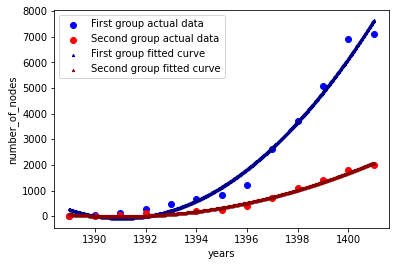

In [ ]:
plot_features_year_to_year_scatter_comparison(year_to_year_description, year_to_year_description2, 'number_of_nodes')

First group coefficients: [ 1.76064935e+02 -4.89960213e+05  3.40869573e+08]
Second group coefficients: [ 2.74225774e+01 -7.62995405e+04  5.30732136e+07]


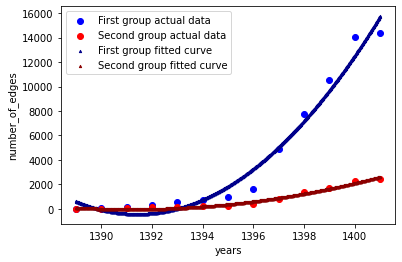

In [ ]:
plot_features_year_to_year_scatter_comparison(year_to_year_description, year_to_year_description2, 'number_of_edges')

In [ ]:
def plot_features_year_to_year_scatter_full_comparison(year_description1: dict, year_description2:dict, feature_name: str) -> None:
    years1 = [year for year in year_description1.keys()]
    years2 = [year for year in year_description2.keys()]
    features = ['number_of_nodes', "number_of_edges"]
    plt.rcParams["figure.figsize"] = [8, 8]
    plt.rcParams['figure.autolayout'] = True
    k = 0
    plt.grid()
    shapes = ['o', '2']
    features1 = [year_description1[year][feature_name] for year in years1]
    features2 = [year_description2[year][feature_name] for year in years2]
    plt.scatter(years1, features1, c='b',marker=shapes[k])
    plt.scatter(years2, features2, c='r', marker=shapes[k])
    k += 1
    coef1 = np.polyfit(years1, features1, 2)
    coef2 = np.polyfit(years2, features2, 2)
    print("First group coefficients:",coef1)
    print("Second group coefficients:", coef2)
    new_x1 = np.linspace(min(years1), max(years1), num=np.size(years1) * 100)
    new_line1 = np.polyval(coef1, new_x1)
    new_x2 = np.linspace(min(years2), max(years2), num=np.size(years2) * 100)
    new_line2 = np.polyval(coef2, new_x2)
    plt.scatter(new_x1,new_line1,c='b', marker='.', s=5)
    plt.scatter(new_x2, new_line2, c="r", marker='.', s=5)
    plt.xlabel("years")
    plt.ylabel(feature_name)
    plt.legend(['First group actual data for number of nodes','Second group actual data for number of nodes', 'First group fitted curve for number of nodes', 'Second group fitted curve number of nodes','First group actual data for number of edges','Second group actual data for number of edges', 'First group fitted curve for number of edges', 'Second group fitted curve number of edges'])
    # plt.legend(loc=2, prop={'size':6})
    plt.savefig(feature_name + '.svg')
    plt.show()

First group coefficients: [ 7.80034965e+01 -2.17015211e+05  1.50940613e+08]
Second group coefficients: [ 2.07272727e+01 -5.76613437e+04  4.01021243e+07]


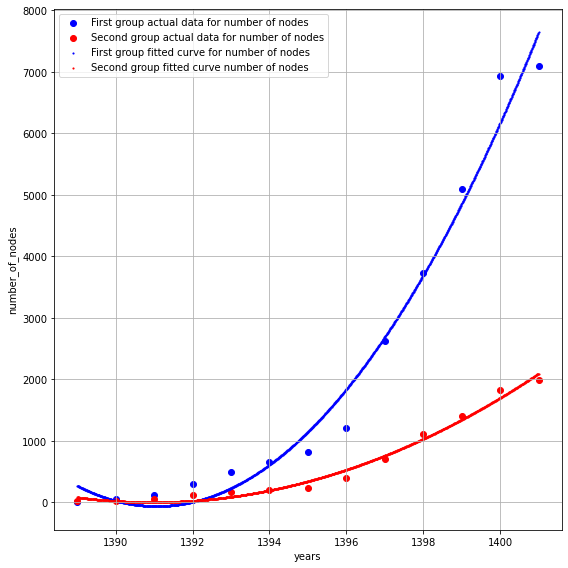

In [ ]:
plot_features_year_to_year_scatter_full_comparison(year_to_year_description, year_to_year_description2, 'number_of_nodes')

First group coefficients: [ 1.76064935e+02 -4.89960213e+05  3.40869573e+08]
Second group coefficients: [ 2.74225774e+01 -7.62995405e+04  5.30732136e+07]


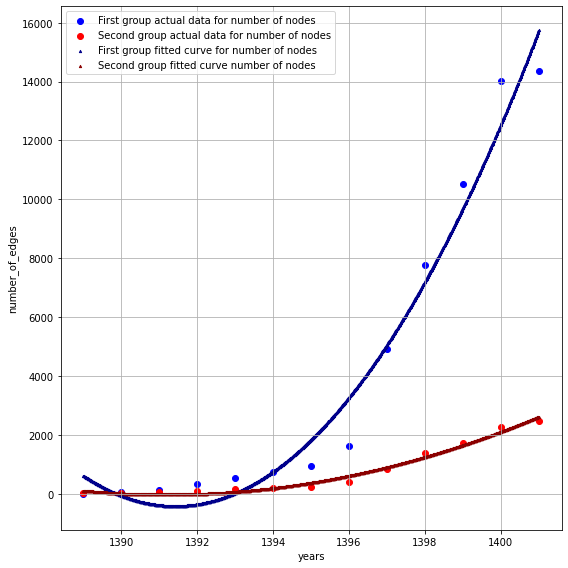

In [ ]:
plot_features_year_to_year_scatter_full_comparison(year_to_year_description, year_to_year_description2, 'number_of_edges')

In [ ]:
def plot_features_year_to_year_scatter_full_comparison_centrality(year_description1: dict, year_description2:dict, feature_name: str) -> None:
    years1 = [year for year in year_description1.keys()]
    years2 = [year for year in year_description2.keys()]
    features = ['number_of_nodes', "number_of_edges"]
    plt.rcParams["figure.figsize"] = [8, 8]
    plt.rcParams['figure.autolayout'] = True
    k = 0
    plt.grid()
    shapes = ['o', '2']
    dict1 = [year_description1[year][feature_name] for year in years1]
    dict2 = [year_description2[year][feature_name] for year in years2]
    features1 = []
    features2 = []
    for i in range(len(dict1)):
      answer1 = 0
      n1 = 0
      answer2 = 0
      n2 = 0
      for key in dict1[i].keys():
        answer1 += dict1[i][key]
        n1 += 1
      features1.append(answer1 / n1)
      for key in dict2[i].keys():
        answer2 += dict2[i][key]
        n2 += 1
      features2.append(answer2 / n2)
      
    plt.scatter(years1, features1, c='b',marker=shapes[k])
    plt.scatter(years2, features2, c='r', marker=shapes[k])
    k += 1
    coef1 = np.polyfit(years1, features1, 2)
    coef2 = np.polyfit(years2, features2, 2)
    print("First group coefficients:",coef1)
    print("Second group coefficients:", coef2)
    new_x1 = np.linspace(min(years1), max(years1), num=np.size(years1) * 100)
    new_line1 = np.polyval(coef1, new_x1)
    new_x2 = np.linspace(min(years2), max(years2), num=np.size(years2) * 100)
    new_line2 = np.polyval(coef2, new_x2)
    plt.scatter(new_x1,new_line1,c='darkblue', marker='^', s=5)
    plt.scatter(new_x2, new_line2, c="darkred", marker='^', s=5)
    plt.xlabel("years")
    plt.ylabel(feature_name)
    plt.legend(['First group actual data for number of nodes','Second group actual data for number of nodes', 'First group fitted curve for number of nodes', 'Second group fitted curve number of nodes','First group actual data for number of edges','Second group actual data for number of edges', 'First group fitted curve for number of edges', 'Second group fitted curve number of edges'])
    # plt.legend(loc=2, prop={'size':6})
    plt.savefig(feature_name + '.svg')
    plt.show()

First group coefficients: [ 2.10895003e-03 -5.89149872e+00  4.11456198e+03]
Second group coefficients: [ 2.12956606e-03 -5.95073786e+00  4.15708885e+03]


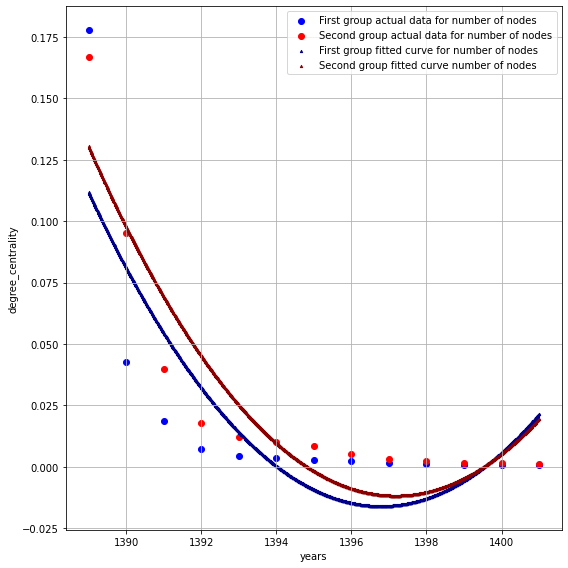

In [ ]:
plot_features_year_to_year_scatter_full_comparison_centrality(year_to_year_description, year_to_year_description2, 'degree_centrality')

First group coefficients: [ 4.38645071e-04 -1.22580235e+00  8.56380610e+02]
Second group coefficients: [ 1.81973002e-04 -5.08203275e-01  3.54820873e+02]


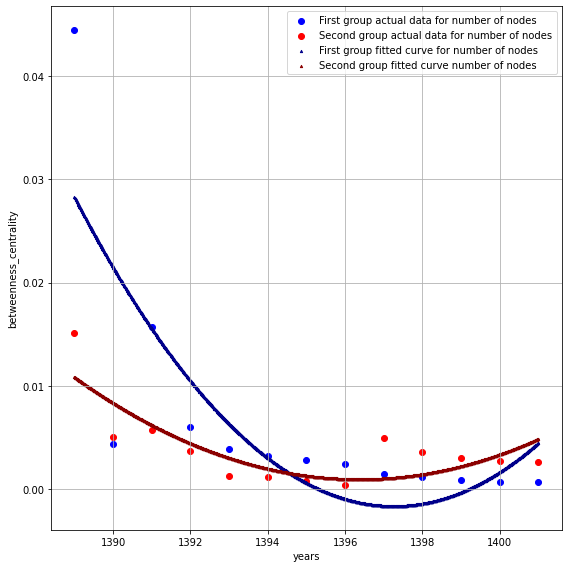

In [ ]:
plot_features_year_to_year_scatter_full_comparison_centrality(year_to_year_description, year_to_year_description2, 'betweenness_centrality')

First group coefficients: [-5.97466064e-03  1.66876285e+01 -1.16516943e+04]
Second group coefficients: [ 4.41065511e-03 -1.23049445e+01  8.58219842e+03]


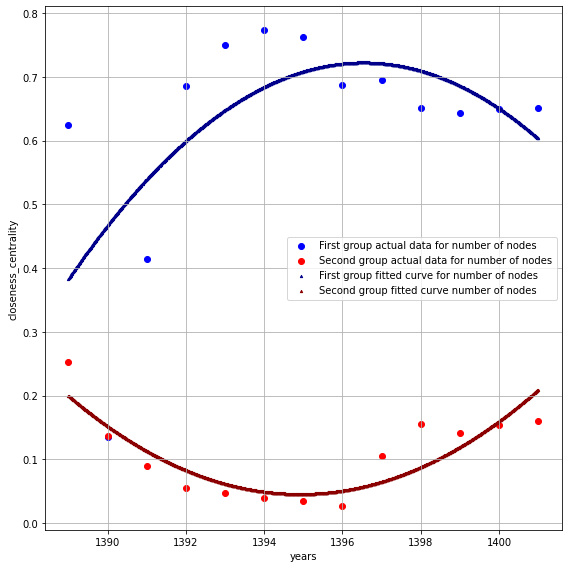

In [ ]:
plot_features_year_to_year_scatter_full_comparison_centrality(year_to_year_description, year_to_year_description2, 'closeness_centrality')

In [ ]:
def plot_features_year_to_year_scatter_full_comparison_centrality2(year_description1: dict, year_description2:dict, feature_name: str) -> None:
    years1 = [year for year in year_description1.keys()]
    years2 = [year for year in year_description2.keys()]
    features = ['number_of_nodes', "number_of_edges"]
    plt.rcParams["figure.figsize"] = [8, 8]
    plt.rcParams['figure.autolayout'] = True
    k = 0
    plt.grid()
    shapes = ['o', '2']
    dict1 = [year_description1[year][feature_name] for year in years1]
    dict2 = [year_description2[year][feature_name] for year in years2]
    features1 = []
    features2 = []
    for i in range(len(dict1)):
      answer1 = 0
      n1 = 0
      answer2 = 0
      n2 = 0
      for key in dict1[i].keys():
        answer1 += dict1[i][key]
        n1 += 1
      features1.append(answer1 / n1)
      for key in dict2[i].keys():
        answer2 += dict2[i][key]
        n2 += 1
      features2.append(answer2 / n2)
      
    plt.plot(years1, features1, c='b',marker=shapes[k])
    plt.plot(years2, features2, c='r', marker=shapes[k])
    k += 1
    plt.xlabel("years")
    plt.ylabel(feature_name)
    correct_feature_name = feature_name.split('_')
    correct_feature_name = ' '.join(correct_feature_name)
    plt.legend(['First group actual data for ' + correct_feature_name,'Second group actual data for ' + correct_feature_name])
    # plt.legend(loc=2, prop={'size':6})
    plt.savefig(feature_name + '.svg')
    plt.show()

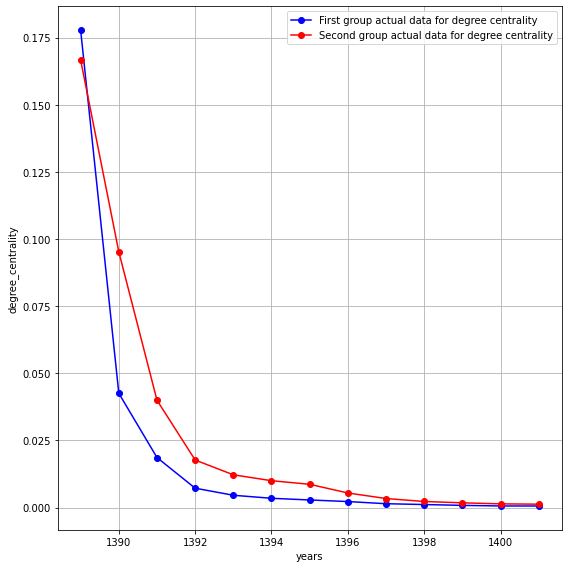

In [ ]:
plot_features_year_to_year_scatter_full_comparison_centrality2(year_to_year_description, year_to_year_description2, 'degree_centrality')

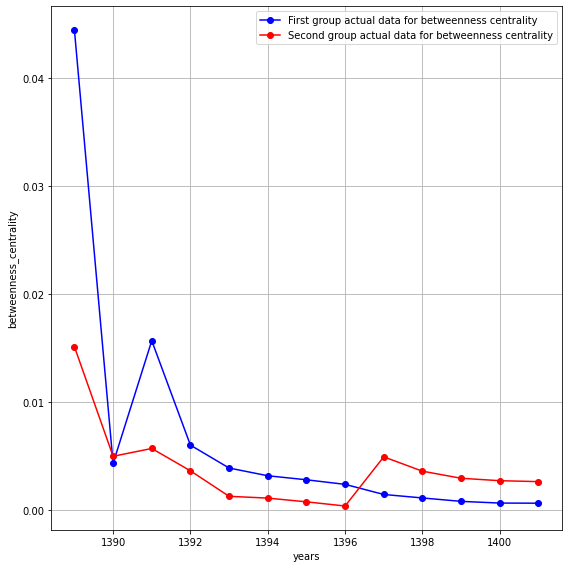

In [ ]:
plot_features_year_to_year_scatter_full_comparison_centrality2(year_to_year_description, year_to_year_description2, 'betweenness_centrality')

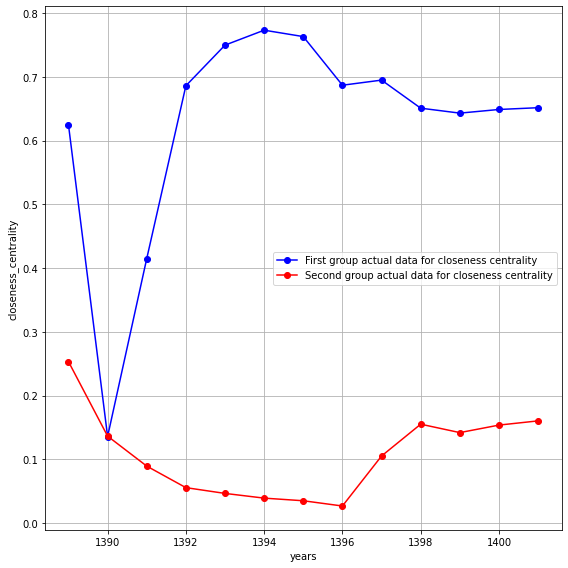

In [ ]:
plot_features_year_to_year_scatter_full_comparison_centrality2(year_to_year_description, year_to_year_description2, 'closeness_centrality')

In [ ]:
def plot_features_comparison(year_description1: dict, year_description2: dict, feature_name:str) -> None:
  years = [year for year in year_description1.keys()]
  features1 = [year_description1[year][feature_name] for year in years]
  features2 = [year_description2[year][feature_name] for year in years]
  plt.plot(years, features1, c='b')
  plt.plot(years, features2, c='r')
  plt.grid()
  plt.legend([feature_name + ' in first group', feature_name + 'in second group'])
  plt.xlabel('Years')
  plt.ylabel(feature_name)
  plt.show()

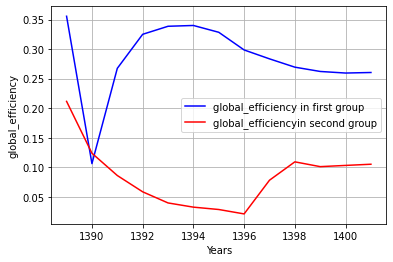

In [ ]:
plot_features_comparison(year_to_year_description, year_to_year_description2, 'global_efficiency')

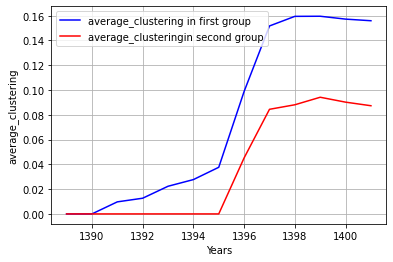

In [ ]:
plot_features_comparison(year_to_year_description, year_to_year_description2, 'average_clustering')

In [ ]:
def plot_features_year_to_year_scatter_full_comparison_two_axis(year_description1: dict, year_description2:dict) -> None:
    years1 = [year for year in year_description1.keys()]
    years2 = [year for year in year_description2.keys()]
    features = ['number_of_nodes', "number_of_edges"]
    plt.rcParams["figure.figsize"] = [8.0, 8.0]
    plt.rcParams['figure.autolayout'] = True
    k = 0
    shapes = ['o', '2']
    ax1 = plt.subplot()
    ax2 = ax1.twinx()
    for feature_name in features:
      features1 = [year_description1[year][feature_name] for year in years1]
      features2 = [year_description2[year][feature_name] for year in years2]
      if k == 0:
        l11= ax1.scatter(years1, features1, c='#0066ff',marker=shapes[k])
        l12= ax1.scatter(years2, features2, c='#ff5c33', marker=shapes[k])
      else:
        l21= ax2.scatter(years1, features1, c='b',marker=shapes[k])
        l22= ax2.scatter(years2, features2, c='r', marker=shapes[k])
      coef1 = np.polyfit(years1, features1, 2)
      coef2 = np.polyfit(years2, features2, 2)
      print("First group coefficients:",coef1)
      print("Second group coefficients:", coef2)
      new_x1 = np.linspace(min(years1), max(years1), num=np.size(years1) * 100)
      new_line1 = np.polyval(coef1, new_x1)
      new_x2 = np.linspace(min(years2), max(years2), num=np.size(years2) * 100)
      new_line2 = np.polyval(coef2, new_x2)
      if k == 0:
        l13= ax1.scatter(new_x1,new_line1,c='#0066ff', marker='^', s=5)
        l14= ax1.scatter(new_x2, new_line2, c="#ff5c33", marker='p', s=5)
      else:
        l23= ax2.scatter(new_x1,new_line1,c='darkblue', marker='^', s=5)
        l24= ax2.scatter(new_x2, new_line2, c="darkred", marker='p', s=5)
      k += 1
    ax1.set_xlabel("years")
    ax1.set_ylabel("Number of Nodes")
    ax2.set_ylabel("Number of Edges")
    plt.legend([l11, l12, l13, l14, l21, l22, l23, l24], ['First group actual data for number of nodes','Second group actual data for number of nodes', 'First group fitted curve for number of nodes', 'Second group fitted curve number of nodes','First group actual data for number of edges','Second group actual data for number of edges', 'First group fitted curve for number of edges', 'Second group fitted curve number of edges'])
    # plt.legend(prop={'size':6})
    plt.savefig("Nodes-Edges.svg")
    plt.show()

In [ ]:
def plot_features_comparison_two_axis(year_description1: dict, year_description2: dict) -> None:
  years = [year for year in year_description1.keys()]
  plt.rcParams["figure.figsize"] = [8, 8]
  plt.rcParams['figure.autolayout'] = True
  ax1 = plt.subplot()
  ax2 = ax1.twinx()
  features_names = ["global_efficiency", "average_clustering"]
  k = 0
  for feature_name in features_names:
    features1 = [year_description1[year][feature_name] for year in years]
    features2 = [year_description2[year][feature_name] for year in years]
    if k == 0:
      l11, = ax1.plot(years, features1, c='b')
      l12, = ax1.plot(years, features2, c='r')
    else:
      l21, =ax2.plot(years, features1, c='#0066ff')
      l22, =ax2.plot(years, features2, c='#ff5c33')
    k += 1
  
  ax1.set_xlabel('Years')
  ax1.set_ylabel("Global Efficiency")
  ax2.set_ylabel("Average Clustering")
  plt.legend([l11, l12, l21, l22], ["First group global efficiency", "Second group global efficiency", "First group average clustering", "Second group average clustering"], fontsize=8, loc=4)
  plt.savefig("Global-Average.svg")
  plt.show()

First group coefficients: [ 7.80034965e+01 -2.17015211e+05  1.50940613e+08]
Second group coefficients: [ 2.07272727e+01 -5.76613437e+04  4.01021243e+07]
First group coefficients: [ 1.76064935e+02 -4.89960213e+05  3.40869573e+08]
Second group coefficients: [ 2.74225774e+01 -7.62995405e+04  5.30732136e+07]


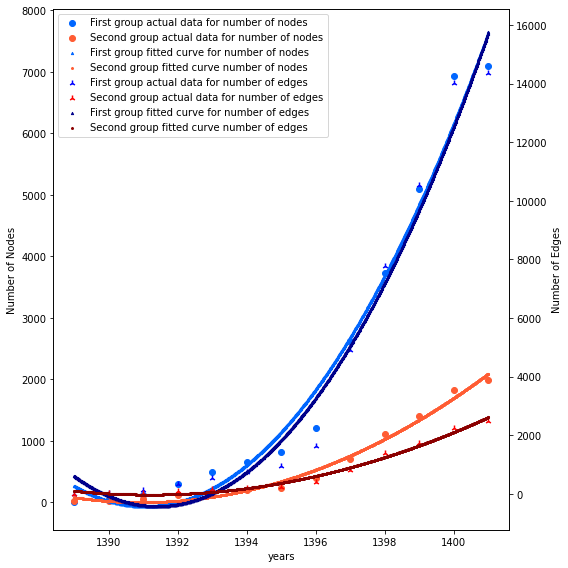

In [ ]:
plot_features_year_to_year_scatter_full_comparison_two_axis(year_to_year_description, year_to_year_description2)

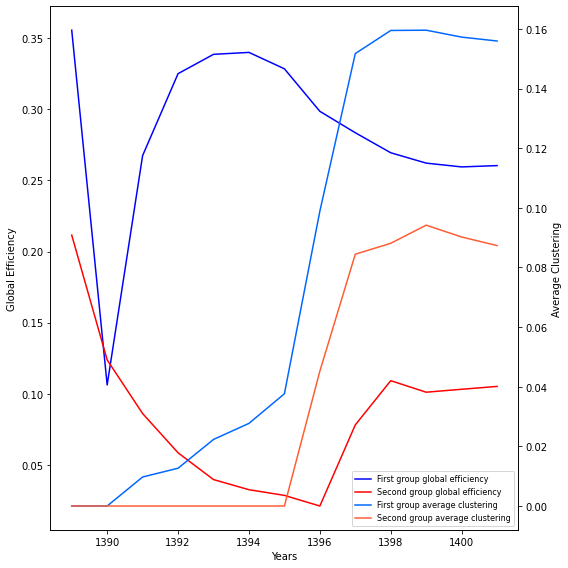

In [ ]:
plot_features_comparison_two_axis(year_to_year_description, year_to_year_description2)

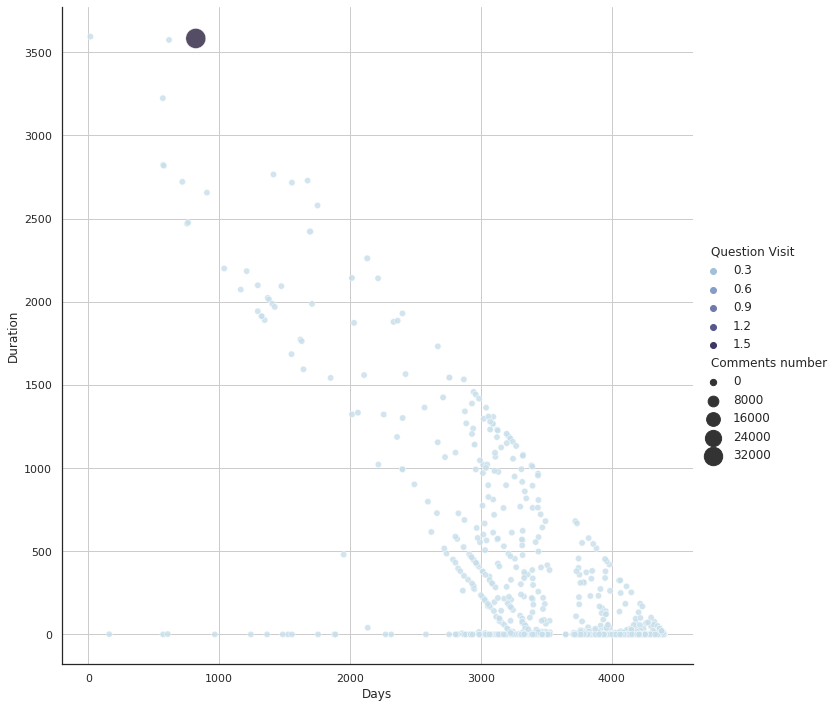

In [ ]:
plot_4D_Questions(graphAnalysis.get_questions_data_frame())

In [ ]:
data_frame1 = graphAnalysis.get_questions_data_frame()

In [ ]:
data_frame1

,Days,Duration,Comments number,Question Visit
0,3490,183,1,117
1,4225,1,45,1098
2,3737,0,11,754
3,4147,0,43,724
4,3762,0,17,376
...,...,...,...,...
996,3905,0,9,144
997,4210,0,33,323
998,3395,1009,44,520
999,4076,0,13,80


In [ ]:
data_frame1["Question Visit"]

0        117
1       1098
2        754
3        724
4        376
        ... 
996      144
997      323
998      520
999       80
1000     136
Name: Question Visit, Length: 1001, dtype: int64

In [ ]:
data_frame1["Question Visit"] = np.log(data_frame1["Question Visit"])
for i in range(len(data_frame1["Comments number"])):
  if data_frame1["Comments number"][i] != 0:
    data_frame1["Comments number"][i] = np.log(data_frame1["Comments number"][i])

<ipython-input-71-9626a9a96b7b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame1["Comments number"][i] = np.log(data_frame1["Comments number"][i])


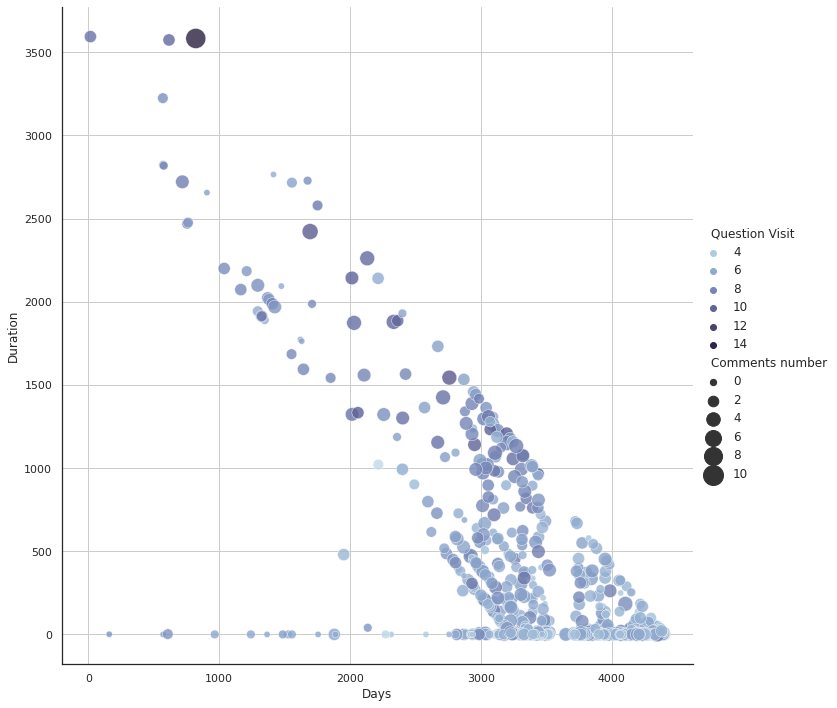

In [ ]:
plot_4D_Questions(data_frame1)

In [ ]:
data_frame2 = graphAnalysis2.get_questions_data_frame()

In [ ]:
data_frame2

,Days,Duration,Comments number,Question Visit
0,3495,0,5,206
1,3495,0,1,51
2,4029,0,6,106
3,4089,0,8,78
4,4423,0,6,52
...,...,...,...,...
403,1475,2094,2,436
404,3895,597,12,186
405,3928,158,8,102
406,4467,0,7,42


In [ ]:
data_frame2["Question Visit"] = np.log(data_frame2["Question Visit"])
for i in range(len(data_frame2["Comments number"])):
  if data_frame2["Comments number"][i] != 0:
    data_frame2["Comments number"][i] = np.log(data_frame2["Comments number"][i])

<ipython-input-76-4ae2f6a216ff>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame2["Comments number"][i] = np.log(data_frame2["Comments number"][i])


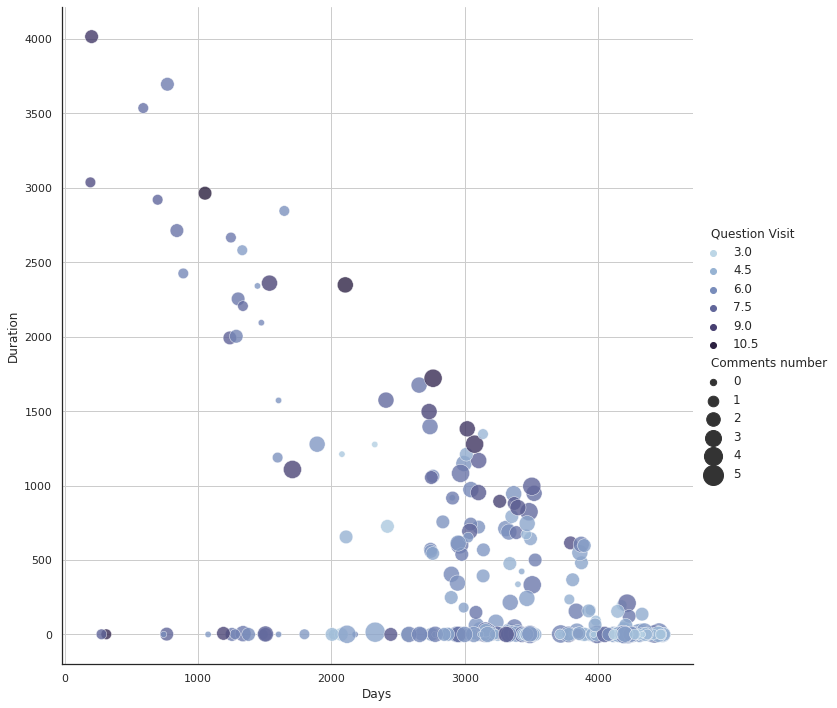

In [ ]:
plot_4D_Questions(data_frame2)

In [ ]:
data_frame1 = graphAnalysis.get_users_data_frame()

In [ ]:
data_frame1

,First Activity(Day),Last - First activity(Day),Post counts
0,0,0,2
1,0,0,4970
2,0,0,6320
3,0,0,8052
4,0,0,6174
...,...,...,...
7213,4065,0,6982
7214,0,0,131
7215,0,0,1684
7216,0,0,1600


In [ ]:
for i in range(len(data_frame1["Post counts"])):
  if data_frame1["Post counts"][i] != 0:
    data_frame1["Post counts"][i] = np.log(data_frame1["Post counts"][i])

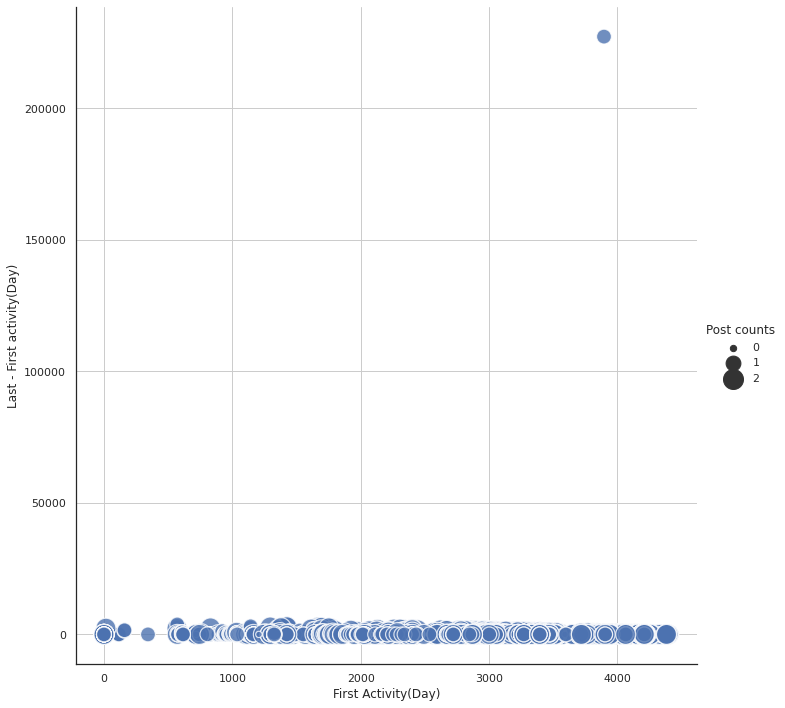

In [ ]:
plot_4D_Users(data_frame1)